# Data Preprocessing and Cleaning

This document outlines the steps and techniques used to preprocess and clean the dataset. Data preprocessing is a crucial step to ensure the quality and usability of the data before performing any analysis or building machine learning models.

## Objective

- Handle missing values
- Remove duplicates
- Normalize and scale numerical data
- Encode categorical variables
- Handle outliers
- Remove constant features
- Save processed datasets

## Requirements

- Python 3.x
- Required Libraries: `pandas`, `numpy`, `scikit-learn`, `matplotlib`, `seaborn`

## Steps

1. **Loading the Dataset**: 
   - Imported and loaded the dataset for preprocessing.
   - Displayed features and previewed the data.

2. **Removing Duplicates**: 
   - Identified and removed duplicate rows to ensure data integrity.

3. **Handling Missing Values**: 
   - Managed missing values based on their percentage:
     - < 5%: Imputed with mean (for numerical) or mode (for categorical).
     - 5–30%: Imputed with median (for numerical) or mode (for categorical).
     - 30–60%: Imputed cautiously, defaulting to mode for this dataset.
     - > 60%: Dropped features with excessive missing values.

4. **Encoding Categorical Variables**: 
   - Used one-hot encoding to transform categorical features into numerical form.

5. **Outlier Detection and Removal**: 
   - Detected outliers in numeric features using the Interquartile Range (IQR) method.
   - Removed outliers for cleaner data in one dataset.

6. **Normalization and Scaling**:
   - Applied Min-Max Scaling to normalize numeric features to a range of [0, 1] for both datasets (with and without outliers).

7. **Removing Constant Features**:
   - Identified and removed features with no variability.

8. **Saving Processed Datasets**:
   - Saved two versions of the processed dataset:
     - `data_final_no_outlier.csv`: Dataset with outliers removed.
     - `data_final_with_outlier.csv`: Dataset with outliers retained.

9. **Visualizing the Data** (Optional):
   - Visualized the distributions of features in both datasets to compare the effects of outlier removal and normalization.

This document provides a comprehensive overview of the preprocessing steps applied to prepare the dataset for further analysis or modeling.

# Introduction to Libraries

We are importing essential libraries for data manipulation (`pandas`, `numpy`), visualization (`matplotlib`, `seaborn`), and preprocessing (`MinMaxScaler`, `StandardScaler`) to prepare and analyze the data effectively.

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Loading the Dataset

We are loading the dataset from the file `train.csv` and performing the following actions:

1. **Loading the Data**: 
   - The dataset is loaded into a `pandas` DataFrame for easy manipulation and analysis.

2. **Displaying Features**:
   - A list of all column names (features) in the dataset is displayed to understand the structure of the data.

3. **Previewing the Data**:
   - The first few rows of the dataset are printed to inspect the data and check its format, completeness, and overall structure.

In [2]:
import pandas as pd

# File paths
data_file = "./communities+and+crime/communities.data"
names_file = "./communities+and+crime/communities.names"

# Step 1: Parse the .names file to extract attribute names
attribute_names = []
with open(names_file, "r") as f:
    for line in f:
        line = line.strip()
        if line.startswith("--"):  # Skip comment lines
            continue
        if line.startswith("@attribute"):  # Attribute definitions
            parts = line.split()
            attribute_name = parts[1]  # The second item is the attribute name
            attribute_names.append(attribute_name)

# Step 2: Load the .data file with extracted attribute names
data = pd.read_csv(data_file, header=None, names=attribute_names, na_values=["?", "NA"])

# Display the first few rows to inspect the dataset
print("\nPreview of the dataset:")
print(data.head())

# Step 3: Display basic info about the dataset
print("\nBasic Information about the Dataset:")
print(data.info())

# Step 4: Check for missing values
print("\nMissing Values Summary:")
print(data.isnull().sum())


Preview of the dataset:
   state  county  community        communityname  fold  population  \
0      8     NaN        NaN         Lakewoodcity     1        0.19   
1     53     NaN        NaN          Tukwilacity     1        0.00   
2     24     NaN        NaN         Aberdeentown     1        0.00   
3     34     5.0    81440.0  Willingborotownship     1        0.04   
4     42    95.0     6096.0    Bethlehemtownship     1        0.01   

   householdsize  racepctblack  racePctWhite  racePctAsian  ...  LandArea  \
0           0.33          0.02          0.90          0.12  ...      0.12   
1           0.16          0.12          0.74          0.45  ...      0.02   
2           0.42          0.49          0.56          0.17  ...      0.01   
3           0.77          1.00          0.08          0.12  ...      0.02   
4           0.55          0.02          0.95          0.09  ...      0.04   

   PopDens  PctUsePubTrans  PolicCars  PolicOperBudg  LemasPctPolicOnPatr  \
0     0.26    

# Handling Duplicates and Missing Values

1. **Removing Duplicate Rows**:
   - We identify and remove duplicate rows from the dataset to ensure data integrity and avoid redundancy.

2. **Handling Missing Values**:
   - We calculate the percentage of missing data for each feature and handle them based on predefined thresholds:
     - **< 5% Missing**: Impute missing values using the mean (for numerical data) or mode (for categorical data).
     - **5–30% Missing**: Use median imputation for numerical data or mode for categorical data for more robustness.
     - **30–60% Missing**: Warn about features with significant missing data and handle cautiously (default to mode imputation in this case, but user discretion is advised).
     - **> 60% Missing**: Drop features with excessive missing data unless they are deemed critical.

- **Removing Duplicates**: Prevents bias and inflated significance of repeated data points during analysis.
- **Handling Missing Values**: Ensures data completeness while minimizing the risk of introducing bias, maintaining the dataset's usability for further analysis or modeling.

In [ ]:
# Remove duplicate rows
print(f"Number of duplicate rows before removal: {data.duplicated().sum()}")
data = data.drop_duplicates()
print(f"Number of duplicate rows after removal: {data.duplicated().sum()}")

# Handling null values based on percentage of missing data
print("\nNull values per feature before handling:")
missing_percentages = data.isnull().mean() * 100
print(missing_percentages)

# Define actions for different ranges of missing data percentages
for col in data.columns:
    missing_percentage = missing_percentages[col]
    if missing_percentage < 5:
        # Less than 5% missing: Fill or drop individual rows
        if data[col].dtype in ['int64', 'float64']:
            data[col].fillna(data[col].mean(), inplace=True)
        else:
            data[col].fillna(data[col].mode()[0], inplace=True)
    elif 5 <= missing_percentage <= 30:
        # 5-30% missing: Impute using mean, median, or mode
        if data[col].dtype in ['int64', 'float64']:
            data[col].fillna(data[col].median(), inplace=True)  # Using median instead of mean for more robustness
        else:
            data[col].fillna(data[col].mode()[0], inplace=True)
    elif 30 < missing_percentage <= 60:
        # 30-60% missing: Be cautious; decide based on feature importance
        print(f"Feature '{col}' has {missing_percentage:.2f}% missing values; consider its importance before further action.")
        # Default action here is to drop the column, but you can modify based on domain knowledge
        data[col].fillna(data[col].mode()[0], inplace=True)  # Example: Impute with mode
    elif missing_percentage > 60:
        # More than 60% missing: Often best to drop the feature
        print(f"Feature '{col}' has {missing_percentage:.2f}% missing values; dropping the column.")
        data.drop(columns=[col], inplace=True)

print("\nNull values per feature after handling:")
print(data.isnull().sum())

Number of duplicate rows before removal: 0
Number of duplicate rows after removal: 0

Null values per feature before handling:
state                   0.000000
county                 58.876630
community              59.027081
communityname           0.000000
fold                    0.000000
                         ...    
LemasPctPolicOnPatr    84.002006
LemasGangUnitDeploy    84.002006
LemasPctOfficDrugUn     0.000000
PolicBudgPerPop        84.002006
ViolentCrimesPerPop     0.000000
Length: 128, dtype: float64
Feature 'county' has 58.88% missing values; consider its importance before further action.
Feature 'community' has 59.03% missing values; consider its importance before further action.
Feature 'LemasSwornFT' has 84.00% missing values; dropping the column.
Feature 'LemasSwFTPerPop' has 84.00% missing values; dropping the column.
Feature 'LemasSwFTFieldOps' has 84.00% missing values; dropping the column.
Feature 'LemasSwFTFieldPerPop' has 84.00% missing values; dropping the colum

C:\Users\mustapha\AppData\Local\Temp\ipykernel_20248\2759134192.py:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mean(), inplace=True)
C:\Users\mustapha\AppData\Local\Temp\ipykernel_20248\2759134192.py:30: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.


# Encoding Categorical Features and Analyzing Correlation

We are transforming categorical features into numerical representations and analyzing the relationships between features. Here's what we are doing:

1. **Encoding Categorical Features**:
   - Using one-hot encoding (`pd.get_dummies`) to convert categorical features into binary columns, enabling them to be used in numerical computations.

2. **Computing the Correlation Matrix**:
   - Calculating the correlation coefficients between all features to identify relationships and dependencies.

3. **Visualizing the Correlation Matrix**:
   - Creating a heatmap to visually inspect the strength and direction of relationships between features.

4. **Identifying Highly Correlated Pairs**:
   - Highlighting pairs of features with an absolute correlation greater than `0.8`, which could indicate redundancy or multicollinearity.

This process helps in feature selection and identifying which features might need to be removed or transformed to improve model performance.


Correlation Matrix:
                                 state    county  community      fold  \
state                         1.000000  0.243115   0.224357 -0.002857   
county                        0.243115  1.000000   0.323684  0.000409   
community                     0.224357  0.323684   1.000000 -0.009920   
fold                         -0.002857  0.000409  -0.009920  1.000000   
population                   -0.079569  0.069254  -0.059871 -0.007552   
...                                ...       ...        ...       ...   
communityname_Youngstowncity  0.014096  0.019125   0.055801 -0.011648   
communityname_YubaCitycity   -0.030995 -0.006011  -0.015086 -0.011648   
communityname_Yucaipacity    -0.030995 -0.006011  -0.015086 -0.035039   
communityname_Yukoncity       0.015463 -0.006011  -0.015086  0.027336   
communityname_Zanesvillecity  0.014096  0.024361   0.055869 -0.027242   

                              population  householdsize  racepctblack  \
state                        

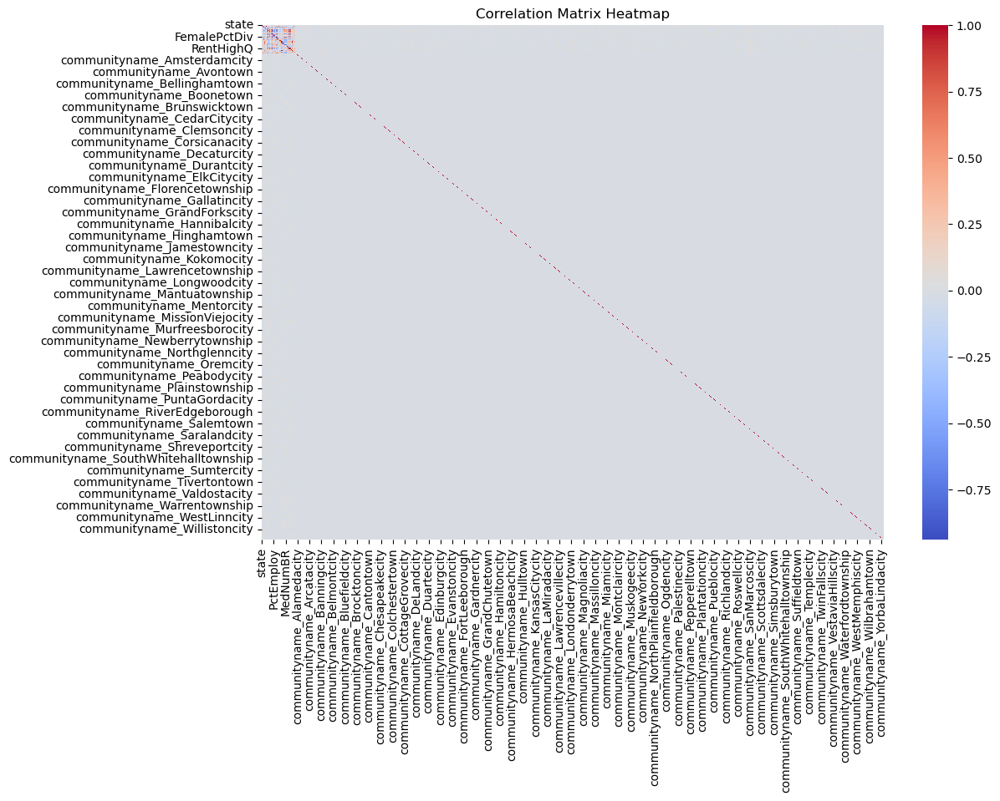


Highly Correlated Feature Pairs (|correlation| > 0.8):
numbUrban and population: 0.99
NumUnderPov and population: 0.95
NumIlleg and population: 0.89
HousVacant and population: 0.90
NumInShelters and population: 0.82
PersPerFam and householdsize: 0.85
PersPerOccupHous and householdsize: 0.89
PersPerOwnOccHous and householdsize: 0.83
PctIlleg and racepctblack: 0.81
PctIlleg and racePctWhite: -0.80
PctSpeakEnglOnly and racePctHisp: -0.89
PctNotSpeakEnglWell and racePctHisp: 0.89
PctPersDenseHous and racePctHisp: 0.88
agePct12t29 and agePct12t21: 0.82
agePct16t24 and agePct12t21: 0.89
agePct12t21 and agePct12t29: 0.82
agePct16t24 and agePct12t29: 0.93
agePct12t21 and agePct16t24: 0.89
agePct12t29 and agePct16t24: 0.93
pctWWage and agePct65up: -0.84
pctWSocSec and agePct65up: 0.94
population and numbUrban: 0.99
NumUnderPov and numbUrban: 0.94
NumIlleg and numbUrban: 0.88
HousVacant and numbUrban: 0.89
NumInShelters and numbUrban: 0.81
medFamInc and medIncome: 0.98
perCapInc and medIncome: 

In [4]:
# Encode categorical features
data_encoded = pd.get_dummies(data, drop_first=True)

# Compute the correlation matrix
correlation_matrix = data_encoded.corr()

# Display the correlation matrix
print("\nCorrelation Matrix:")
print(correlation_matrix)

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=False, cmap="coolwarm", fmt=".2f", cbar=True)
plt.title("Correlation Matrix Heatmap")
plt.show()

# Identify highly correlated pairs (absolute correlation > 0.8)
threshold = 0.8
high_correlation_pairs = []
for col in correlation_matrix.columns:
    for row in correlation_matrix.index:
        if abs(correlation_matrix.loc[row, col]) > threshold and row != col:
            high_correlation_pairs.append((row, col, correlation_matrix.loc[row, col]))

# Display highly correlated pairs
if high_correlation_pairs:
    print("\nHighly Correlated Feature Pairs (|correlation| > 0.8):")
    for pair in high_correlation_pairs:
        print(f"{pair[0]} and {pair[1]}: {pair[2]:.2f}")
else:
    print("\nNo highly correlated feature pairs found.")

# Feature Distributions

We are analyzing the distributions of each feature in the dataset to better understand their characteristics and patterns. This includes:

1. **Summary Statistics**:
   - Displaying descriptive statistics for each feature (e.g., mean, min, max, std, etc.) to understand the data's range, central tendency, and variability.

2. **Visualization**:
   - **Numerical Features**:
     - Using histograms with KDE (Kernel Density Estimation) to visualize the distribution and density of numerical features.
   - **Categorical Features**:
     - Using count plots to display the frequency of each category.

This helps identify potential issues like skewness, outliers, or imbalanced categories, guiding further preprocessing steps.

Distributions for each feature:

Feature: state
count    1994.000000
mean       28.683551
std        16.397553
min         1.000000
25%        12.000000
50%        34.000000
75%        42.000000
max        56.000000
Name: state, dtype: float64


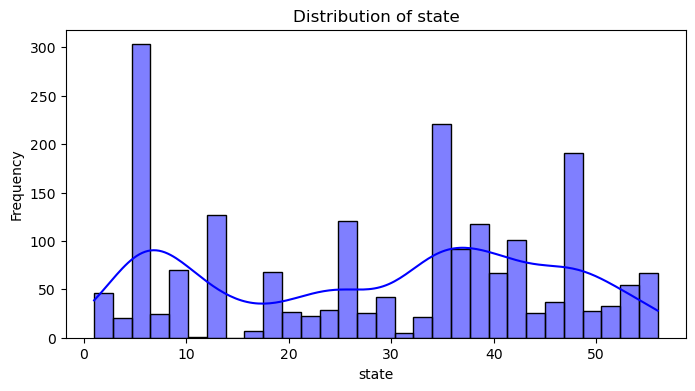


Feature: county
count    1994.000000
mean       25.957874
std        85.572545
min         1.000000
25%         3.000000
50%         3.000000
75%        17.000000
max       840.000000
Name: county, dtype: float64


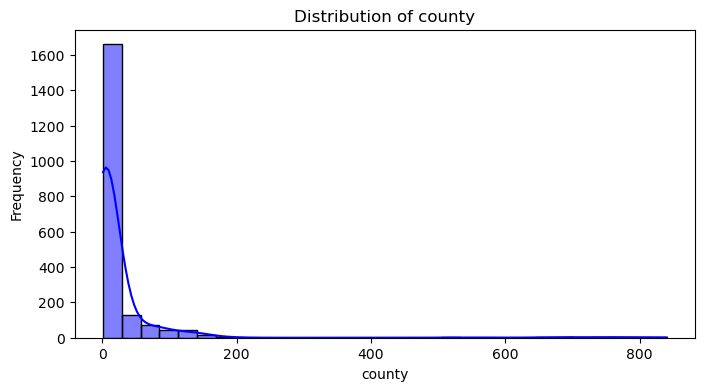


Feature: community
count     1994.000000
mean     19514.980441
std      27498.595916
min         70.000000
25%       1000.000000
50%       1000.000000
75%      39596.250000
max      94597.000000
Name: community, dtype: float64


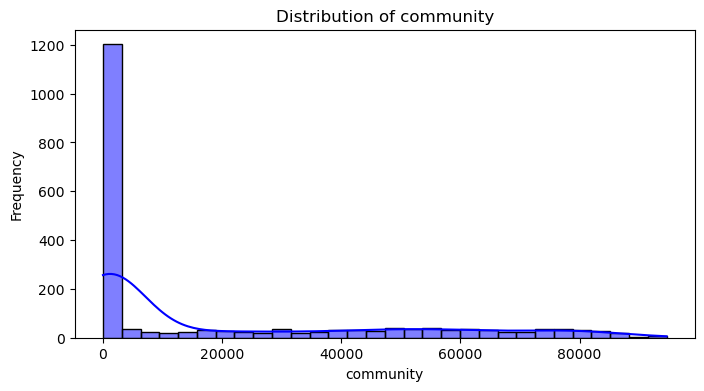


Feature: communityname
count               1994
unique              1828
top       Greenvillecity
freq                   5
Name: communityname, dtype: object


C:\Users\mustapha\AppData\Local\Temp\ipykernel_20248\396309711.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=data[feature], order=data[feature].value_counts().index, palette="viridis")


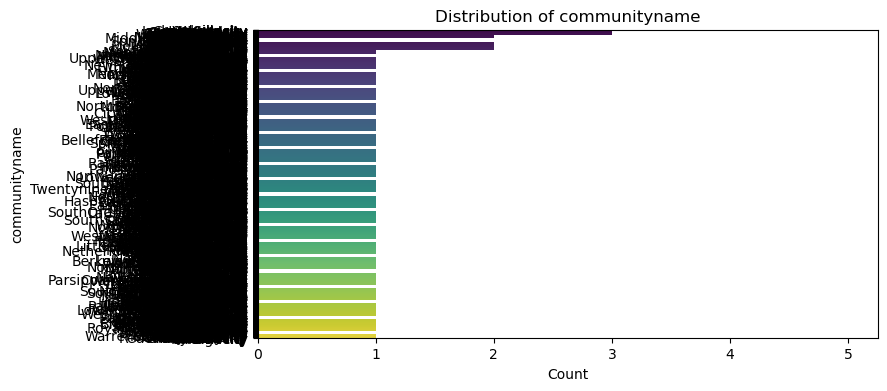


Feature: fold
count    1994.000000
mean        5.493982
std         2.873694
min         1.000000
25%         3.000000
50%         5.000000
75%         8.000000
max        10.000000
Name: fold, dtype: float64


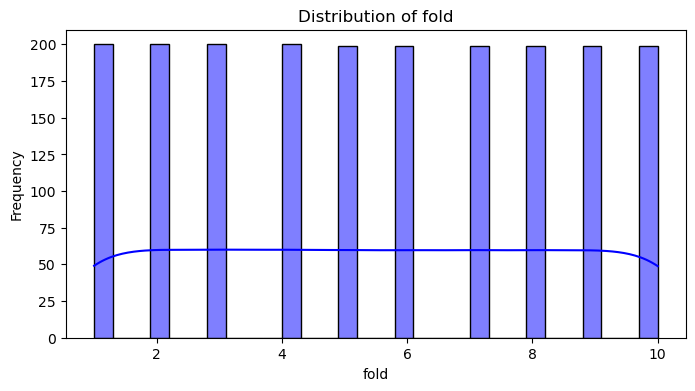


Feature: population
count    1994.000000
mean        0.057593
std         0.126906
min         0.000000
25%         0.010000
50%         0.020000
75%         0.050000
max         1.000000
Name: population, dtype: float64


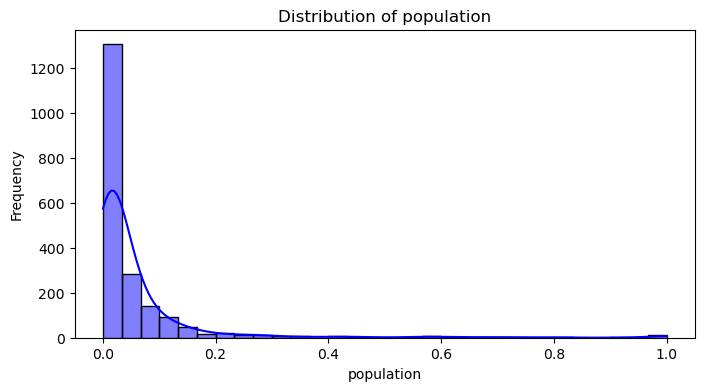


Feature: householdsize
count    1994.000000
mean        0.463395
std         0.163717
min         0.000000
25%         0.350000
50%         0.440000
75%         0.540000
max         1.000000
Name: householdsize, dtype: float64


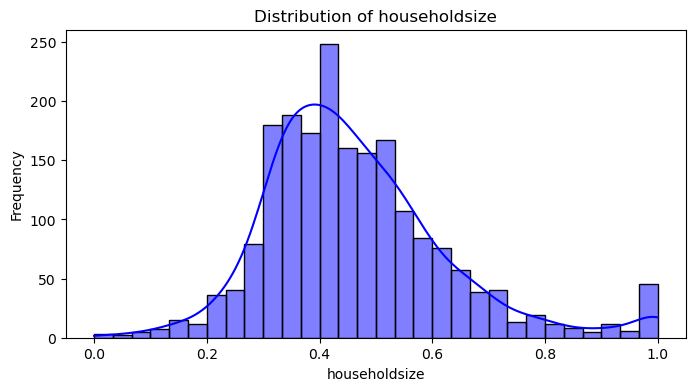


Feature: racepctblack
count    1994.000000
mean        0.179629
std         0.253442
min         0.000000
25%         0.020000
50%         0.060000
75%         0.230000
max         1.000000
Name: racepctblack, dtype: float64


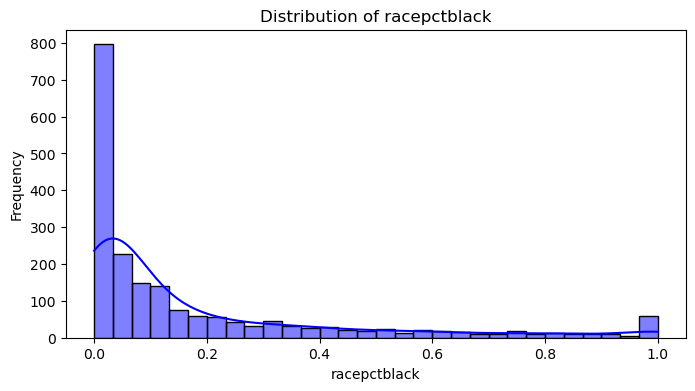


Feature: racePctWhite
count    1994.000000
mean        0.753716
std         0.244039
min         0.000000
25%         0.630000
50%         0.850000
75%         0.940000
max         1.000000
Name: racePctWhite, dtype: float64


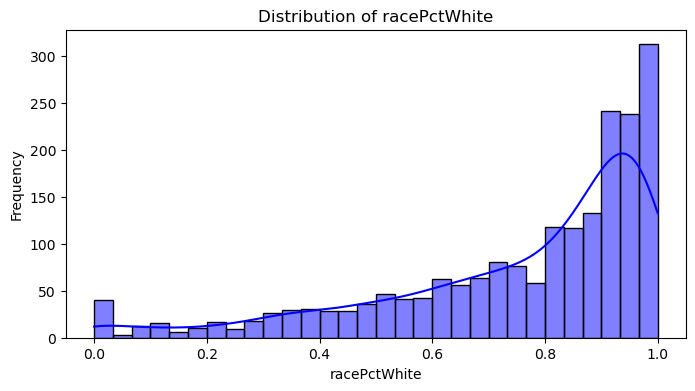


Feature: racePctAsian
count    1994.000000
mean        0.153681
std         0.208877
min         0.000000
25%         0.040000
50%         0.070000
75%         0.170000
max         1.000000
Name: racePctAsian, dtype: float64


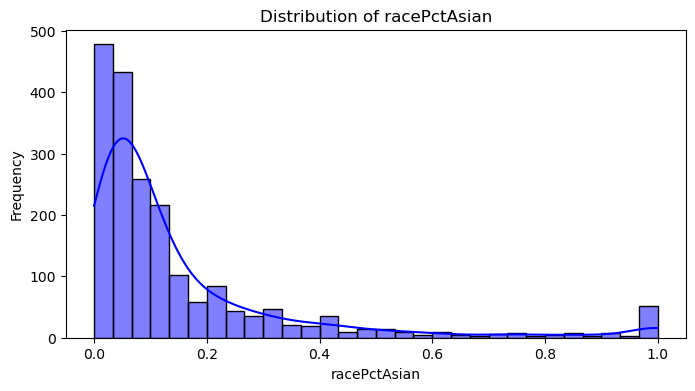


Feature: racePctHisp
count    1994.000000
mean        0.144022
std         0.232492
min         0.000000
25%         0.010000
50%         0.040000
75%         0.160000
max         1.000000
Name: racePctHisp, dtype: float64


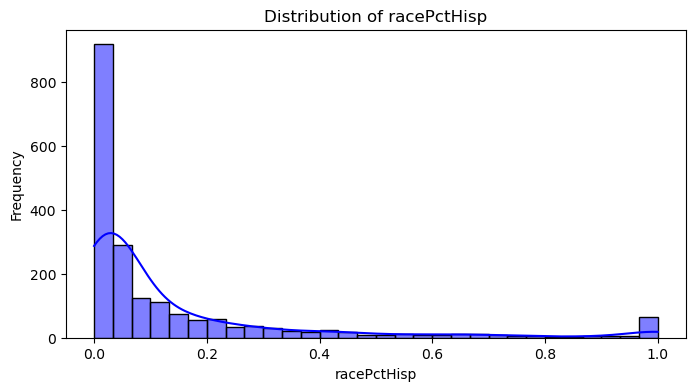


Feature: agePct12t21
count    1994.000000
mean        0.424218
std         0.155196
min         0.000000
25%         0.340000
50%         0.400000
75%         0.470000
max         1.000000
Name: agePct12t21, dtype: float64


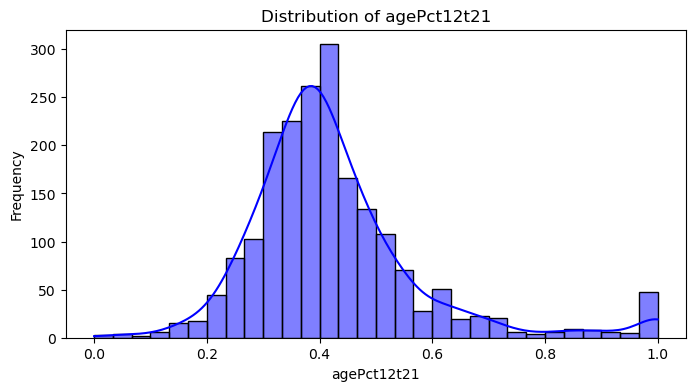


Feature: agePct12t29
count    1994.000000
mean        0.493867
std         0.143564
min         0.000000
25%         0.410000
50%         0.480000
75%         0.540000
max         1.000000
Name: agePct12t29, dtype: float64


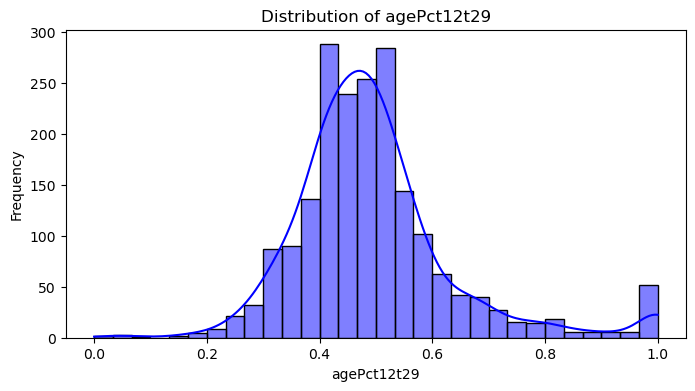


Feature: agePct16t24
count    1994.000000
mean        0.336264
std         0.166505
min         0.000000
25%         0.250000
50%         0.290000
75%         0.360000
max         1.000000
Name: agePct16t24, dtype: float64


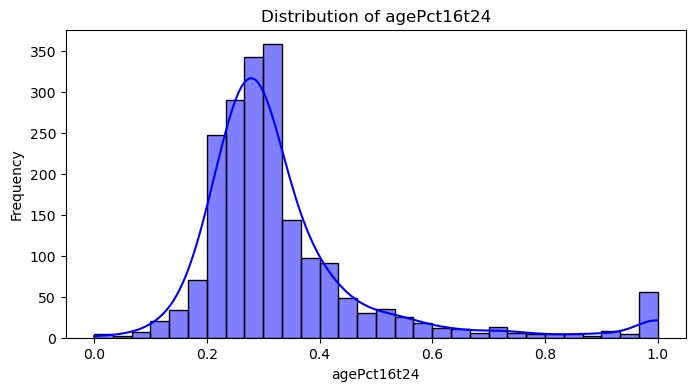


Feature: agePct65up
count    1994.000000
mean        0.423164
std         0.179185
min         0.000000
25%         0.300000
50%         0.420000
75%         0.530000
max         1.000000
Name: agePct65up, dtype: float64


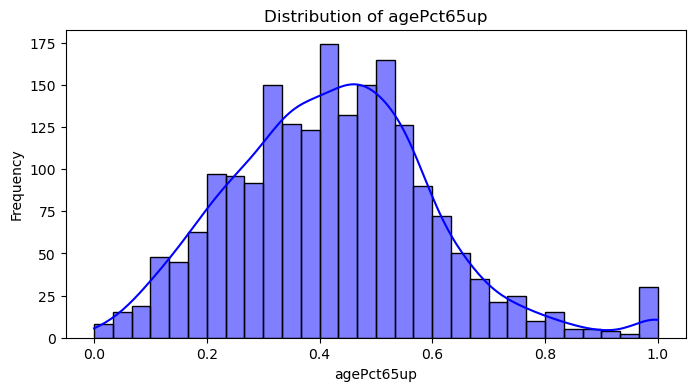


Feature: numbUrban
count    1994.000000
mean        0.064072
std         0.128256
min         0.000000
25%         0.000000
50%         0.030000
75%         0.070000
max         1.000000
Name: numbUrban, dtype: float64


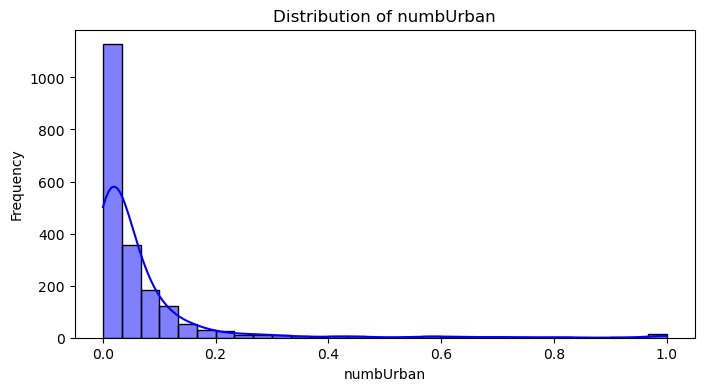


Feature: pctUrban
count    1994.000000
mean        0.696269
std         0.444811
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: pctUrban, dtype: float64


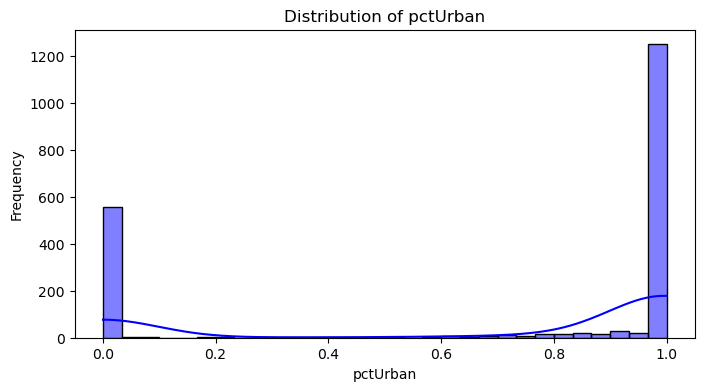


Feature: medIncome
count    1994.000000
mean        0.361123
std         0.209362
min         0.000000
25%         0.200000
50%         0.320000
75%         0.490000
max         1.000000
Name: medIncome, dtype: float64


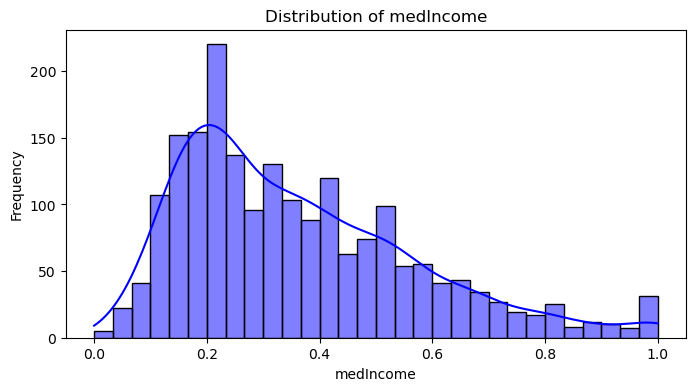


Feature: pctWWage
count    1994.000000
mean        0.558154
std         0.182913
min         0.000000
25%         0.440000
50%         0.560000
75%         0.690000
max         1.000000
Name: pctWWage, dtype: float64


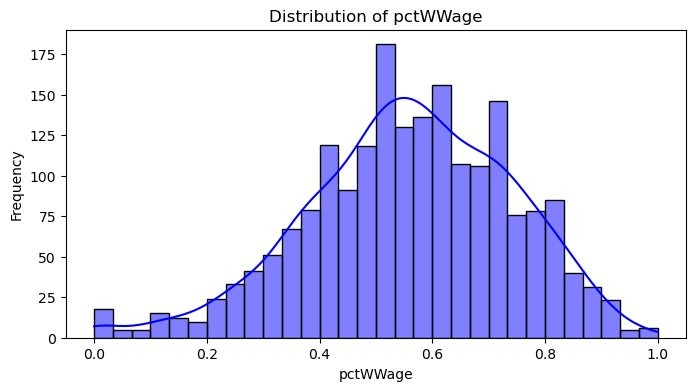


Feature: pctWFarmSelf
count    1994.000000
mean        0.291570
std         0.204108
min         0.000000
25%         0.160000
50%         0.230000
75%         0.370000
max         1.000000
Name: pctWFarmSelf, dtype: float64


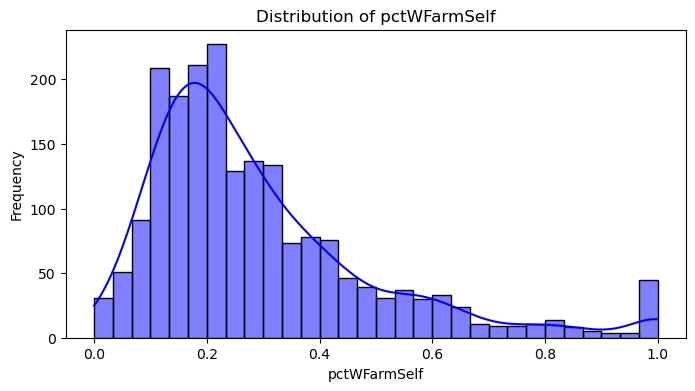


Feature: pctWInvInc
count    1994.000000
mean        0.495687
std         0.178071
min         0.000000
25%         0.370000
50%         0.480000
75%         0.620000
max         1.000000
Name: pctWInvInc, dtype: float64


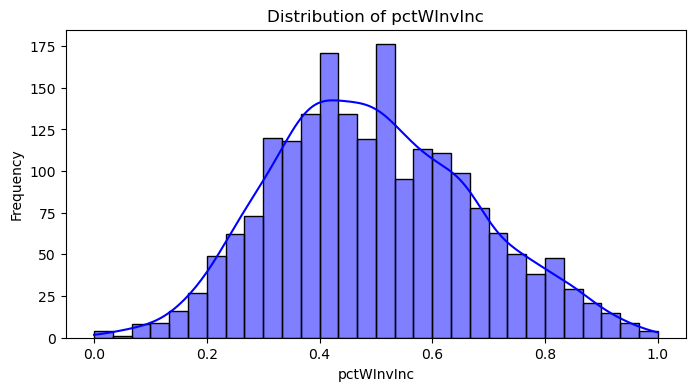


Feature: pctWSocSec
count    1994.000000
mean        0.471133
std         0.173619
min         0.000000
25%         0.350000
50%         0.475000
75%         0.580000
max         1.000000
Name: pctWSocSec, dtype: float64


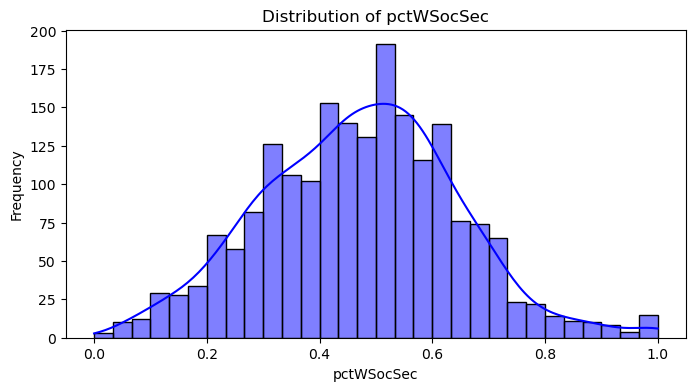


Feature: pctWPubAsst
count    1994.000000
mean        0.317778
std         0.222137
min         0.000000
25%         0.142500
50%         0.260000
75%         0.440000
max         1.000000
Name: pctWPubAsst, dtype: float64


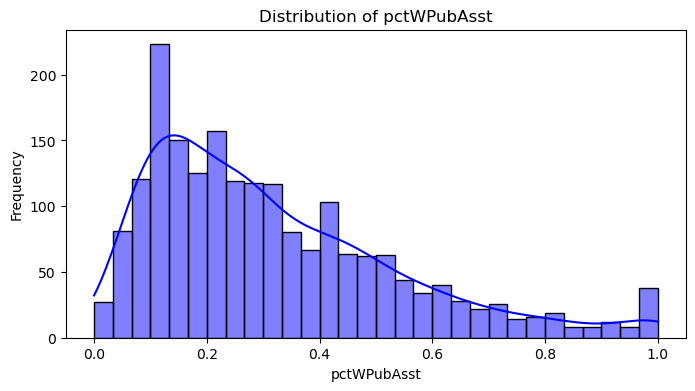


Feature: pctWRetire
count    1994.000000
mean        0.479248
std         0.167564
min         0.000000
25%         0.360000
50%         0.470000
75%         0.580000
max         1.000000
Name: pctWRetire, dtype: float64


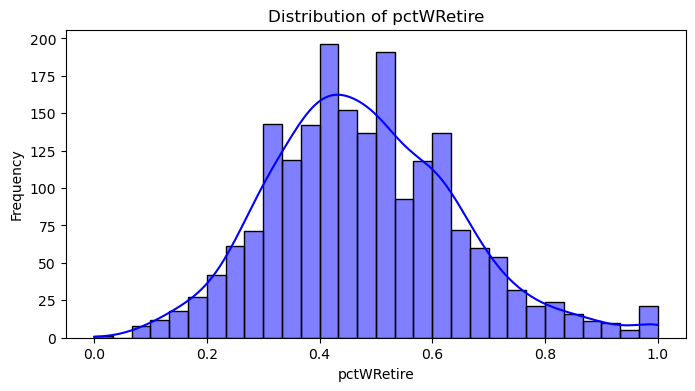


Feature: medFamInc
count    1994.000000
mean        0.375677
std         0.198257
min         0.000000
25%         0.230000
50%         0.330000
75%         0.480000
max         1.000000
Name: medFamInc, dtype: float64


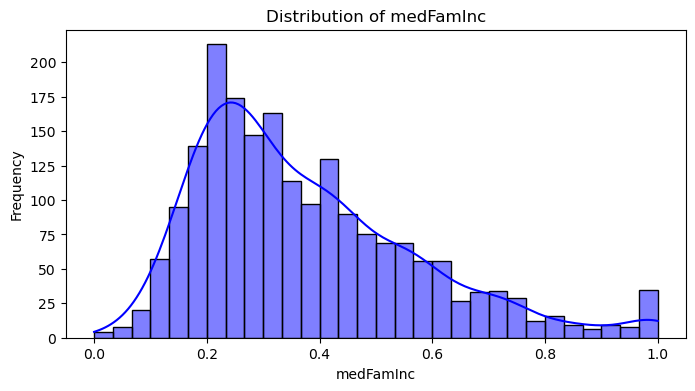


Feature: perCapInc
count    1994.000000
mean        0.350251
std         0.191109
min         0.000000
25%         0.220000
50%         0.300000
75%         0.430000
max         1.000000
Name: perCapInc, dtype: float64


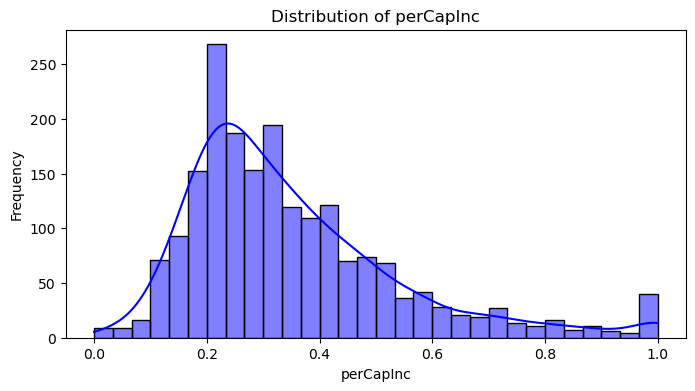


Feature: whitePerCap
count    1994.000000
mean        0.368049
std         0.186804
min         0.000000
25%         0.240000
50%         0.320000
75%         0.440000
max         1.000000
Name: whitePerCap, dtype: float64


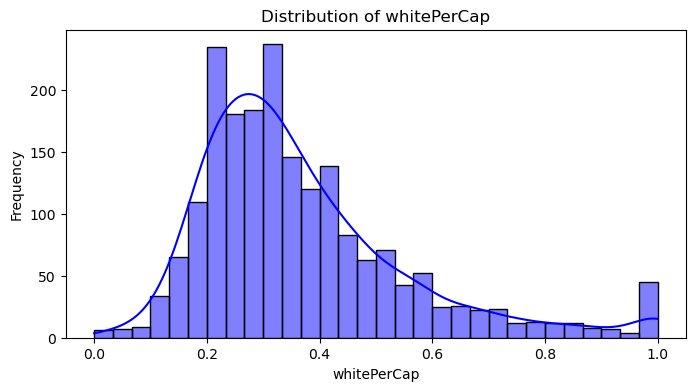


Feature: blackPerCap
count    1994.000000
mean        0.291098
std         0.171593
min         0.000000
25%         0.172500
50%         0.250000
75%         0.380000
max         1.000000
Name: blackPerCap, dtype: float64


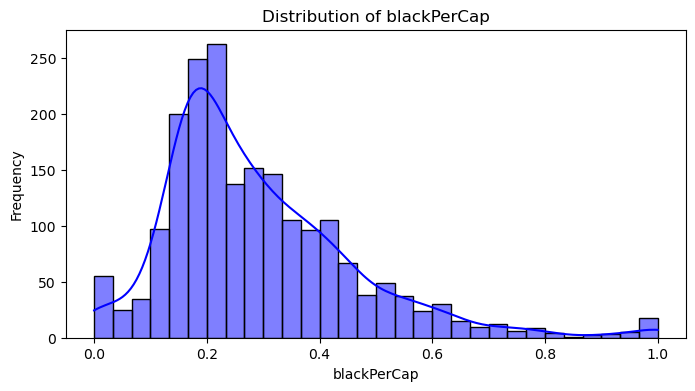


Feature: indianPerCap
count    1994.000000
mean        0.203506
std         0.164775
min         0.000000
25%         0.110000
50%         0.170000
75%         0.250000
max         1.000000
Name: indianPerCap, dtype: float64


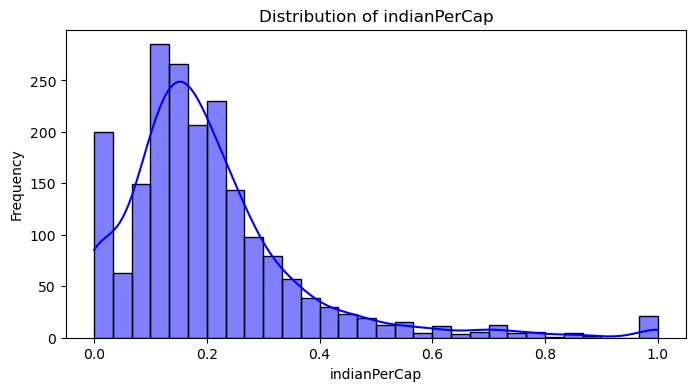


Feature: AsianPerCap
count    1994.000000
mean        0.322357
std         0.195411
min         0.000000
25%         0.190000
50%         0.280000
75%         0.400000
max         1.000000
Name: AsianPerCap, dtype: float64


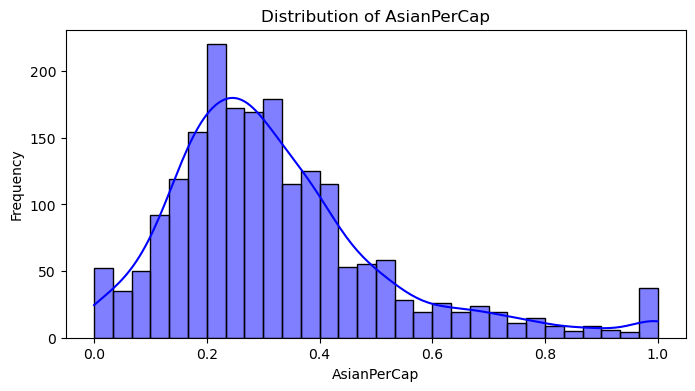


Feature: OtherPerCap
count    1994.000000
mean        0.284742
std         0.190960
min         0.000000
25%         0.170000
50%         0.250000
75%         0.360000
max         1.000000
Name: OtherPerCap, dtype: float64


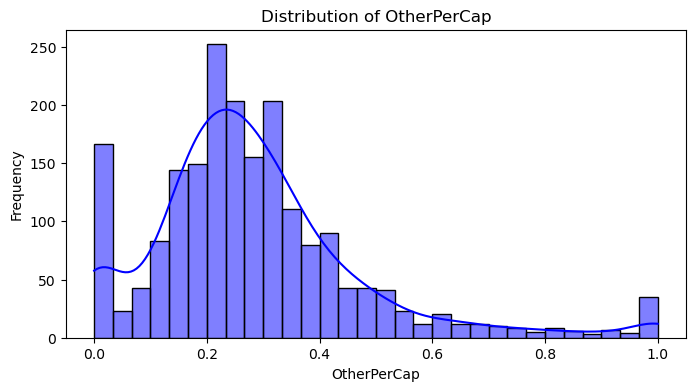


Feature: HispPerCap
count    1994.000000
mean        0.386279
std         0.183081
min         0.000000
25%         0.260000
50%         0.345000
75%         0.480000
max         1.000000
Name: HispPerCap, dtype: float64


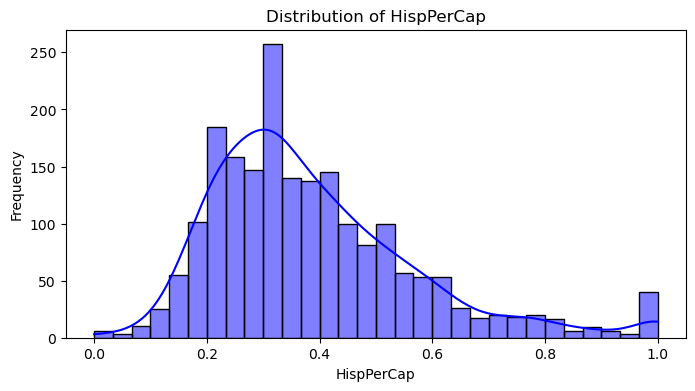


Feature: NumUnderPov
count    1994.000000
mean        0.055507
std         0.127941
min         0.000000
25%         0.010000
50%         0.020000
75%         0.050000
max         1.000000
Name: NumUnderPov, dtype: float64


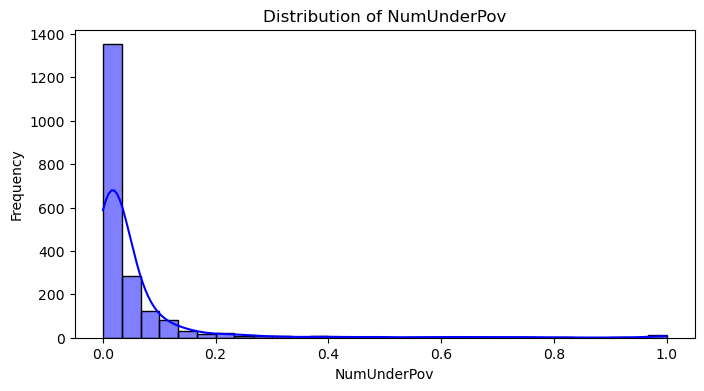


Feature: PctPopUnderPov
count    1994.000000
mean        0.303024
std         0.228474
min         0.000000
25%         0.110000
50%         0.250000
75%         0.450000
max         1.000000
Name: PctPopUnderPov, dtype: float64


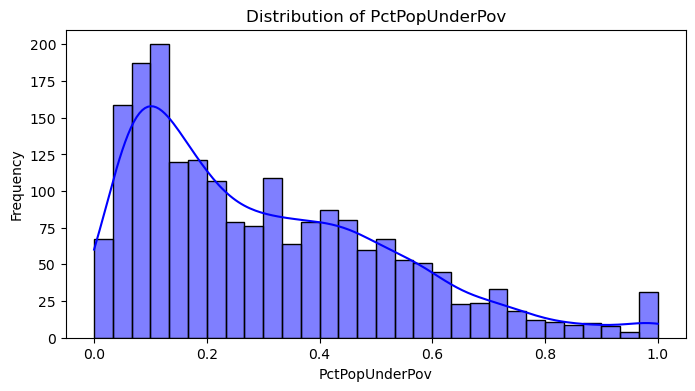


Feature: PctLess9thGrade
count    1994.000000
mean        0.315807
std         0.213360
min         0.000000
25%         0.160000
50%         0.270000
75%         0.420000
max         1.000000
Name: PctLess9thGrade, dtype: float64


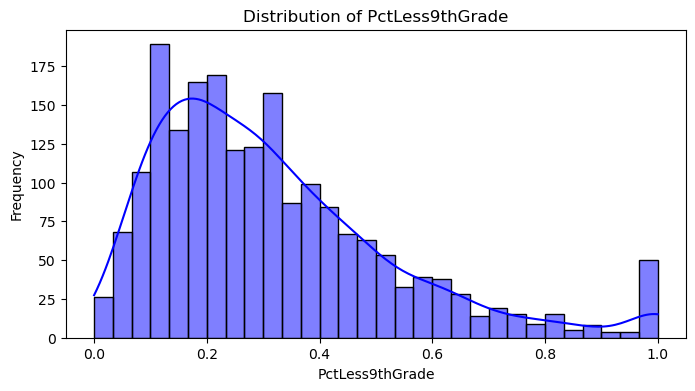


Feature: PctNotHSGrad
count    1994.000000
mean        0.383330
std         0.202508
min         0.000000
25%         0.230000
50%         0.360000
75%         0.510000
max         1.000000
Name: PctNotHSGrad, dtype: float64


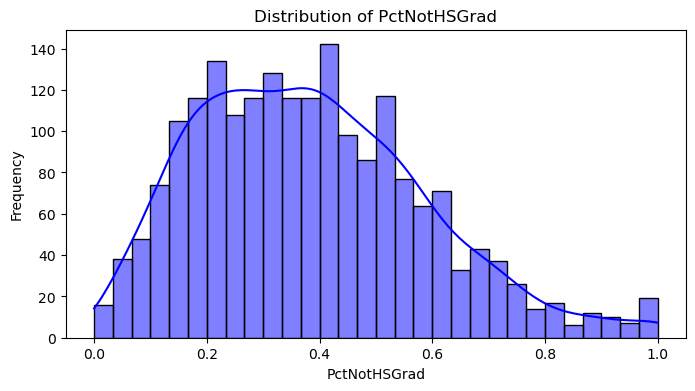


Feature: PctBSorMore
count    1994.000000
mean        0.361675
std         0.209193
min         0.000000
25%         0.210000
50%         0.310000
75%         0.460000
max         1.000000
Name: PctBSorMore, dtype: float64


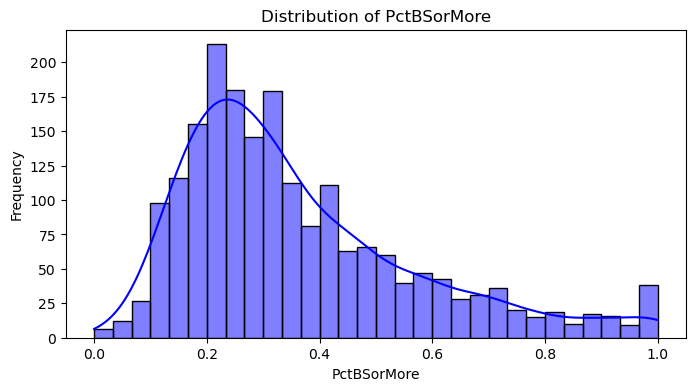


Feature: PctUnemployed
count    1994.000000
mean        0.363531
std         0.202171
min         0.000000
25%         0.220000
50%         0.320000
75%         0.480000
max         1.000000
Name: PctUnemployed, dtype: float64


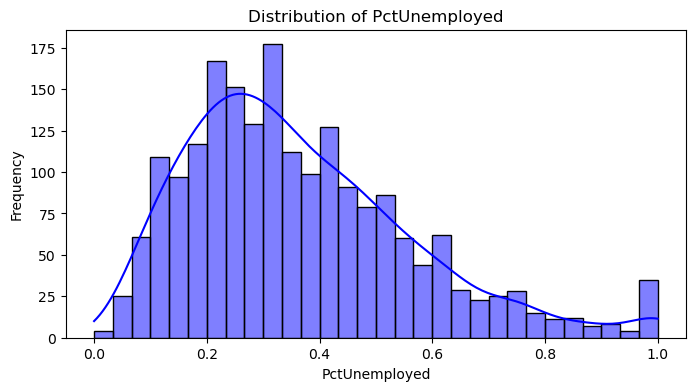


Feature: PctEmploy
count    1994.000000
mean        0.501073
std         0.174036
min         0.000000
25%         0.380000
50%         0.510000
75%         0.627500
max         1.000000
Name: PctEmploy, dtype: float64


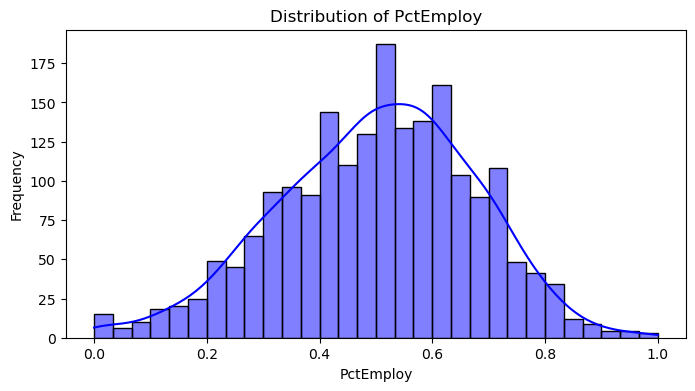


Feature: PctEmplManu
count    1994.000000
mean        0.396384
std         0.202386
min         0.000000
25%         0.250000
50%         0.370000
75%         0.520000
max         1.000000
Name: PctEmplManu, dtype: float64


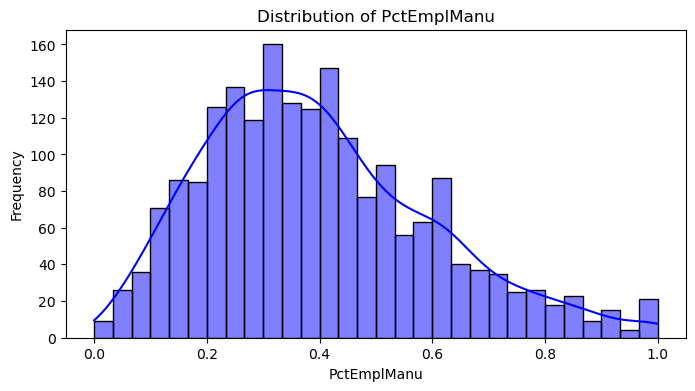


Feature: PctEmplProfServ
count    1994.000000
mean        0.440597
std         0.175457
min         0.000000
25%         0.320000
50%         0.410000
75%         0.530000
max         1.000000
Name: PctEmplProfServ, dtype: float64


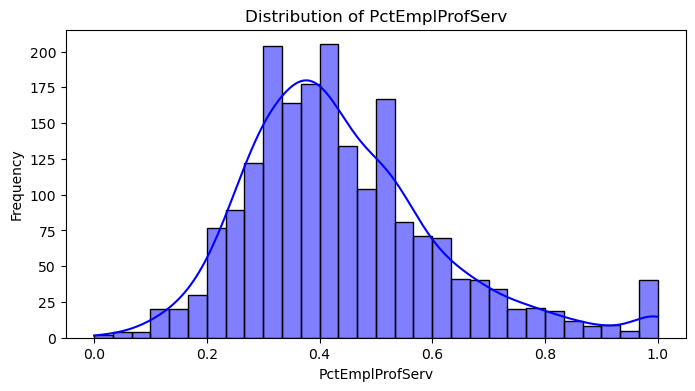


Feature: PctOccupManu
count    1994.000000
mean        0.391224
std         0.198922
min         0.000000
25%         0.240000
50%         0.370000
75%         0.510000
max         1.000000
Name: PctOccupManu, dtype: float64


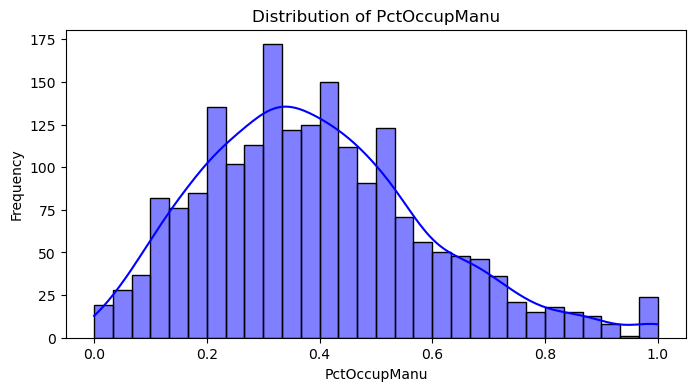


Feature: PctOccupMgmtProf
count    1994.000000
mean        0.441339
std         0.186292
min         0.000000
25%         0.310000
50%         0.400000
75%         0.540000
max         1.000000
Name: PctOccupMgmtProf, dtype: float64


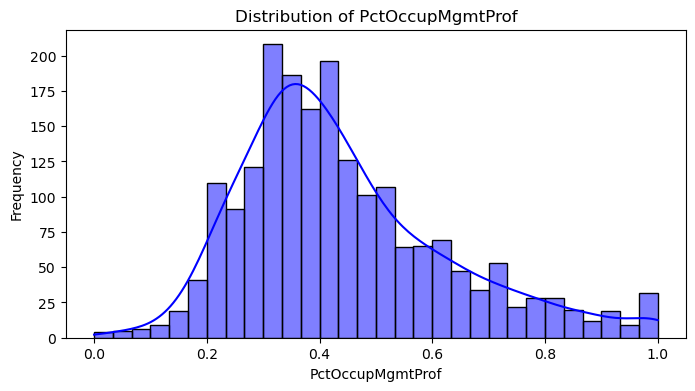


Feature: MalePctDivorce
count    1994.000000
mean        0.461244
std         0.182460
min         0.000000
25%         0.330000
50%         0.470000
75%         0.590000
max         1.000000
Name: MalePctDivorce, dtype: float64


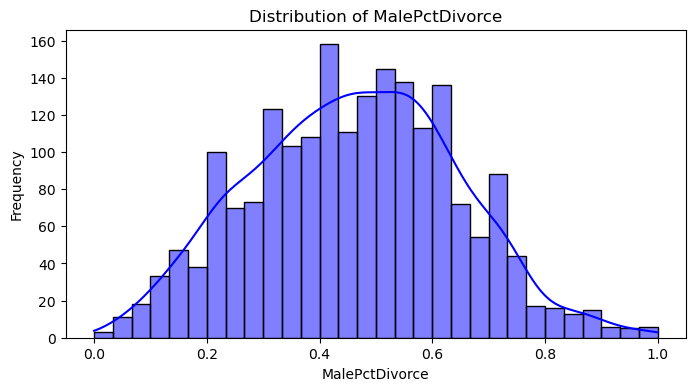


Feature: MalePctNevMarr
count    1994.000000
mean        0.434453
std         0.175437
min         0.000000
25%         0.310000
50%         0.400000
75%         0.500000
max         1.000000
Name: MalePctNevMarr, dtype: float64


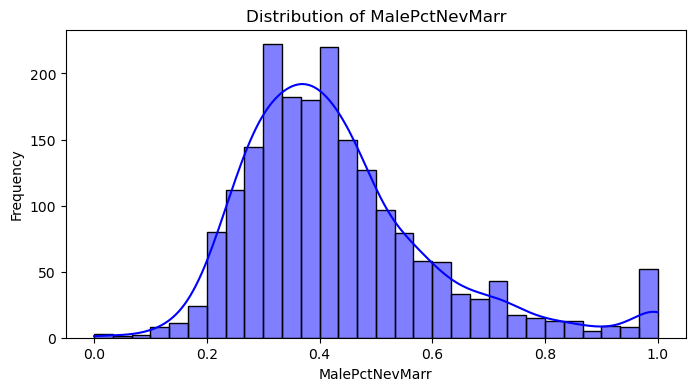


Feature: FemalePctDiv
count    1994.000000
mean        0.487568
std         0.175170
min         0.000000
25%         0.360000
50%         0.500000
75%         0.620000
max         1.000000
Name: FemalePctDiv, dtype: float64


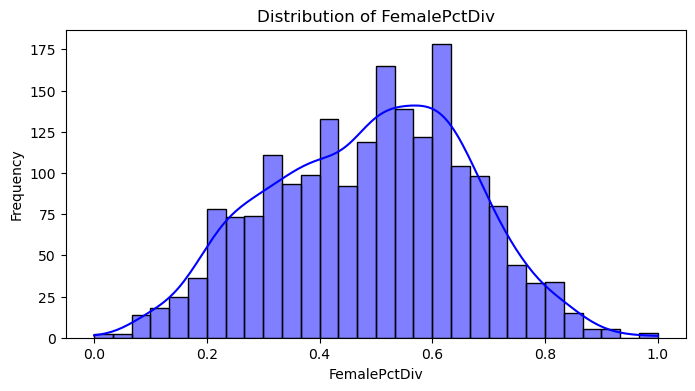


Feature: TotalPctDiv
count    1994.000000
mean        0.494273
std         0.183607
min         0.000000
25%         0.360000
50%         0.500000
75%         0.630000
max         1.000000
Name: TotalPctDiv, dtype: float64


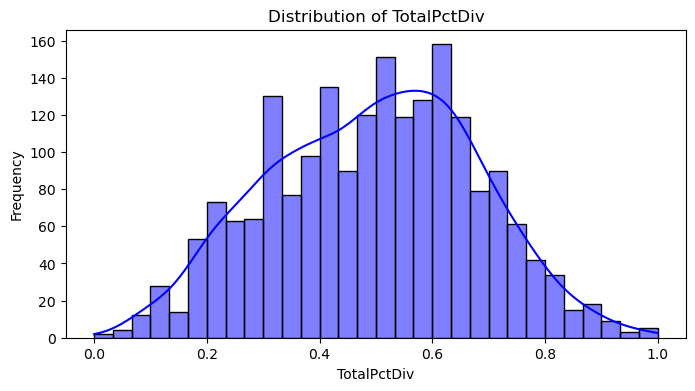


Feature: PersPerFam
count    1994.000000
mean        0.487748
std         0.154594
min         0.000000
25%         0.400000
50%         0.470000
75%         0.560000
max         1.000000
Name: PersPerFam, dtype: float64


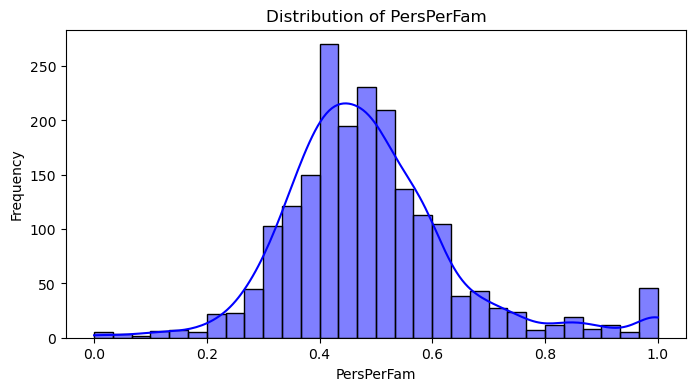


Feature: PctFam2Par
count    1994.000000
mean        0.610918
std         0.201976
min         0.000000
25%         0.490000
50%         0.630000
75%         0.760000
max         1.000000
Name: PctFam2Par, dtype: float64


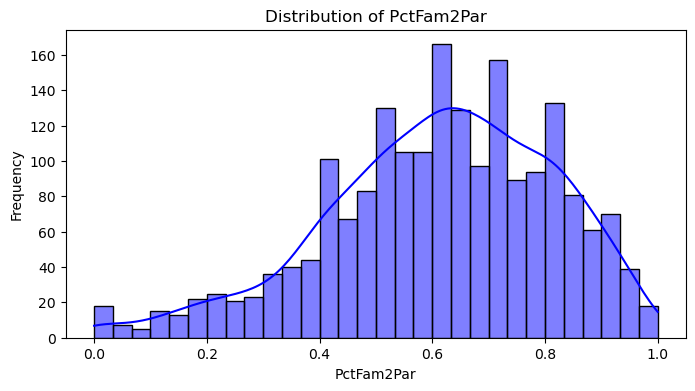


Feature: PctKids2Par
count    1994.000000
mean        0.620657
std         0.206353
min         0.000000
25%         0.490000
50%         0.640000
75%         0.780000
max         1.000000
Name: PctKids2Par, dtype: float64


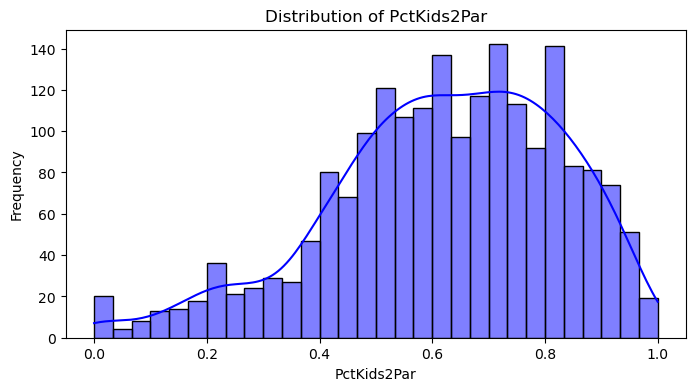


Feature: PctYoungKids2Par
count    1994.000000
mean        0.664032
std         0.218749
min         0.000000
25%         0.530000
50%         0.700000
75%         0.840000
max         1.000000
Name: PctYoungKids2Par, dtype: float64


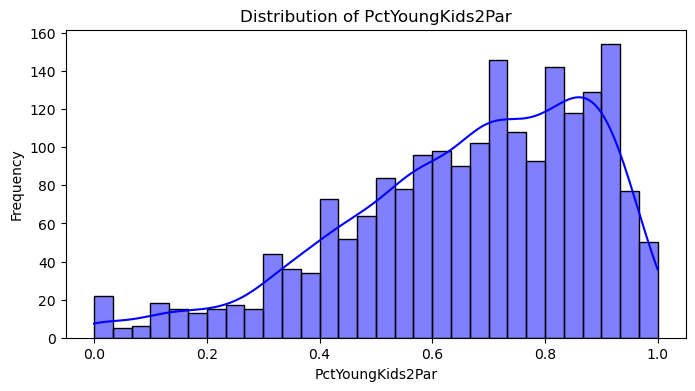


Feature: PctTeen2Par
count    1994.000000
mean        0.582884
std         0.191507
min         0.000000
25%         0.480000
50%         0.610000
75%         0.720000
max         1.000000
Name: PctTeen2Par, dtype: float64


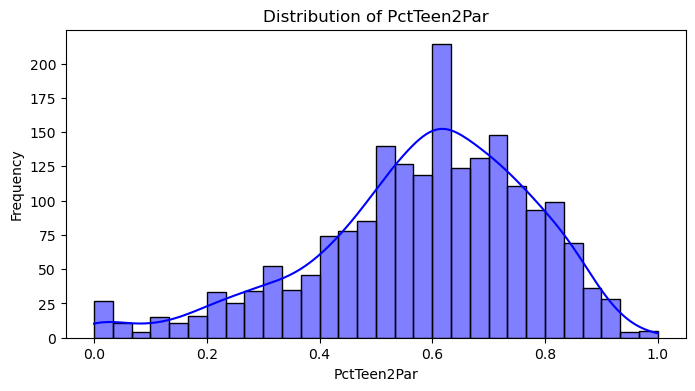


Feature: PctWorkMomYoungKids
count    1994.000000
mean        0.501449
std         0.168612
min         0.000000
25%         0.390000
50%         0.510000
75%         0.620000
max         1.000000
Name: PctWorkMomYoungKids, dtype: float64


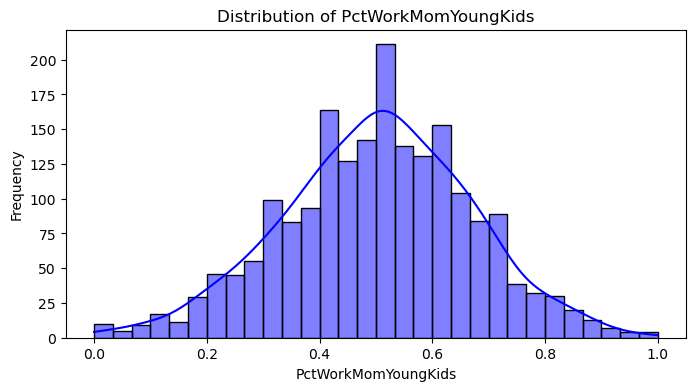


Feature: PctWorkMom
count    1994.000000
mean        0.526690
std         0.175241
min         0.000000
25%         0.420000
50%         0.540000
75%         0.650000
max         1.000000
Name: PctWorkMom, dtype: float64


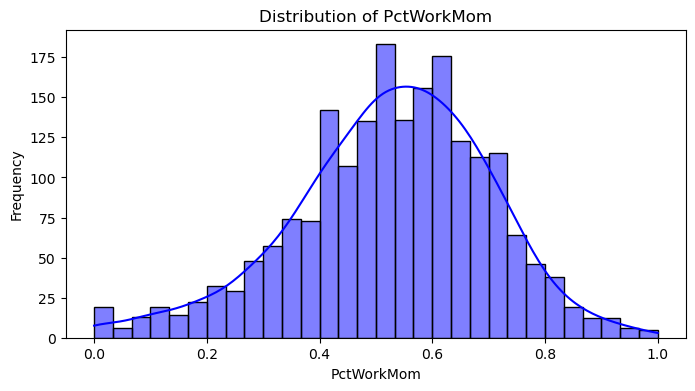


Feature: NumIlleg
count    1994.000000
mean        0.036294
std         0.108671
min         0.000000
25%         0.000000
50%         0.010000
75%         0.020000
max         1.000000
Name: NumIlleg, dtype: float64


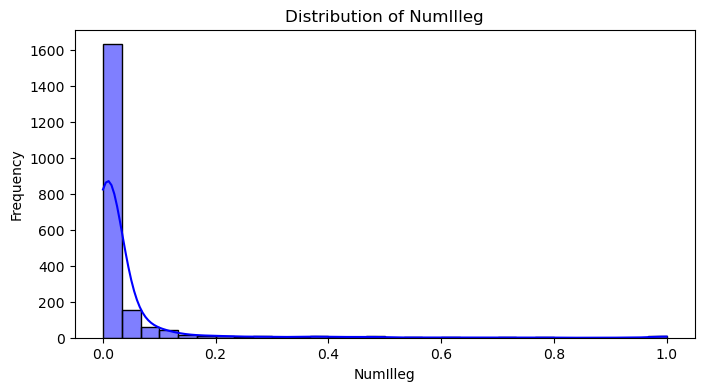


Feature: PctIlleg
count    1994.000000
mean        0.249995
std         0.229946
min         0.000000
25%         0.090000
50%         0.170000
75%         0.320000
max         1.000000
Name: PctIlleg, dtype: float64


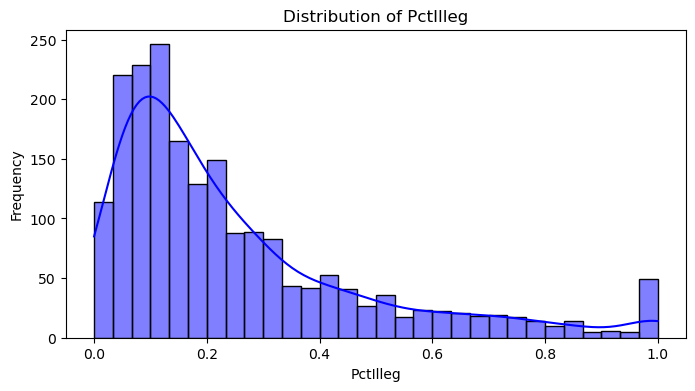


Feature: NumImmig
count    1994.000000
mean        0.030060
std         0.087189
min         0.000000
25%         0.000000
50%         0.010000
75%         0.020000
max         1.000000
Name: NumImmig, dtype: float64


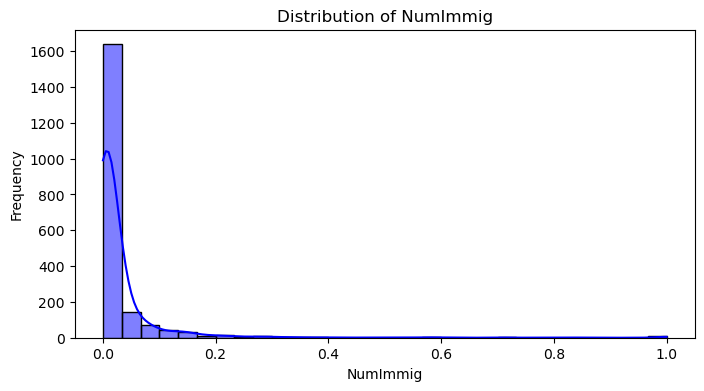


Feature: PctImmigRecent
count    1994.000000
mean        0.320211
std         0.219088
min         0.000000
25%         0.160000
50%         0.290000
75%         0.430000
max         1.000000
Name: PctImmigRecent, dtype: float64


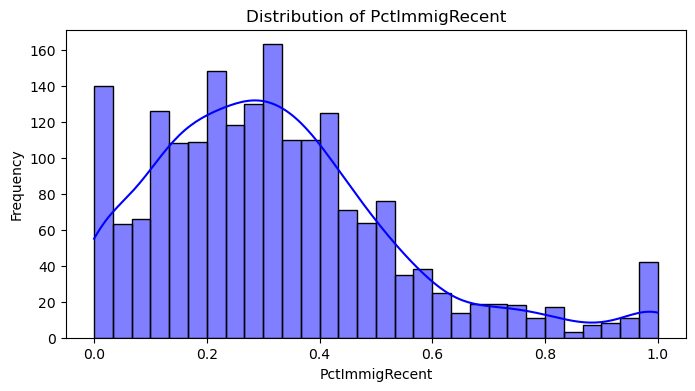


Feature: PctImmigRec5
count    1994.000000
mean        0.360622
std         0.210924
min         0.000000
25%         0.200000
50%         0.340000
75%         0.480000
max         1.000000
Name: PctImmigRec5, dtype: float64


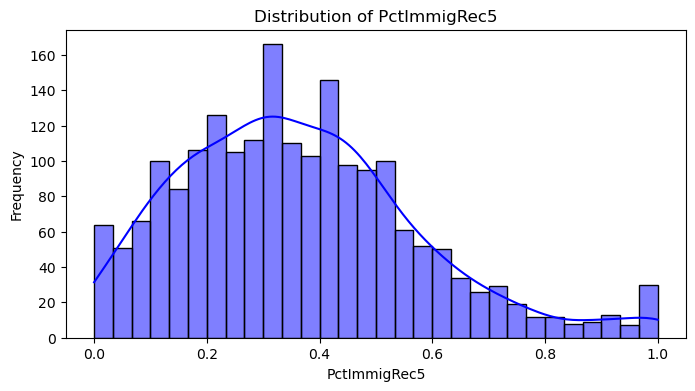


Feature: PctImmigRec8
count    1994.000000
mean        0.399077
std         0.201498
min         0.000000
25%         0.250000
50%         0.390000
75%         0.530000
max         1.000000
Name: PctImmigRec8, dtype: float64


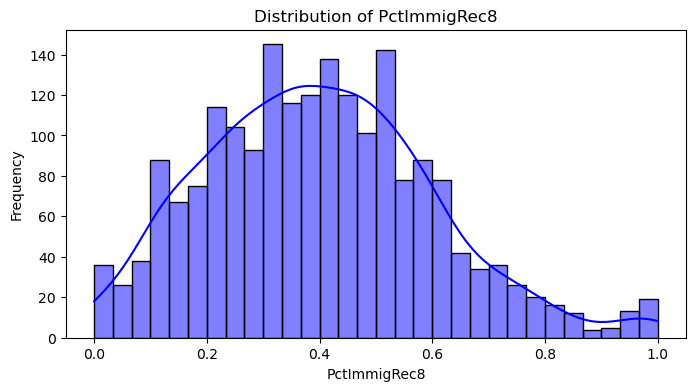


Feature: PctImmigRec10
count    1994.000000
mean        0.427879
std         0.194970
min         0.000000
25%         0.280000
50%         0.430000
75%         0.560000
max         1.000000
Name: PctImmigRec10, dtype: float64


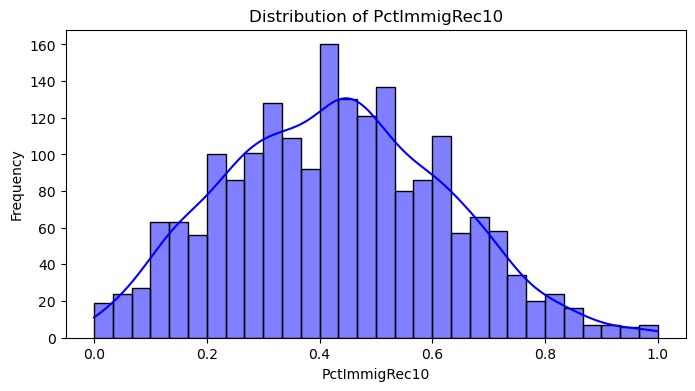


Feature: PctRecentImmig
count    1994.000000
mean        0.181364
std         0.235792
min         0.000000
25%         0.030000
50%         0.090000
75%         0.230000
max         1.000000
Name: PctRecentImmig, dtype: float64


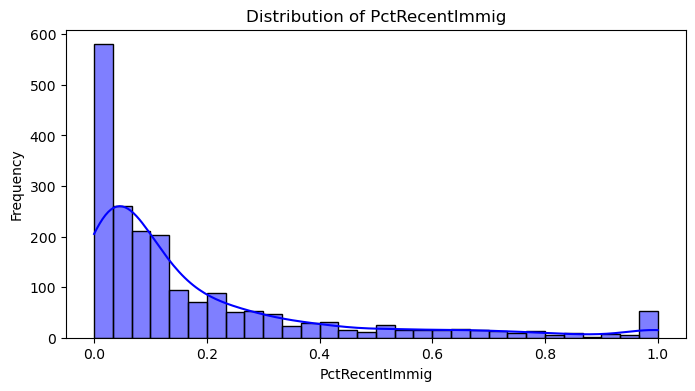


Feature: PctRecImmig5
count    1994.000000
mean        0.182126
std         0.236333
min         0.000000
25%         0.030000
50%         0.080000
75%         0.230000
max         1.000000
Name: PctRecImmig5, dtype: float64


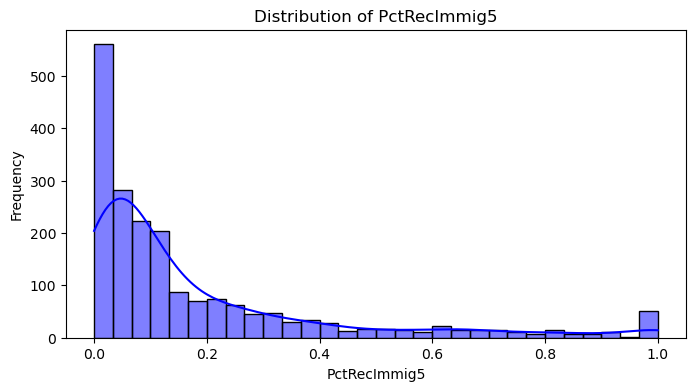


Feature: PctRecImmig8
count    1994.000000
mean        0.184774
std         0.236739
min         0.000000
25%         0.030000
50%         0.090000
75%         0.230000
max         1.000000
Name: PctRecImmig8, dtype: float64


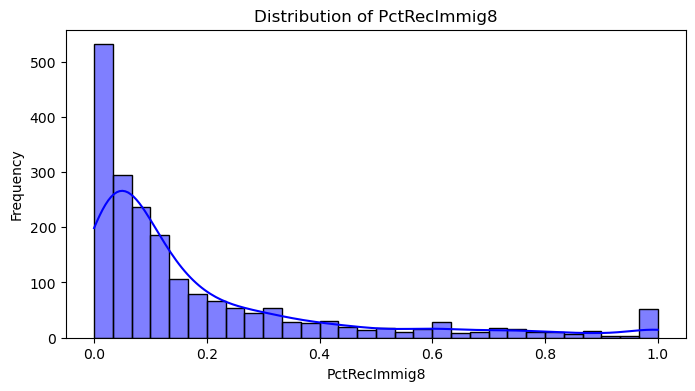


Feature: PctRecImmig10
count    1994.000000
mean        0.182879
std         0.234822
min         0.000000
25%         0.030000
50%         0.090000
75%         0.230000
max         1.000000
Name: PctRecImmig10, dtype: float64


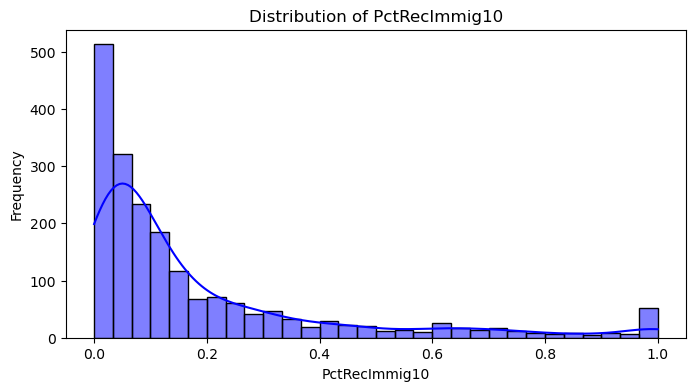


Feature: PctSpeakEnglOnly
count    1994.000000
mean        0.785903
std         0.226869
min         0.000000
25%         0.730000
50%         0.870000
75%         0.940000
max         1.000000
Name: PctSpeakEnglOnly, dtype: float64


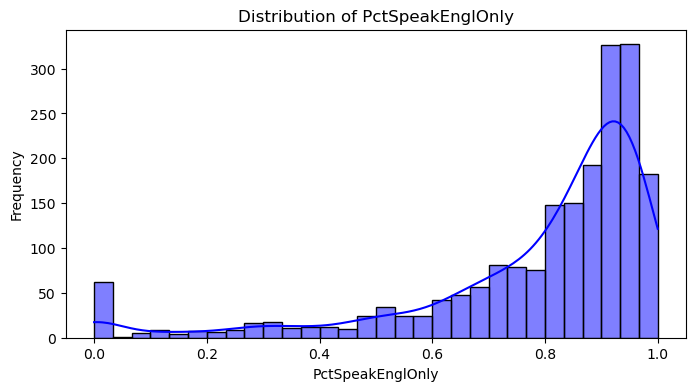


Feature: PctNotSpeakEnglWell
count    1994.000000
mean        0.150587
std         0.219716
min         0.000000
25%         0.030000
50%         0.060000
75%         0.160000
max         1.000000
Name: PctNotSpeakEnglWell, dtype: float64


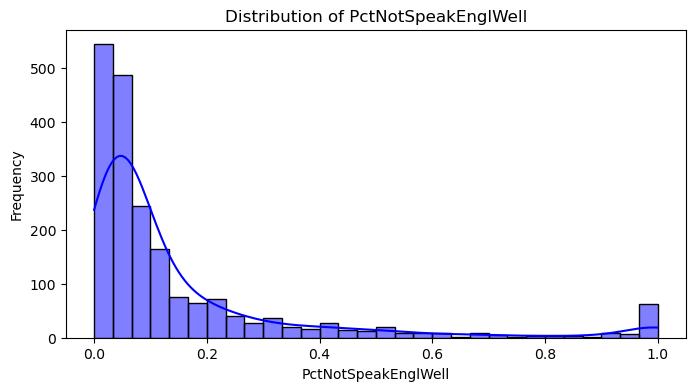


Feature: PctLargHouseFam
count    1994.000000
mean        0.267608
std         0.196567
min         0.000000
25%         0.150000
50%         0.200000
75%         0.310000
max         1.000000
Name: PctLargHouseFam, dtype: float64


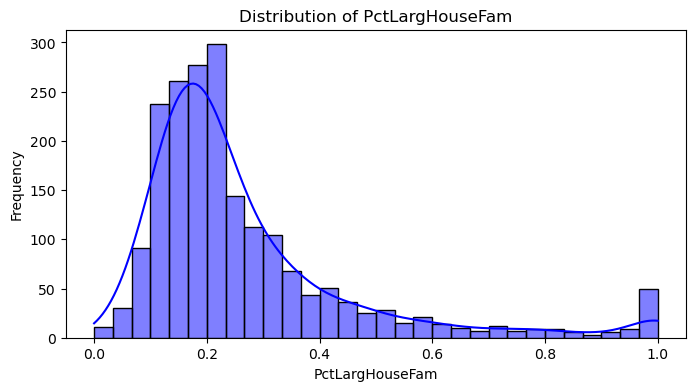


Feature: PctLargHouseOccup
count    1994.000000
mean        0.251891
std         0.190709
min         0.000000
25%         0.140000
50%         0.190000
75%         0.290000
max         1.000000
Name: PctLargHouseOccup, dtype: float64


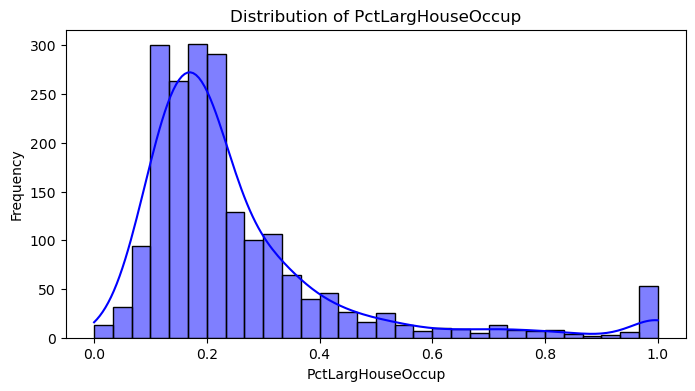


Feature: PersPerOccupHous
count    1994.000000
mean        0.462101
std         0.169551
min         0.000000
25%         0.340000
50%         0.440000
75%         0.550000
max         1.000000
Name: PersPerOccupHous, dtype: float64


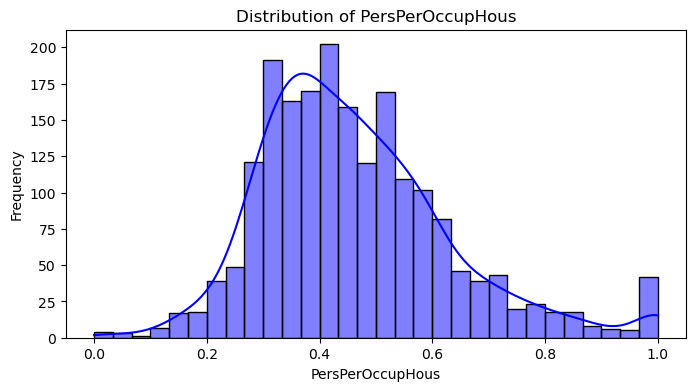


Feature: PersPerOwnOccHous
count    1994.000000
mean        0.494428
std         0.157924
min         0.000000
25%         0.390000
50%         0.480000
75%         0.580000
max         1.000000
Name: PersPerOwnOccHous, dtype: float64


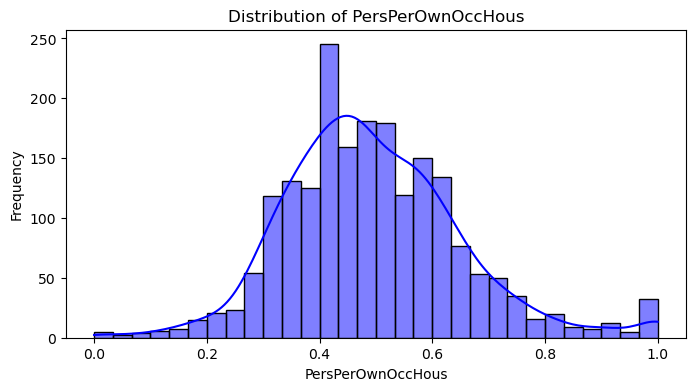


Feature: PersPerRentOccHous
count    1994.000000
mean        0.404097
std         0.189301
min         0.000000
25%         0.270000
50%         0.360000
75%         0.490000
max         1.000000
Name: PersPerRentOccHous, dtype: float64


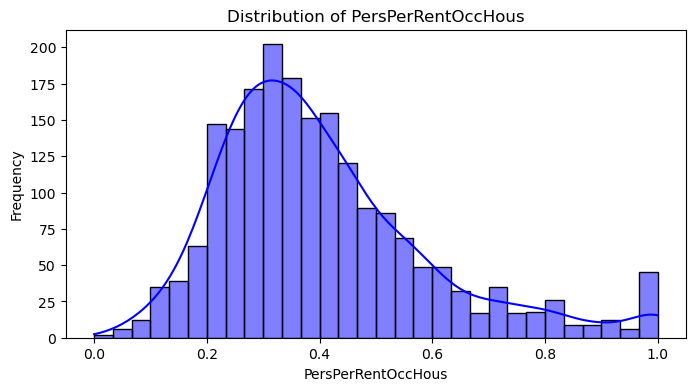


Feature: PctPersOwnOccup
count    1994.000000
mean        0.562598
std         0.197087
min         0.000000
25%         0.440000
50%         0.560000
75%         0.700000
max         1.000000
Name: PctPersOwnOccup, dtype: float64


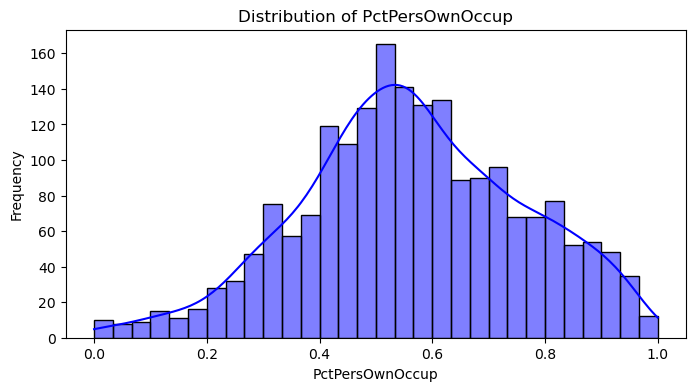


Feature: PctPersDenseHous
count    1994.000000
mean        0.186264
std         0.209956
min         0.000000
25%         0.060000
50%         0.110000
75%         0.220000
max         1.000000
Name: PctPersDenseHous, dtype: float64


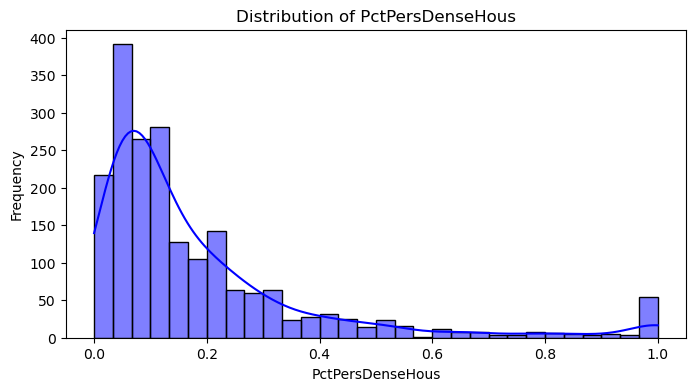


Feature: PctHousLess3BR
count    1994.000000
mean        0.495186
std         0.172508
min         0.000000
25%         0.400000
50%         0.510000
75%         0.600000
max         1.000000
Name: PctHousLess3BR, dtype: float64


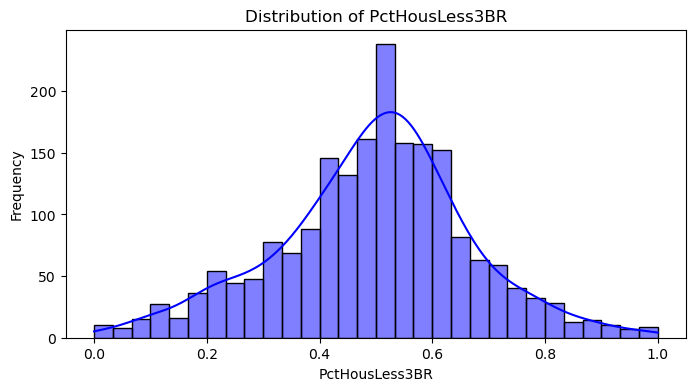


Feature: MedNumBR
count    1994.000000
mean        0.314694
std         0.255182
min         0.000000
25%         0.000000
50%         0.500000
75%         0.500000
max         1.000000
Name: MedNumBR, dtype: float64


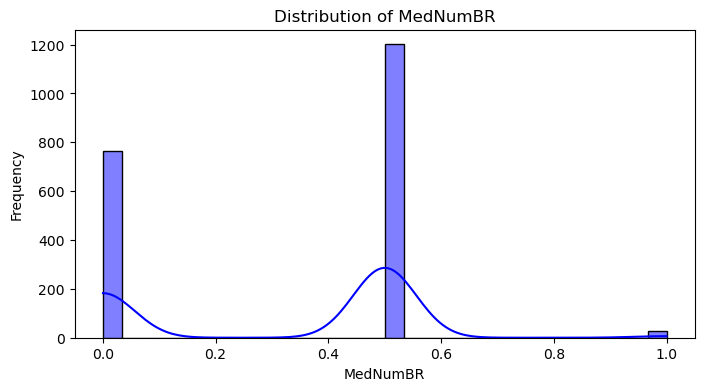


Feature: HousVacant
count    1994.000000
mean        0.076815
std         0.150465
min         0.000000
25%         0.010000
50%         0.030000
75%         0.070000
max         1.000000
Name: HousVacant, dtype: float64


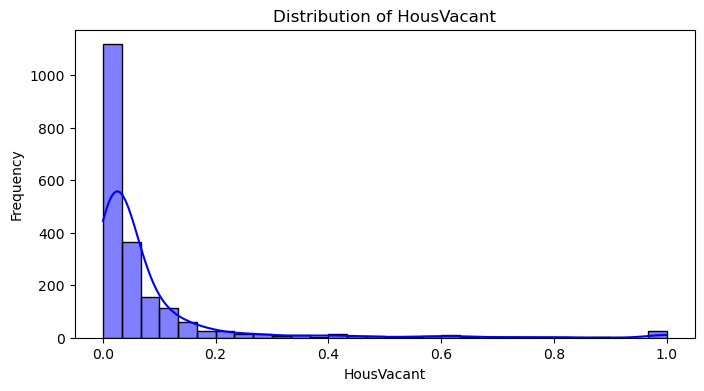


Feature: PctHousOccup
count    1994.000000
mean        0.719549
std         0.194024
min         0.000000
25%         0.630000
50%         0.770000
75%         0.860000
max         1.000000
Name: PctHousOccup, dtype: float64


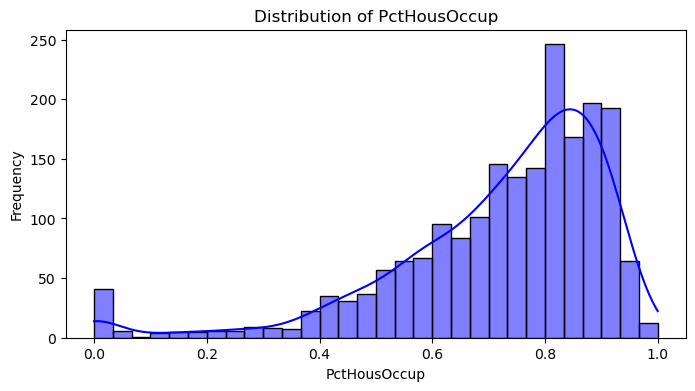


Feature: PctHousOwnOcc
count    1994.000000
mean        0.548686
std         0.185204
min         0.000000
25%         0.430000
50%         0.540000
75%         0.670000
max         1.000000
Name: PctHousOwnOcc, dtype: float64


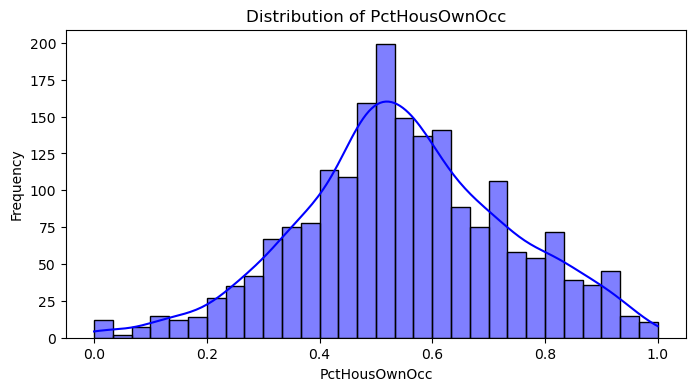


Feature: PctVacantBoarded
count    1994.000000
mean        0.204529
std         0.217770
min         0.000000
25%         0.060000
50%         0.130000
75%         0.270000
max         1.000000
Name: PctVacantBoarded, dtype: float64


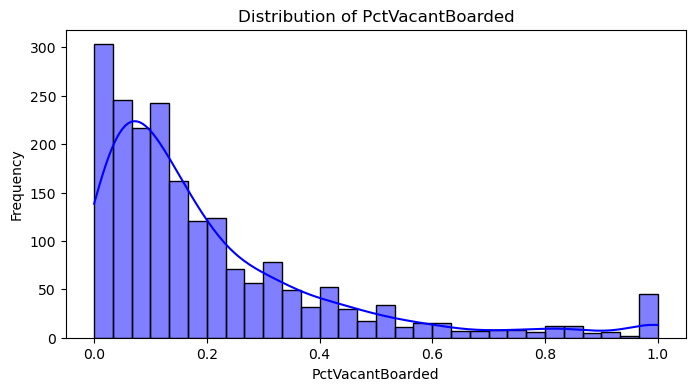


Feature: PctVacMore6Mos
count    1994.000000
mean        0.433335
std         0.188986
min         0.000000
25%         0.290000
50%         0.420000
75%         0.560000
max         1.000000
Name: PctVacMore6Mos, dtype: float64


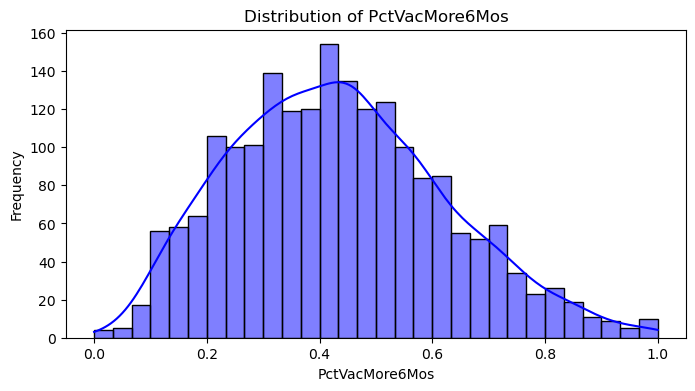


Feature: MedYrHousBuilt
count    1994.000000
mean        0.494178
std         0.232467
min         0.000000
25%         0.350000
50%         0.520000
75%         0.670000
max         1.000000
Name: MedYrHousBuilt, dtype: float64


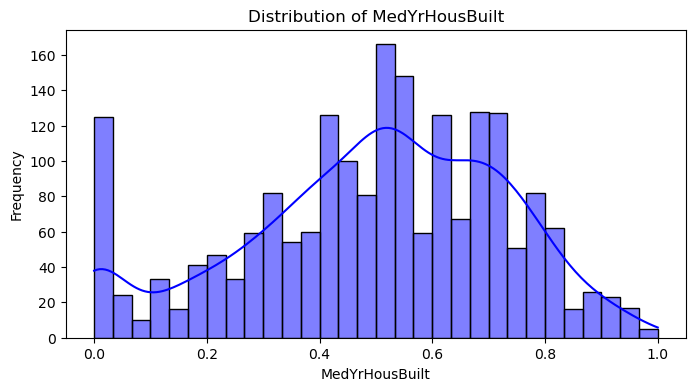


Feature: PctHousNoPhone
count    1994.000000
mean        0.264478
std         0.242847
min         0.000000
25%         0.060000
50%         0.185000
75%         0.420000
max         1.000000
Name: PctHousNoPhone, dtype: float64


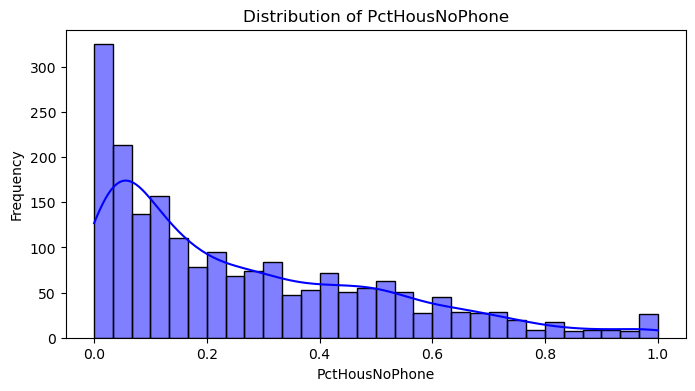


Feature: PctWOFullPlumb
count    1994.000000
mean        0.243059
std         0.206295
min         0.000000
25%         0.100000
50%         0.190000
75%         0.330000
max         1.000000
Name: PctWOFullPlumb, dtype: float64


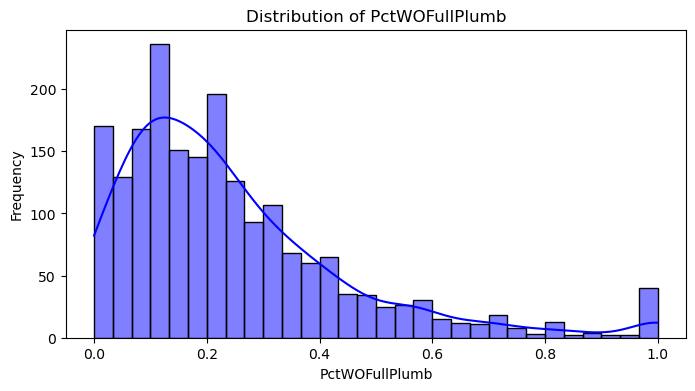


Feature: OwnOccLowQuart
count    1994.000000
mean        0.264689
std         0.224425
min         0.000000
25%         0.090000
50%         0.180000
75%         0.400000
max         1.000000
Name: OwnOccLowQuart, dtype: float64


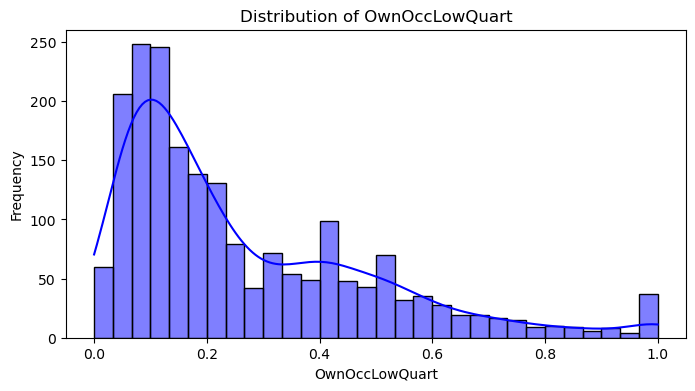


Feature: OwnOccMedVal
count    1994.000000
mean        0.263490
std         0.231542
min         0.000000
25%         0.090000
50%         0.170000
75%         0.390000
max         1.000000
Name: OwnOccMedVal, dtype: float64


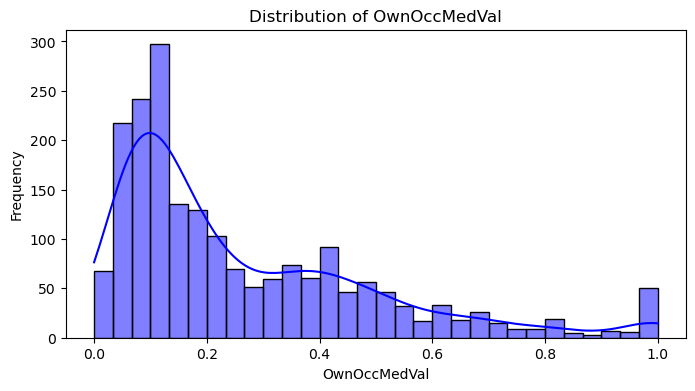


Feature: OwnOccHiQuart
count    1994.000000
mean        0.268942
std         0.235252
min         0.000000
25%         0.090000
50%         0.180000
75%         0.380000
max         1.000000
Name: OwnOccHiQuart, dtype: float64


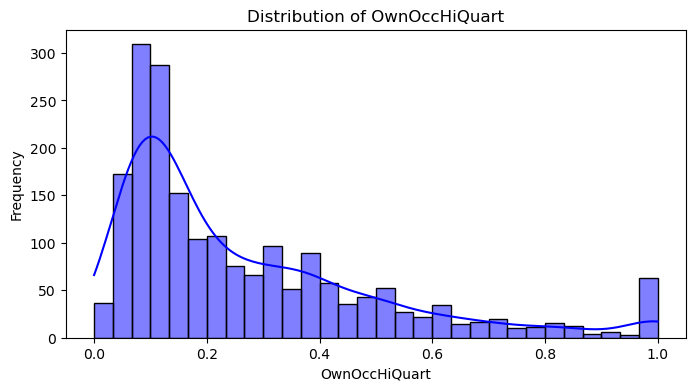


Feature: RentLowQ
count    1994.000000
mean        0.346379
std         0.219323
min         0.000000
25%         0.170000
50%         0.310000
75%         0.490000
max         1.000000
Name: RentLowQ, dtype: float64


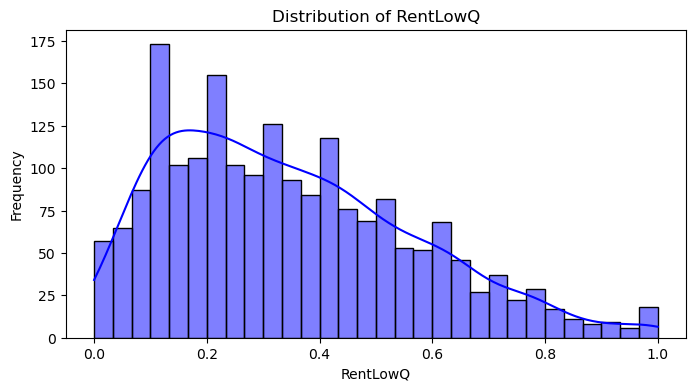


Feature: RentMedian
count    1994.000000
mean        0.372457
std         0.209278
min         0.000000
25%         0.200000
50%         0.330000
75%         0.520000
max         1.000000
Name: RentMedian, dtype: float64


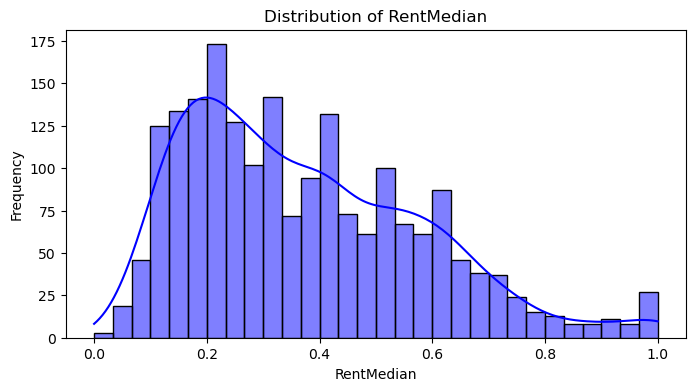


Feature: RentHighQ
count    1994.000000
mean        0.422964
std         0.248286
min         0.000000
25%         0.220000
50%         0.370000
75%         0.590000
max         1.000000
Name: RentHighQ, dtype: float64


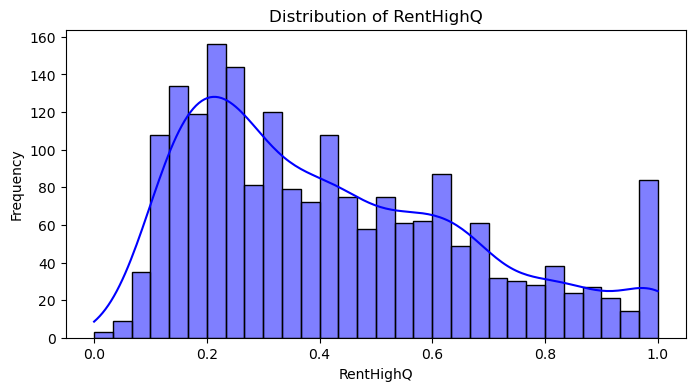


Feature: MedRent
count    1994.000000
mean        0.384102
std         0.213404
min         0.000000
25%         0.210000
50%         0.340000
75%         0.530000
max         1.000000
Name: MedRent, dtype: float64


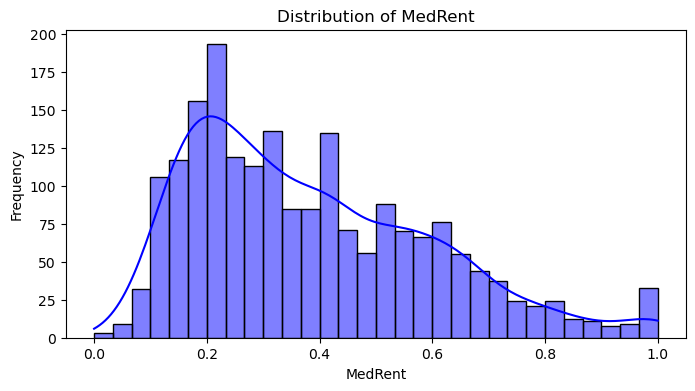


Feature: MedRentPctHousInc
count    1994.000000
mean        0.490125
std         0.169500
min         0.000000
25%         0.370000
50%         0.480000
75%         0.590000
max         1.000000
Name: MedRentPctHousInc, dtype: float64


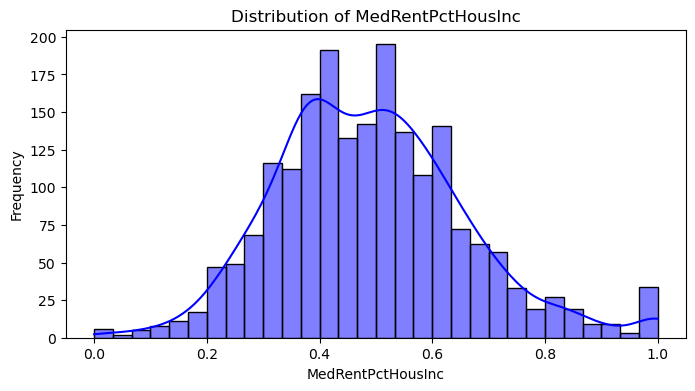


Feature: MedOwnCostPctInc
count    1994.000000
mean        0.449754
std         0.187274
min         0.000000
25%         0.320000
50%         0.450000
75%         0.580000
max         1.000000
Name: MedOwnCostPctInc, dtype: float64


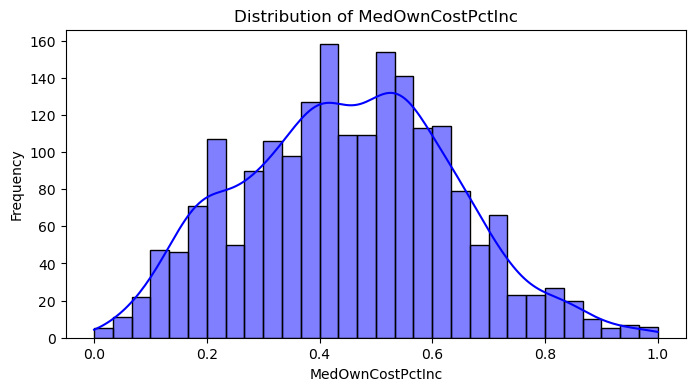


Feature: MedOwnCostPctIncNoMtg
count    1994.000000
mean        0.403816
std         0.192593
min         0.000000
25%         0.250000
50%         0.370000
75%         0.510000
max         1.000000
Name: MedOwnCostPctIncNoMtg, dtype: float64


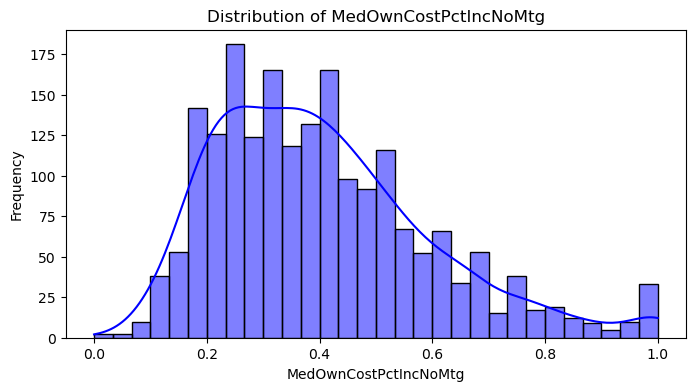


Feature: NumInShelters
count    1994.000000
mean        0.029438
std         0.102607
min         0.000000
25%         0.000000
50%         0.000000
75%         0.010000
max         1.000000
Name: NumInShelters, dtype: float64


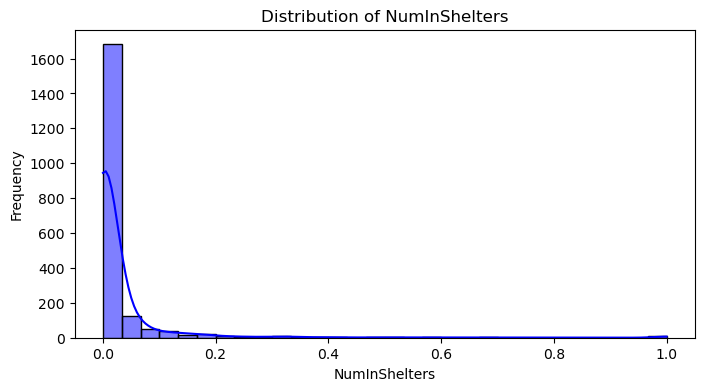


Feature: NumStreet
count    1994.000000
mean        0.022778
std         0.100400
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: NumStreet, dtype: float64


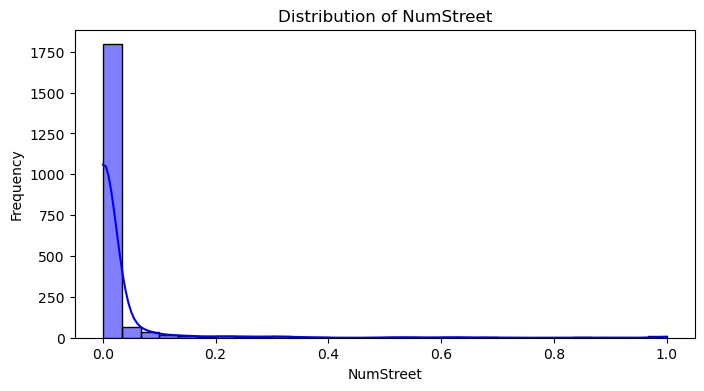


Feature: PctForeignBorn
count    1994.000000
mean        0.215552
std         0.231134
min         0.000000
25%         0.060000
50%         0.130000
75%         0.280000
max         1.000000
Name: PctForeignBorn, dtype: float64


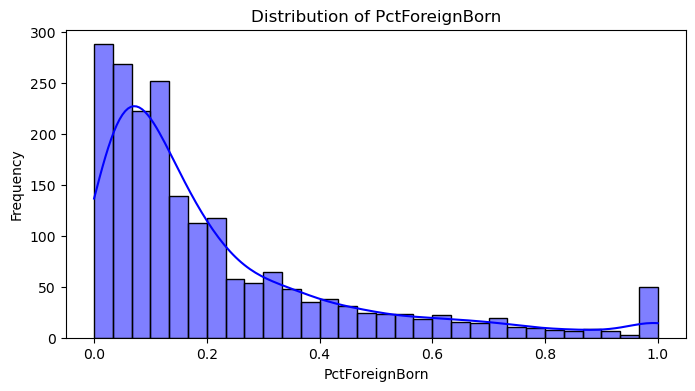


Feature: PctBornSameState
count    1994.000000
mean        0.608892
std         0.204329
min         0.000000
25%         0.470000
50%         0.630000
75%         0.777500
max         1.000000
Name: PctBornSameState, dtype: float64


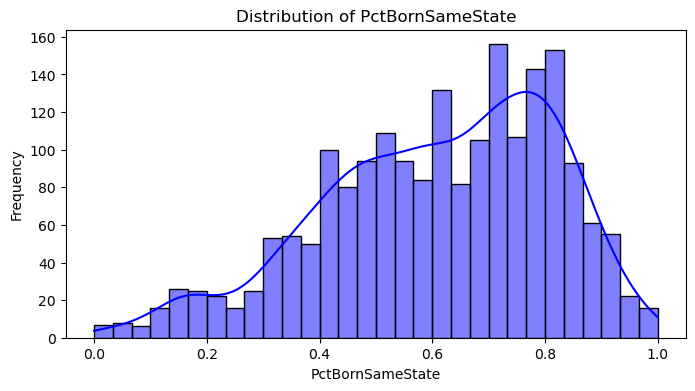


Feature: PctSameHouse85
count    1994.000000
mean        0.535050
std         0.181352
min         0.000000
25%         0.420000
50%         0.540000
75%         0.660000
max         1.000000
Name: PctSameHouse85, dtype: float64


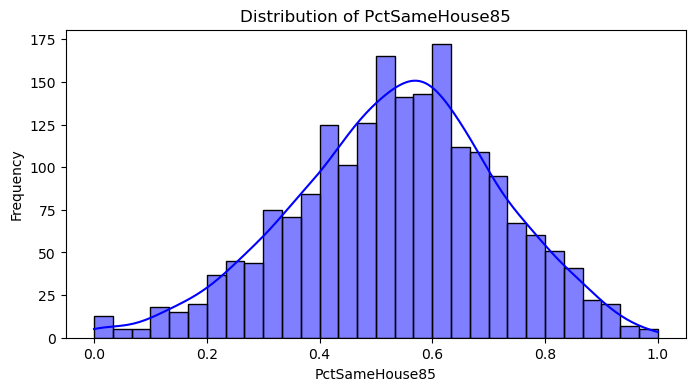


Feature: PctSameCity85
count    1994.000000
mean        0.626424
std         0.200521
min         0.000000
25%         0.520000
50%         0.670000
75%         0.770000
max         1.000000
Name: PctSameCity85, dtype: float64


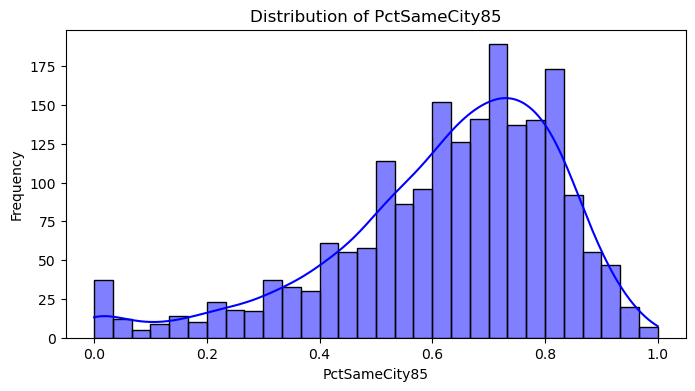


Feature: PctSameState85
count    1994.000000
mean        0.651530
std         0.198221
min         0.000000
25%         0.560000
50%         0.700000
75%         0.790000
max         1.000000
Name: PctSameState85, dtype: float64


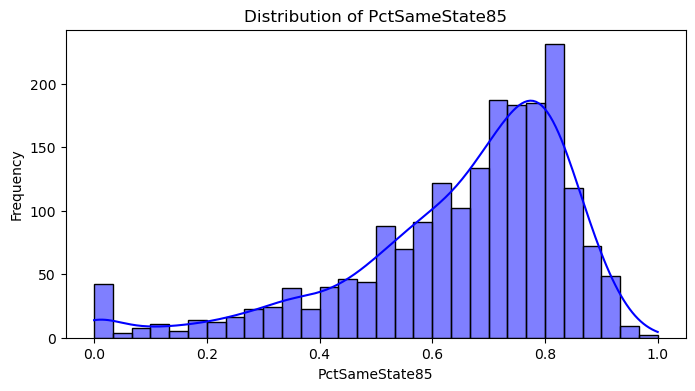


Feature: LandArea
count    1994.000000
mean        0.065231
std         0.109459
min         0.000000
25%         0.020000
50%         0.040000
75%         0.070000
max         1.000000
Name: LandArea, dtype: float64


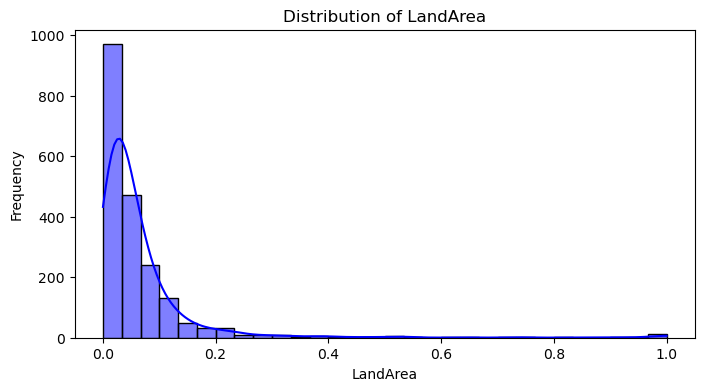


Feature: PopDens
count    1994.000000
mean        0.232854
std         0.203092
min         0.000000
25%         0.100000
50%         0.170000
75%         0.280000
max         1.000000
Name: PopDens, dtype: float64


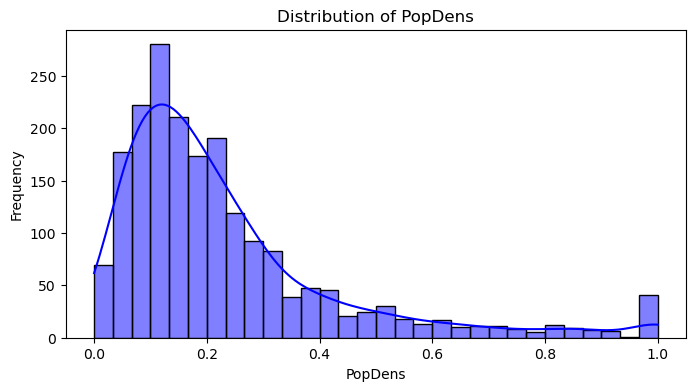


Feature: PctUsePubTrans
count    1994.000000
mean        0.161685
std         0.229055
min         0.000000
25%         0.020000
50%         0.070000
75%         0.190000
max         1.000000
Name: PctUsePubTrans, dtype: float64


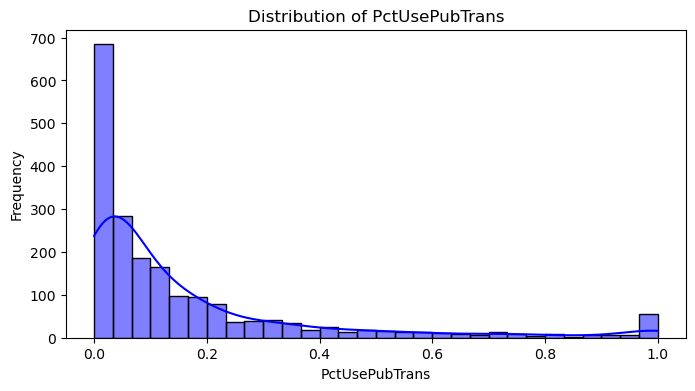


Feature: LemasPctOfficDrugUn
count    1994.000000
mean        0.094052
std         0.240328
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: LemasPctOfficDrugUn, dtype: float64


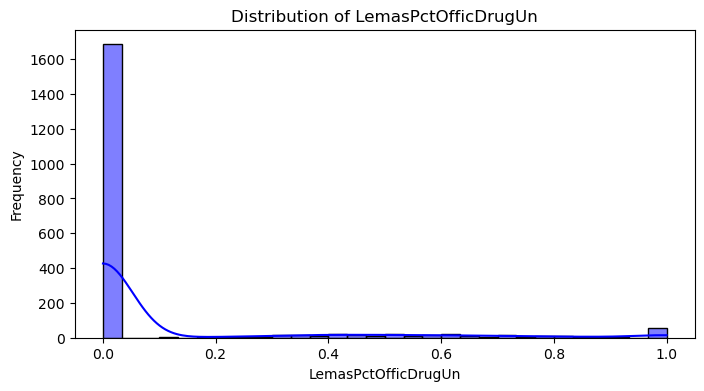


Feature: ViolentCrimesPerPop
count    1994.000000
mean        0.237979
std         0.232985
min         0.000000
25%         0.070000
50%         0.150000
75%         0.330000
max         1.000000
Name: ViolentCrimesPerPop, dtype: float64


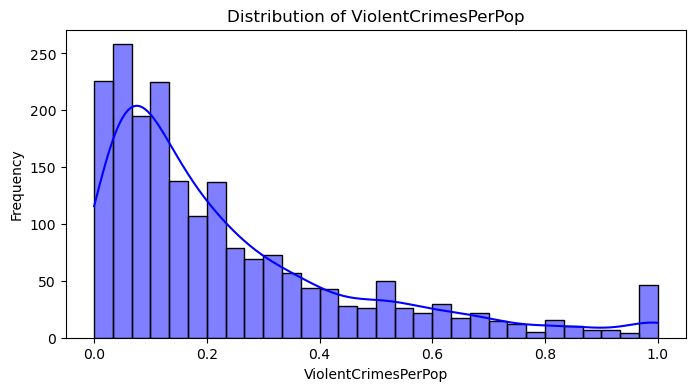

In [5]:
# Display distributions of each feature
print("Distributions for each feature:")
for feature in data.columns:
    print(f"\nFeature: {feature}")
    print(data[feature].describe())
    
    # Plot distribution for each feature
    plt.figure(figsize=(8, 4))
    if data[feature].dtype in ['int64', 'float64']:  # For numerical features
        sns.histplot(data[feature], kde=True, bins=30, color='blue')
        plt.title(f"Distribution of {feature}")
        plt.xlabel(feature)
        plt.ylabel("Frequency")
    else:  # For categorical features
        sns.countplot(y=data[feature], order=data[feature].value_counts().index, palette="viridis")
        plt.title(f"Distribution of {feature}")
        plt.ylabel(feature)
        plt.xlabel("Count")
    plt.show()

# Outlier Removal, Normalization, and Feature Cleaning

This code performs essential preprocessing steps to clean and standardize the dataset for further analysis or modeling. The steps include:

1. **Removing Outliers**:
   - Outliers are identified and removed for each numeric feature (excluding 'ACTION') using the Interquartile Range (IQR) method.
   - This ensures that extreme values do not skew the analysis or model training.

2. **Normalizing Data**:
   - The numeric features are scaled using Min-Max Scaling to bring all feature values into a range of [0, 1].
   - This is crucial for models sensitive to feature scaling.

3. **Removing Constant Features**:
   - Features with no variability (constant values) are identified and removed as they do not contribute any useful information to the model.

4. **Saving the Processed Dataset**:
   - The cleaned and normalized dataset is saved to a CSV file (`data_final_no_outlier.csv`) for future use.

This ensures a clean, standardized dataset ready for effective analysis or machine learning workflows.

In [6]:
# Function to remove outliers using IQR
def remove_outliers_iqr(df, feature):
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Filter the data to exclude outliers
    return df[(df[feature] >= lower_bound) & (df[feature] <= upper_bound)]

# Identify numeric features, excluding 'ACTION'
numeric_features = [feature for feature in data.select_dtypes(include=['int64', 'float64']).columns if feature != 'ACTION']

# Remove outliers for each numeric feature, except for 'ACTION'
data_no_outlier = data.copy()
for feature in numeric_features:
    data_no_outlier = remove_outliers_iqr(data_no_outlier, feature)
    print(f"Outliers removed for {feature}")

# Normalize the data using Min-Max Scaling
scaler = MinMaxScaler()
data_no_outlier[numeric_features] = scaler.fit_transform(data_no_outlier[numeric_features])

# Identify and remove constant features (features with no deviation)
constant_features = [col for col in data_no_outlier.columns if data_no_outlier[col].nunique() == 1]
if constant_features:
    print(f"Constant features identified and removed: {constant_features}")
    data_no_outlier.drop(columns=constant_features, inplace=True)

# Save the processed dataset to CSV
data_no_outlier.to_csv("./final_data/communities+and+crime/data_final_no_outlier.csv", index=False)
print("Data with outliers removed, normalized, and constant features removed has been saved to 'data_final_no_outlier.csv'")

Outliers removed for state
Outliers removed for county
Outliers removed for community
Outliers removed for fold
Outliers removed for population
Outliers removed for householdsize
Outliers removed for racepctblack
Outliers removed for racePctWhite
Outliers removed for racePctAsian
Outliers removed for racePctHisp
Outliers removed for agePct12t21
Outliers removed for agePct12t29
Outliers removed for agePct16t24
Outliers removed for agePct65up
Outliers removed for numbUrban
Outliers removed for pctUrban
Outliers removed for medIncome
Outliers removed for pctWWage
Outliers removed for pctWFarmSelf
Outliers removed for pctWInvInc
Outliers removed for pctWSocSec
Outliers removed for pctWPubAsst
Outliers removed for pctWRetire
Outliers removed for medFamInc
Outliers removed for perCapInc
Outliers removed for whitePerCap
Outliers removed for blackPerCap
Outliers removed for indianPerCap
Outliers removed for AsianPerCap
Outliers removed for OtherPerCap
Outliers removed for HispPerCap
Outliers r

# Normalizing Numeric Features

We are preparing the dataset by normalizing its numeric features for further analysis or modeling. Below are the steps performed:

1. **Identifying Numeric Features**:
   - Extracting all numeric features (`int64` and `float64` types) from the dataset, excluding the target column `'ACTION'`.

2. **Normalizing Data**:
   - Applying Min-Max Scaling to scale all numeric features to a range of [0, 1], ensuring uniformity and compatibility for machine learning models.

3. **Saving Processed Data**:
   - Saving the normalized dataset (with outliers retained) to a CSV file named `data_final_with_outlier.csv`.

This ensures the dataset is standardized while retaining all original data points, including outliers.

In [7]:
# Identify numeric features, excluding 'ACTION'
numeric_features = [feature for feature in data.select_dtypes(include=['int64', 'float64']).columns if feature != 'ACTION']

# Normalize the data using Min-Max Scaling
data_with_outlier = data.copy()
scaler = MinMaxScaler()
data_with_outlier[numeric_features] = scaler.fit_transform(data_with_outlier[numeric_features])

# Save the processed dataset to CSV
data_with_outlier.to_csv("./final_data/communities+and+crime/data_final_with_outlier.csv", index=False)
print("Data with outliers retained and normalized has been saved to 'data_final_with_outlier.csv'")

Data with outliers retained and normalized has been saved to 'data_final_with_outlier.csv'


# Visualizing Normalized Features

We are comparing the distributions of numeric features (including the target column `'ACTION'`) in two datasets: one with outliers removed and the other with outliers retained. The steps include:

1. **Loading Datasets**:
   - The datasets are loaded from their respective CSV files: 
     - `data_final_no_outlier.csv` (outliers removed).
     - `data_final_with_outlier.csv` (outliers retained).

2. **Descriptive Statistics**:
   - Displaying summary statistics for each normalized feature to understand their range and distribution.

3. **Visualizing Distributions**:
   - Creating histograms with KDE (Kernel Density Estimation) plots for each feature to compare their distributions across the two datasets.

This process helps evaluate the impact of outlier removal and normalization on the features, providing insights into their suitability for further analysis or modeling.


==== Data Without Outliers ====
Numeric Features: ['state', 'county', 'community', 'fold', 'population', 'householdsize', 'racepctblack', 'racePctWhite', 'racePctAsian', 'racePctHisp', 'agePct12t21', 'agePct12t29', 'agePct16t24', 'agePct65up', 'numbUrban', 'pctUrban', 'medIncome', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'medFamInc', 'perCapInc', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'NumUnderPov', 'PctPopUnderPov', 'PctLess9thGrade', 'PctNotHSGrad', 'PctBSorMore', 'PctUnemployed', 'PctEmploy', 'PctEmplManu', 'PctEmplProfServ', 'PctOccupManu', 'PctOccupMgmtProf', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'TotalPctDiv', 'PersPerFam', 'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMomYoungKids', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRecent', 'PctImmigRec5', 'PctImmigRec8', 'PctImmigRec10', 'PctRecentImmig', 'PctRecImmig5', 'PctRecImmig8'

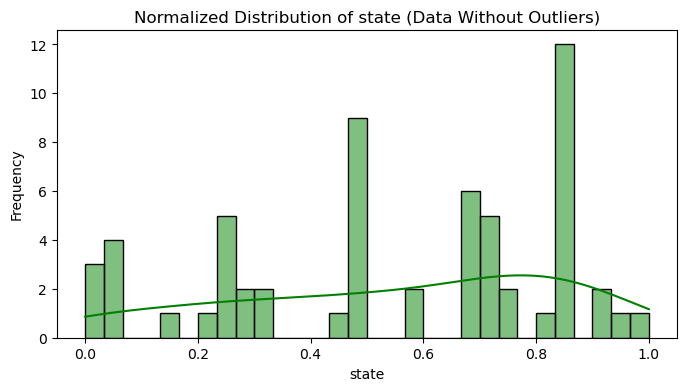


Feature: county
count    60.000000
mean      0.036111
std       0.153710
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: county, dtype: float64


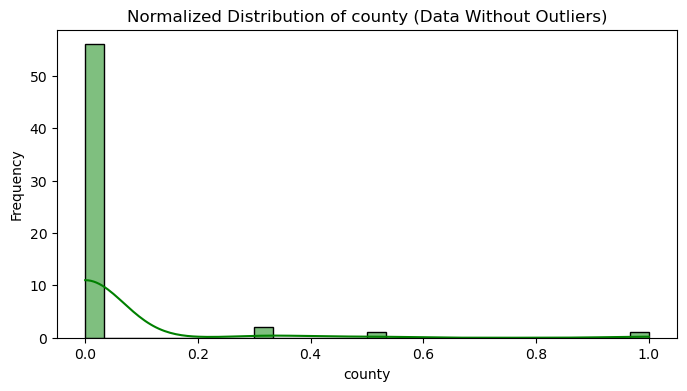


Feature: community
count    60.000000
mean      0.034702
std       0.151614
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: community, dtype: float64


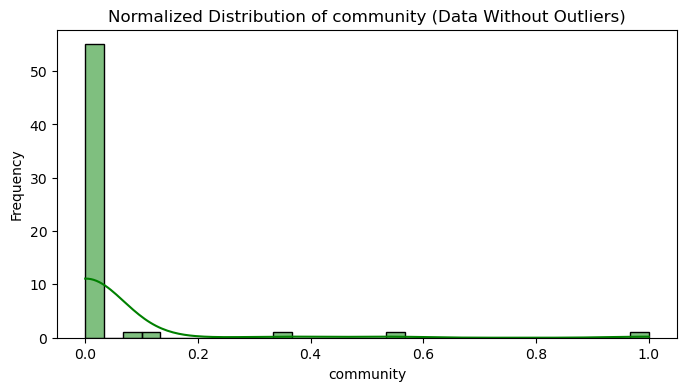


Feature: fold
count    60.000000
mean      0.527778
std       0.330259
min       0.000000
25%       0.222222
50%       0.500000
75%       0.888889
max       1.000000
Name: fold, dtype: float64


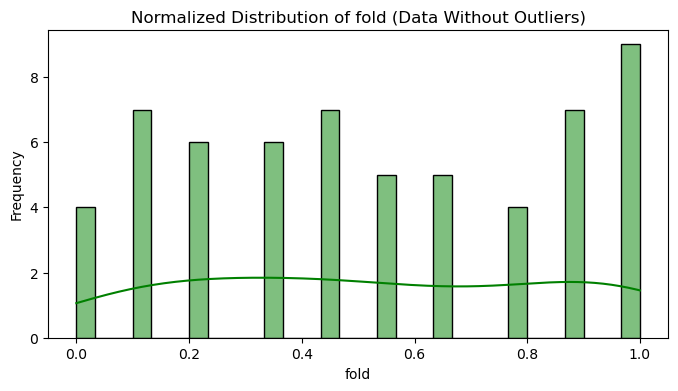


Feature: population
count    60.000000
mean      0.261905
std       0.252510
min       0.000000
25%       0.142857
50%       0.142857
75%       0.428571
max       1.000000
Name: population, dtype: float64


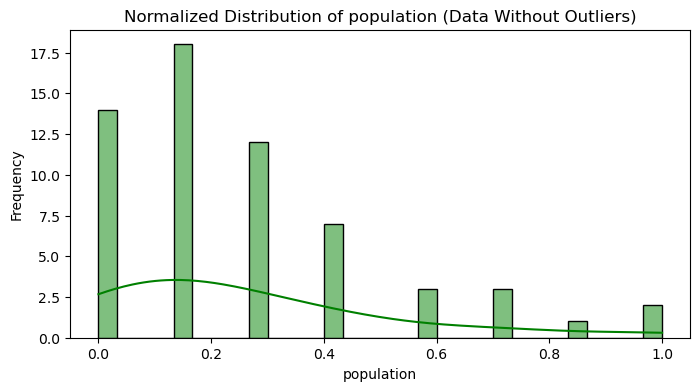


Feature: householdsize
count    60.000000
mean      0.532906
std       0.221283
min       0.000000
25%       0.358974
50%       0.551282
75%       0.679487
max       1.000000
Name: householdsize, dtype: float64


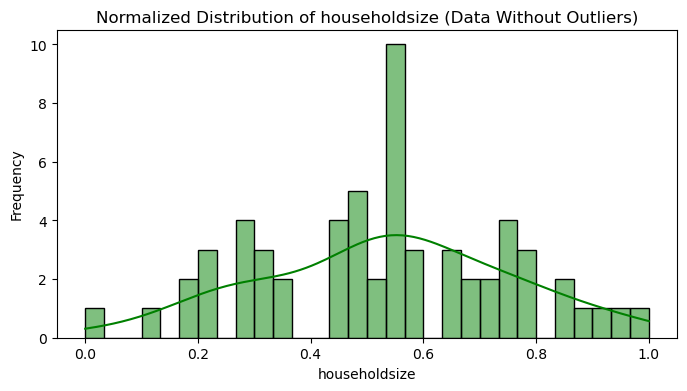


Feature: racepctblack
count    60.000000
mean      0.198990
std       0.252449
min       0.000000
25%       0.030303
50%       0.090909
75%       0.242424
max       1.000000
Name: racepctblack, dtype: float64


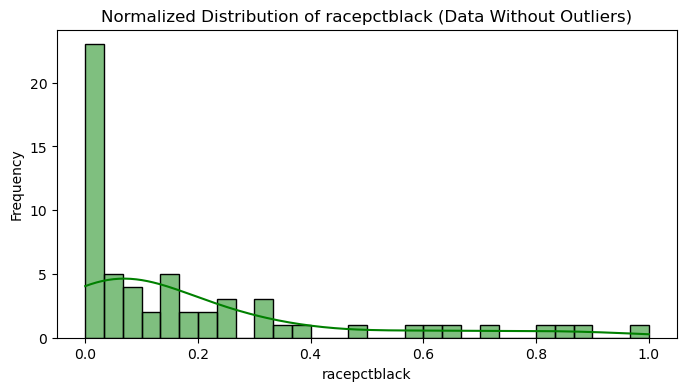


Feature: racePctWhite
count    60.000000
mean      0.736905
std       0.246908
min       0.000000
25%       0.642857
50%       0.785714
75%       0.928571
max       1.000000
Name: racePctWhite, dtype: float64


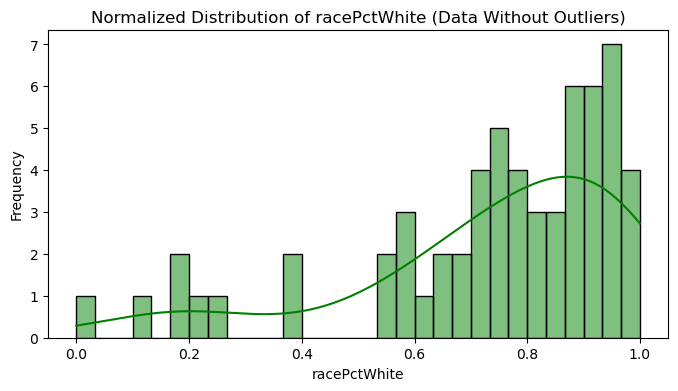


Feature: racePctAsian
count    60.000000
mean      0.271053
std       0.227014
min       0.000000
25%       0.105263
50%       0.210526
75%       0.421053
max       1.000000
Name: racePctAsian, dtype: float64


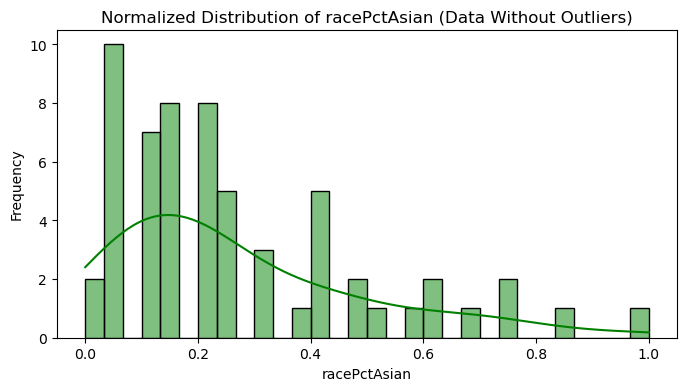


Feature: racePctHisp
count    60.000000
mean      0.190123
std       0.207222
min       0.000000
25%       0.037037
50%       0.111111
75%       0.296296
max       1.000000
Name: racePctHisp, dtype: float64


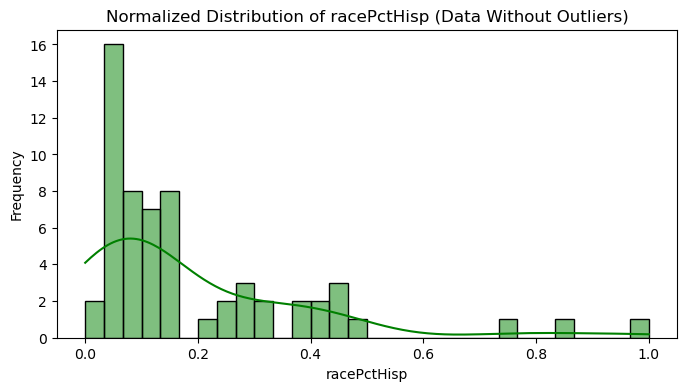


Feature: agePct12t21
count    60.000000
mean      0.598611
std       0.191184
min       0.000000
25%       0.493056
50%       0.611111
75%       0.729167
max       1.000000
Name: agePct12t21, dtype: float64


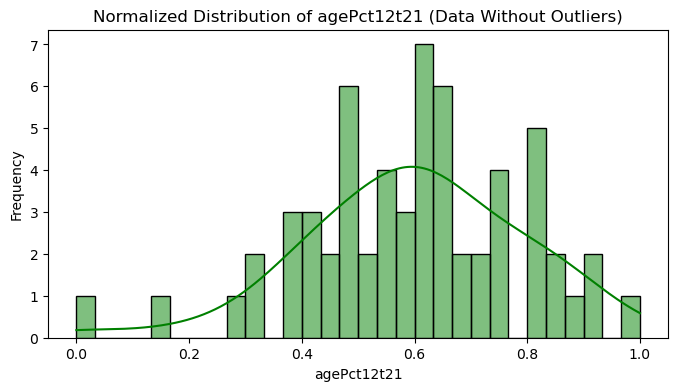


Feature: agePct12t29
count    60.000000
mean      0.579762
std       0.212194
min       0.000000
25%       0.464286
50%       0.571429
75%       0.714286
max       1.000000
Name: agePct12t29, dtype: float64


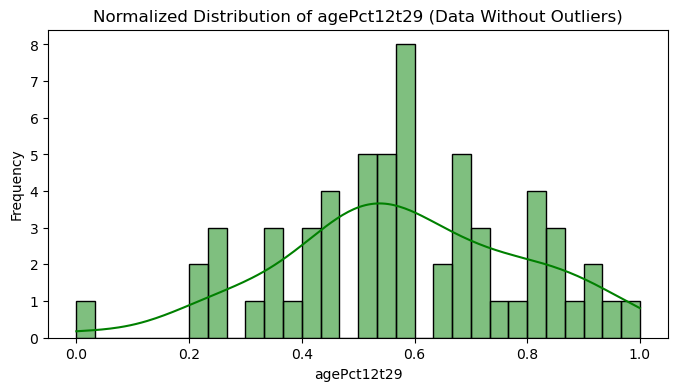


Feature: agePct16t24
count    60.000000
mean      0.468254
std       0.204895
min       0.000000
25%       0.380952
50%       0.476190
75%       0.619048
max       1.000000
Name: agePct16t24, dtype: float64


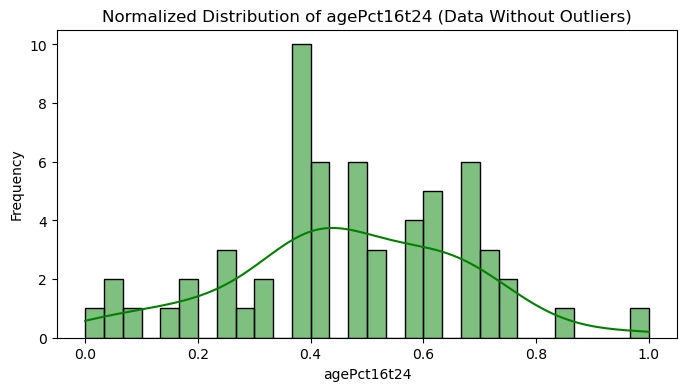


Feature: agePct65up
count    60.000000
mean      0.401130
std       0.256737
min       0.000000
25%       0.182203
50%       0.364407
75%       0.580508
max       1.000000
Name: agePct65up, dtype: float64


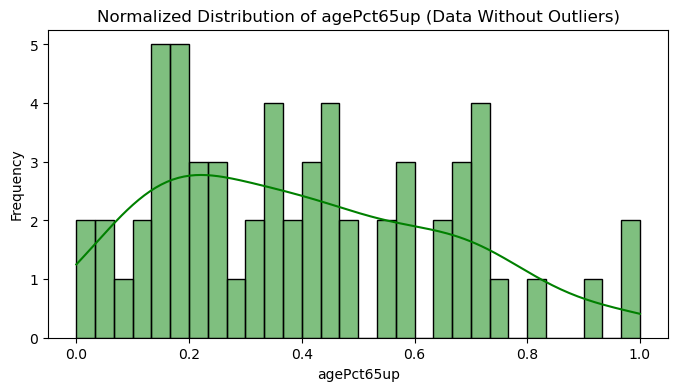


Feature: numbUrban
count    60.000000
mean      0.383333
std       0.247730
min       0.000000
25%       0.250000
50%       0.375000
75%       0.500000
max       1.000000
Name: numbUrban, dtype: float64


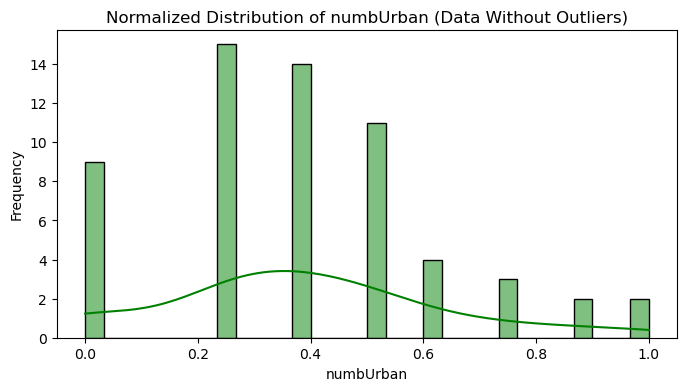


Feature: pctUrban
count    60.000000
mean      0.848167
std       0.359399
min       0.000000
25%       1.000000
50%       1.000000
75%       1.000000
max       1.000000
Name: pctUrban, dtype: float64


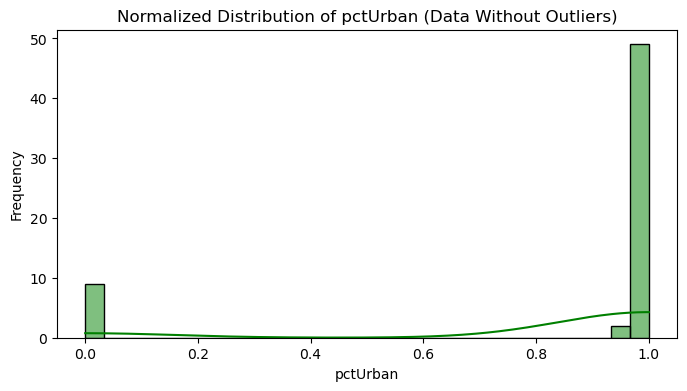


Feature: medIncome
count    60.000000
mean      0.449630
std       0.209918
min       0.000000
25%       0.333333
50%       0.422222
75%       0.583333
max       1.000000
Name: medIncome, dtype: float64


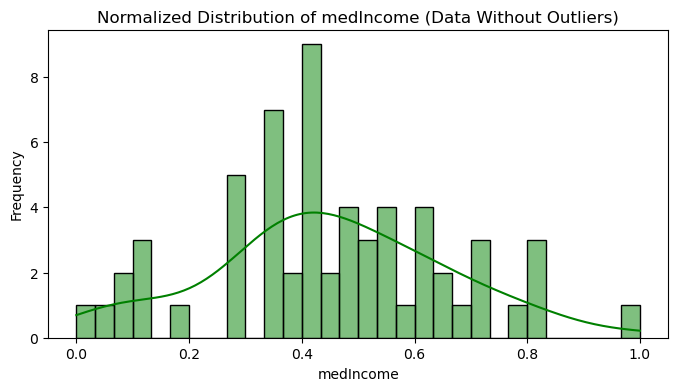


Feature: pctWWage
count    60.000000
mean      0.567560
std       0.234219
min       0.000000
25%       0.392857
50%       0.589286
75%       0.767857
max       1.000000
Name: pctWWage, dtype: float64


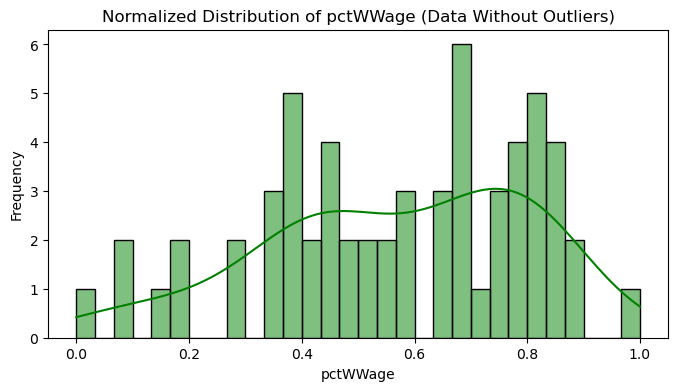


Feature: pctWFarmSelf
count    60.000000
mean      0.403646
std       0.236251
min       0.000000
25%       0.230469
50%       0.382812
75%       0.566406
max       1.000000
Name: pctWFarmSelf, dtype: float64


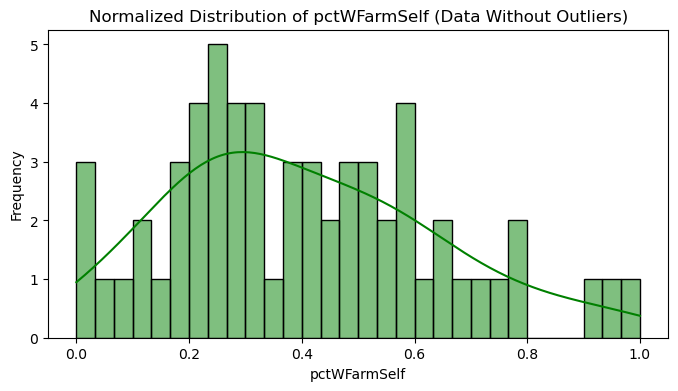


Feature: pctWInvInc
count    60.000000
mean      0.458757
std       0.187933
min       0.000000
25%       0.351695
50%       0.440678
75%       0.559322
max       1.000000
Name: pctWInvInc, dtype: float64


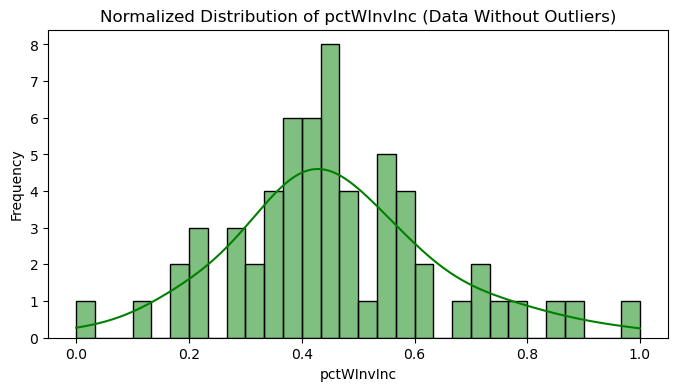


Feature: pctWSocSec
count    60.000000
mean      0.453175
std       0.241230
min       0.000000
25%       0.250000
50%       0.428571
75%       0.623016
max       1.000000
Name: pctWSocSec, dtype: float64


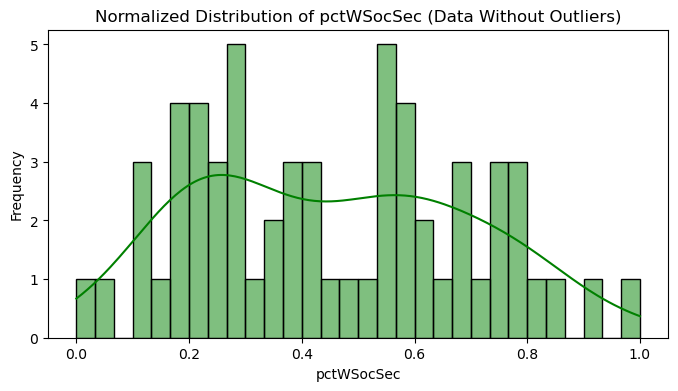


Feature: pctWPubAsst
count    60.000000
mean      0.387500
std       0.273326
min       0.000000
25%       0.178571
50%       0.339286
75%       0.535714
max       1.000000
Name: pctWPubAsst, dtype: float64


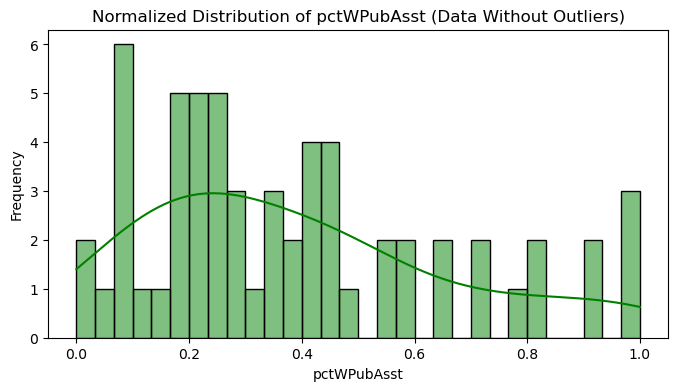


Feature: pctWRetire
count    60.000000
mean      0.449333
std       0.221146
min       0.000000
25%       0.263333
50%       0.440000
75%       0.613333
max       1.000000
Name: pctWRetire, dtype: float64


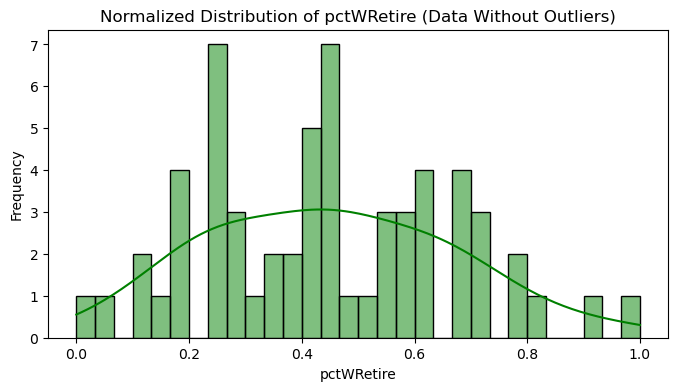


Feature: medFamInc
count    60.000000
mean      0.425877
std       0.232894
min       0.000000
25%       0.289474
50%       0.394737
75%       0.552632
max       1.000000
Name: medFamInc, dtype: float64


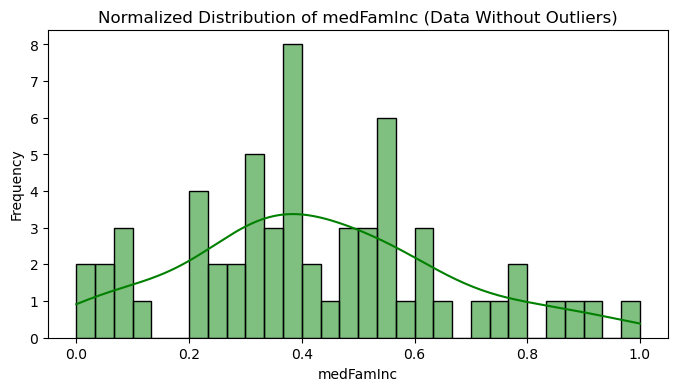


Feature: perCapInc
count    60.000000
mean      0.394086
std       0.274818
min       0.000000
25%       0.209677
50%       0.354839
75%       0.491935
max       1.000000
Name: perCapInc, dtype: float64


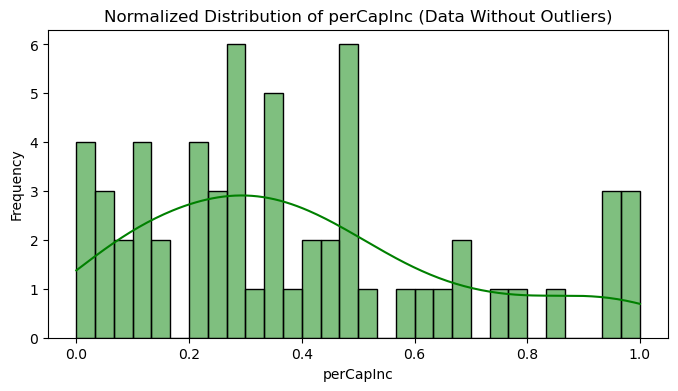


Feature: whitePerCap
count    60.000000
mean      0.373232
std       0.258548
min       0.000000
25%       0.204545
50%       0.333333
75%       0.469697
max       1.000000
Name: whitePerCap, dtype: float64


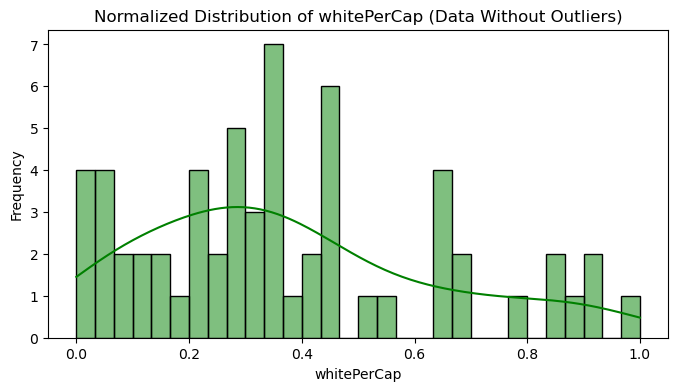


Feature: blackPerCap
count    60.000000
mean      0.490104
std       0.218560
min       0.000000
25%       0.402344
50%       0.515625
75%       0.644531
max       1.000000
Name: blackPerCap, dtype: float64


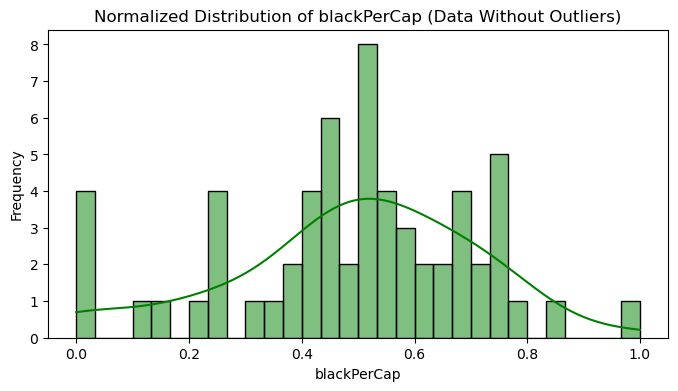


Feature: indianPerCap
count    60.000000
mean      0.416288
std       0.237979
min       0.000000
25%       0.295455
50%       0.386364
75%       0.568182
max       1.000000
Name: indianPerCap, dtype: float64


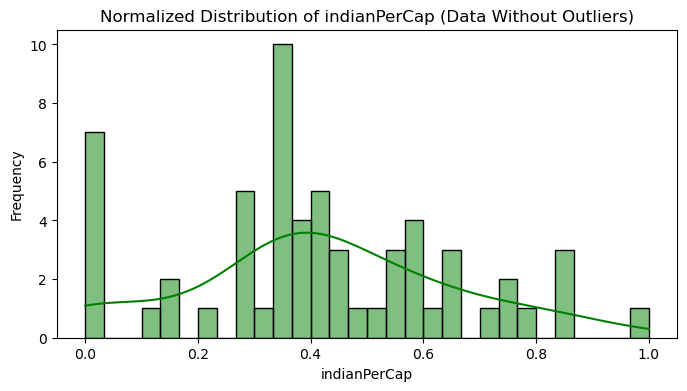


Feature: AsianPerCap
count    60.000000
mean      0.469048
std       0.227134
min       0.000000
25%       0.313492
50%       0.436508
75%       0.619048
max       1.000000
Name: AsianPerCap, dtype: float64


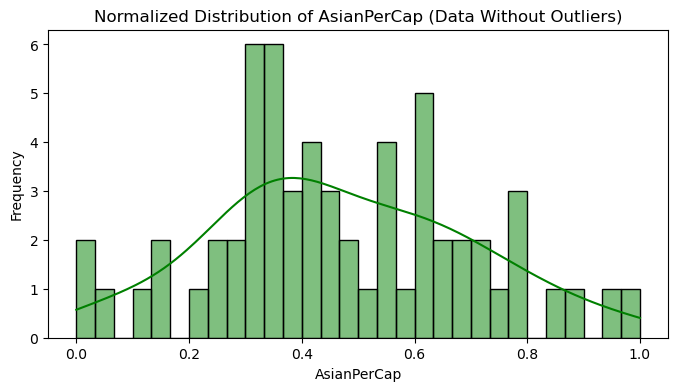


Feature: OtherPerCap
count    60.000000
mean      0.492896
std       0.220331
min       0.000000
25%       0.377049
50%       0.524590
75%       0.639344
max       1.000000
Name: OtherPerCap, dtype: float64


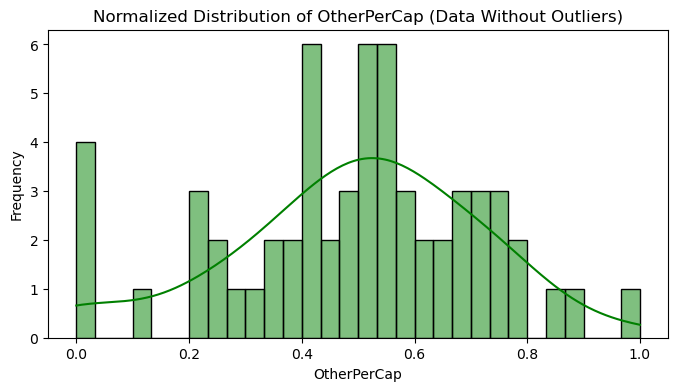


Feature: HispPerCap
count    60.000000
mean      0.543750
std       0.206330
min       0.000000
25%       0.406250
50%       0.508929
75%       0.705357
max       1.000000
Name: HispPerCap, dtype: float64


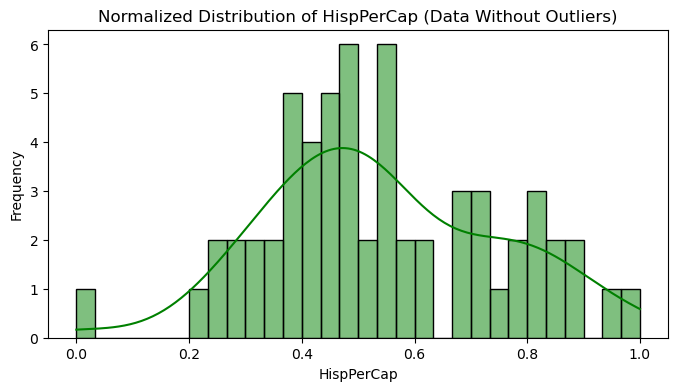


Feature: NumUnderPov
count    60.000000
mean      0.250000
std       0.178269
min       0.000000
25%       0.250000
50%       0.250000
75%       0.250000
max       1.000000
Name: NumUnderPov, dtype: float64


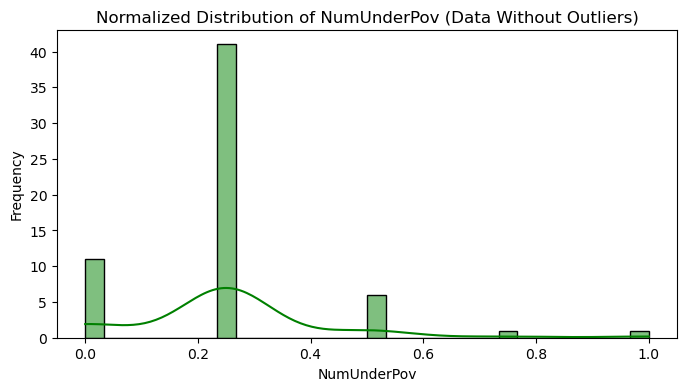


Feature: PctPopUnderPov
count    60.000000
mean      0.316092
std       0.238242
min       0.000000
25%       0.137931
50%       0.241379
75%       0.422414
max       1.000000
Name: PctPopUnderPov, dtype: float64


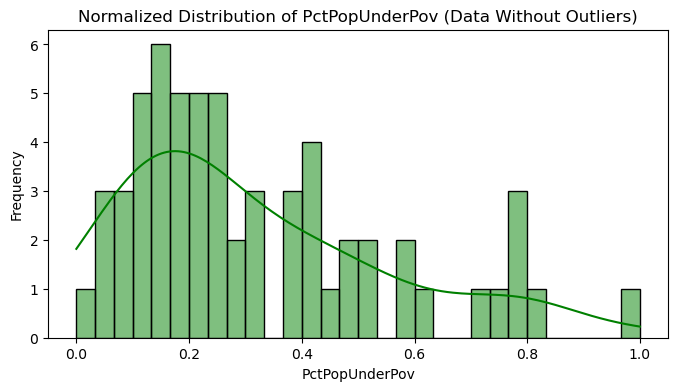


Feature: PctLess9thGrade
count    60.000000
mean      0.277436
std       0.197486
min       0.000000
25%       0.165385
50%       0.238462
75%       0.346154
max       1.000000
Name: PctLess9thGrade, dtype: float64


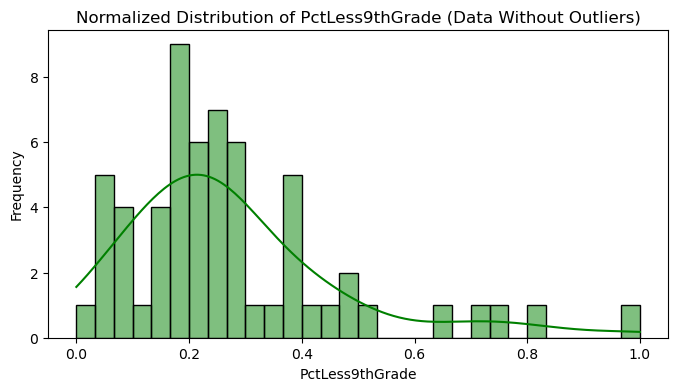


Feature: PctNotHSGrad
count    60.000000
mean      0.358810
std       0.197460
min       0.000000
25%       0.228571
50%       0.321429
75%       0.425000
max       1.000000
Name: PctNotHSGrad, dtype: float64


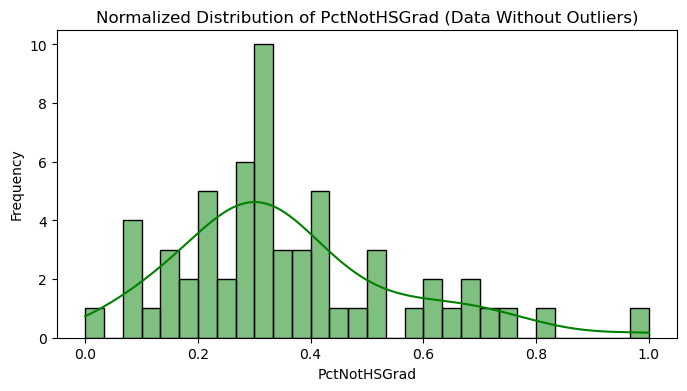


Feature: PctBSorMore
count    60.000000
mean      0.437821
std       0.277607
min       0.000000
25%       0.230769
50%       0.384615
75%       0.615385
max       1.000000
Name: PctBSorMore, dtype: float64


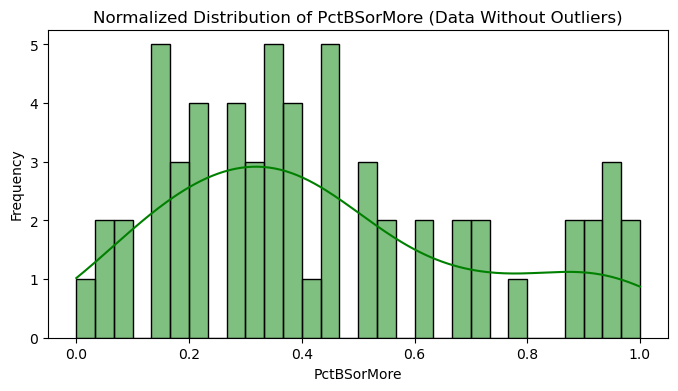


Feature: PctUnemployed
count    60.000000
mean      0.450450
std       0.240950
min       0.000000
25%       0.297297
50%       0.391892
75%       0.608108
max       1.000000
Name: PctUnemployed, dtype: float64


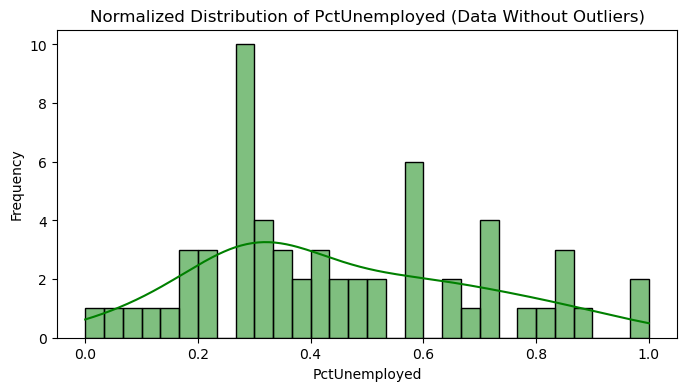


Feature: PctEmploy
count    60.000000
mean      0.566369
std       0.227690
min       0.000000
25%       0.410714
50%       0.571429
75%       0.767857
max       1.000000
Name: PctEmploy, dtype: float64


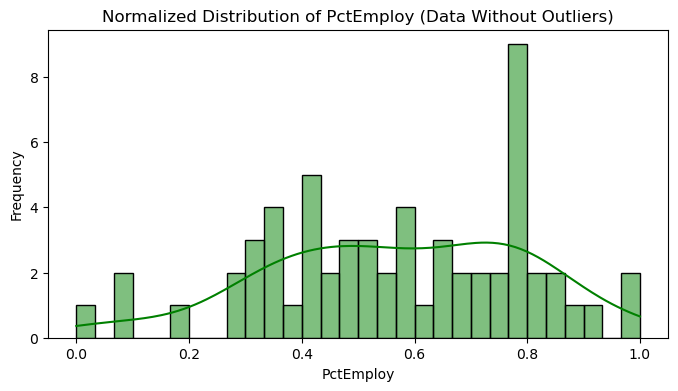


Feature: PctEmplManu
count    60.000000
mean      0.480729
std       0.219493
min       0.000000
25%       0.312500
50%       0.453125
75%       0.640625
max       1.000000
Name: PctEmplManu, dtype: float64


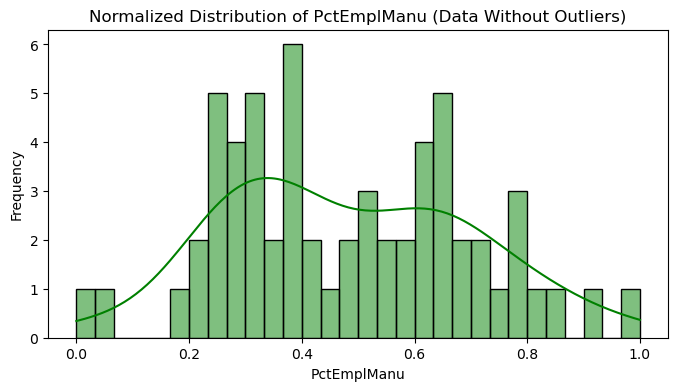


Feature: PctEmplProfServ
count    60.000000
mean      0.495139
std       0.193519
min       0.000000
25%       0.354167
50%       0.500000
75%       0.625000
max       1.000000
Name: PctEmplProfServ, dtype: float64


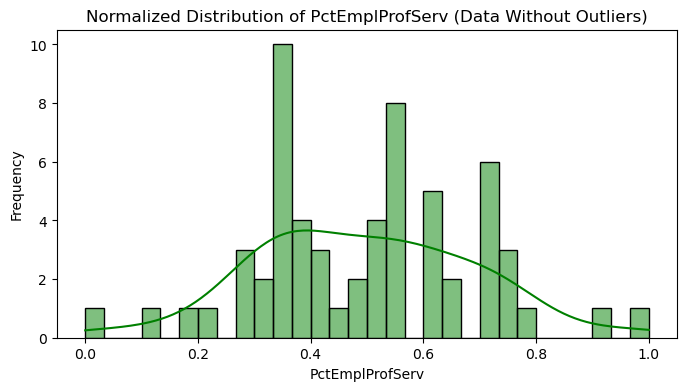


Feature: PctOccupManu
count    60.000000
mean      0.350490
std       0.216524
min       0.000000
25%       0.216912
50%       0.330882
75%       0.500000
max       1.000000
Name: PctOccupManu, dtype: float64


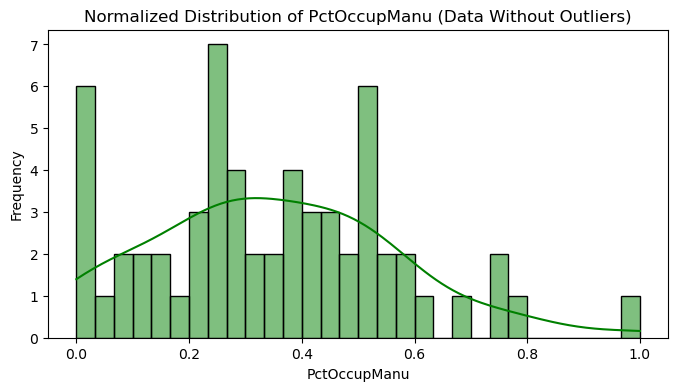


Feature: PctOccupMgmtProf
count    60.000000
mean      0.441212
std       0.252642
min       0.000000
25%       0.250000
50%       0.400000
75%       0.586364
max       1.000000
Name: PctOccupMgmtProf, dtype: float64


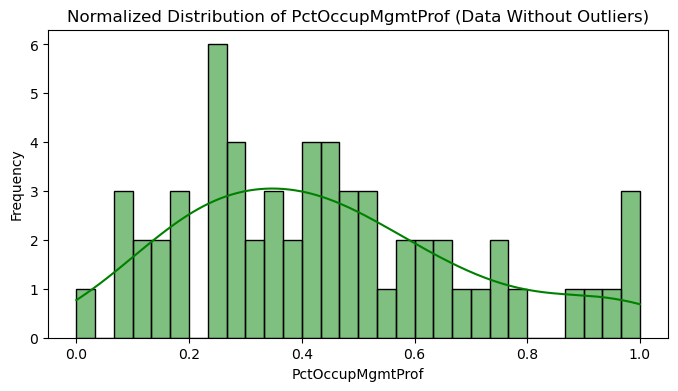


Feature: MalePctDivorce
count    60.000000
mean      0.581333
std       0.215717
min       0.000000
25%       0.440000
50%       0.580000
75%       0.760000
max       1.000000
Name: MalePctDivorce, dtype: float64


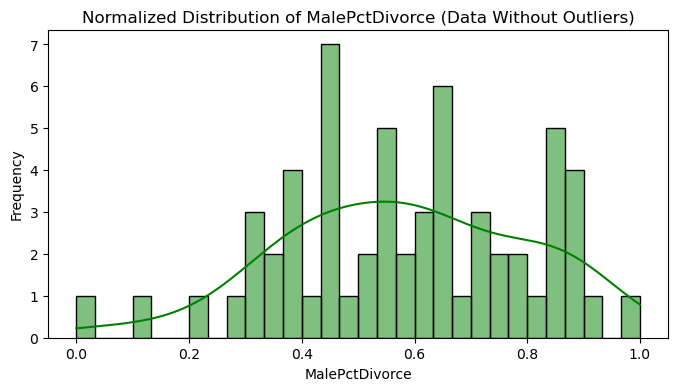


Feature: MalePctNevMarr
count    60.000000
mean      0.394231
std       0.230620
min       0.000000
25%       0.230769
50%       0.346154
75%       0.500000
max       1.000000
Name: MalePctNevMarr, dtype: float64


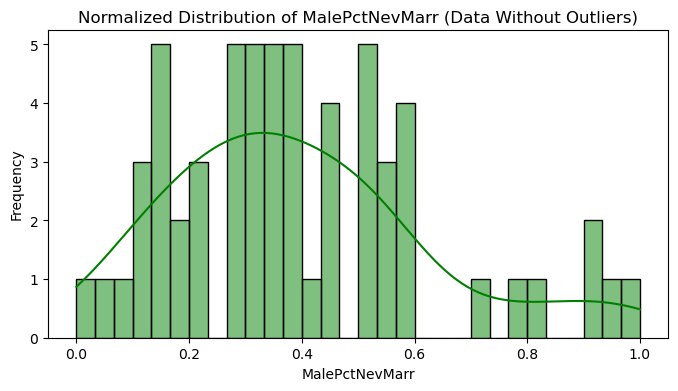


Feature: FemalePctDiv
count    60.000000
mean      0.596405
std       0.215620
min       0.000000
25%       0.465686
50%       0.588235
75%       0.769608
max       1.000000
Name: FemalePctDiv, dtype: float64


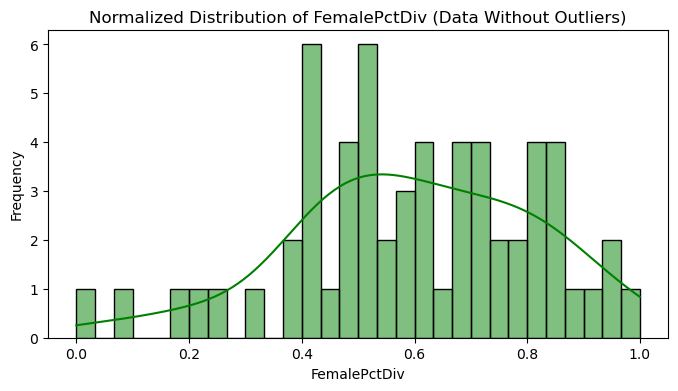


Feature: TotalPctDiv
count    60.000000
mean      0.647619
std       0.224187
min       0.000000
25%       0.489796
50%       0.632653
75%       0.836735
max       1.000000
Name: TotalPctDiv, dtype: float64


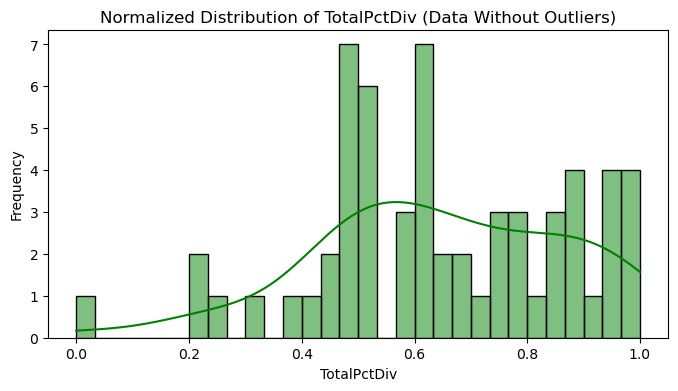


Feature: PersPerFam
count    60.000000
mean      0.545714
std       0.228129
min       0.000000
25%       0.428571
50%       0.600000
75%       0.685714
max       1.000000
Name: PersPerFam, dtype: float64


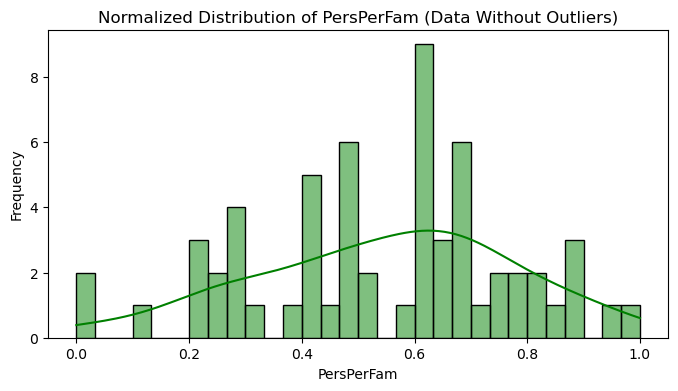


Feature: PctFam2Par
count    60.000000
mean      0.560417
std       0.182578
min       0.000000
25%       0.437500
50%       0.562500
75%       0.687500
max       1.000000
Name: PctFam2Par, dtype: float64


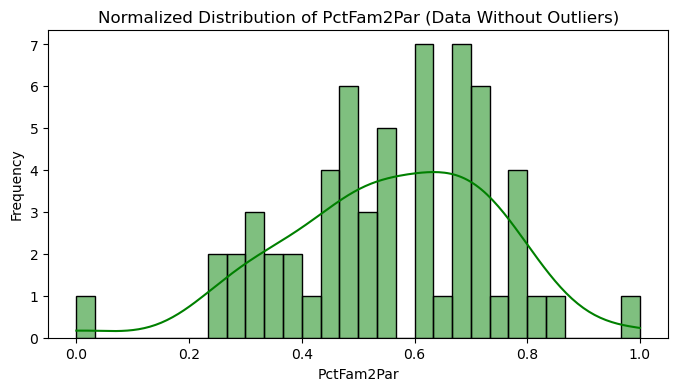


Feature: PctKids2Par
count    60.000000
mean      0.584014
std       0.181881
min       0.000000
25%       0.469388
50%       0.602041
75%       0.734694
max       1.000000
Name: PctKids2Par, dtype: float64


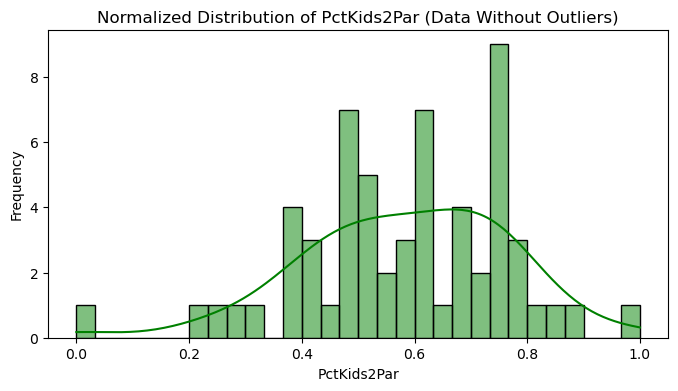


Feature: PctYoungKids2Par
count    60.000000
mean      0.601389
std       0.190727
min       0.000000
25%       0.479167
50%       0.604167
75%       0.729167
max       1.000000
Name: PctYoungKids2Par, dtype: float64


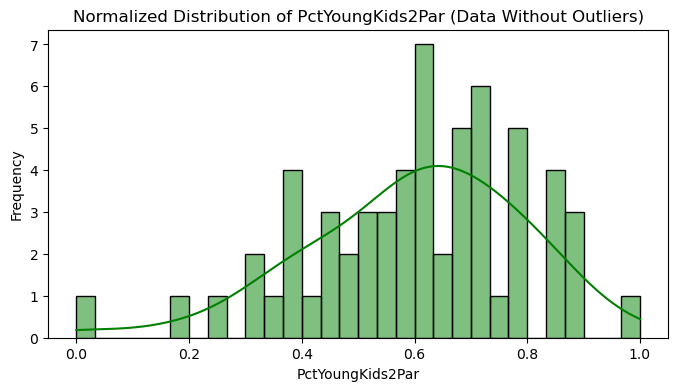


Feature: PctTeen2Par
count    60.000000
mean      0.571591
std       0.233348
min       0.000000
25%       0.426136
50%       0.625000
75%       0.750000
max       1.000000
Name: PctTeen2Par, dtype: float64


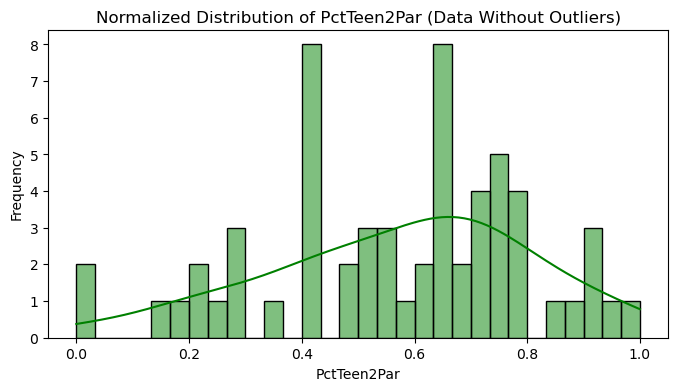


Feature: PctWorkMomYoungKids
count    60.000000
mean      0.454948
std       0.230792
min       0.000000
25%       0.308594
50%       0.507812
75%       0.613281
max       1.000000
Name: PctWorkMomYoungKids, dtype: float64


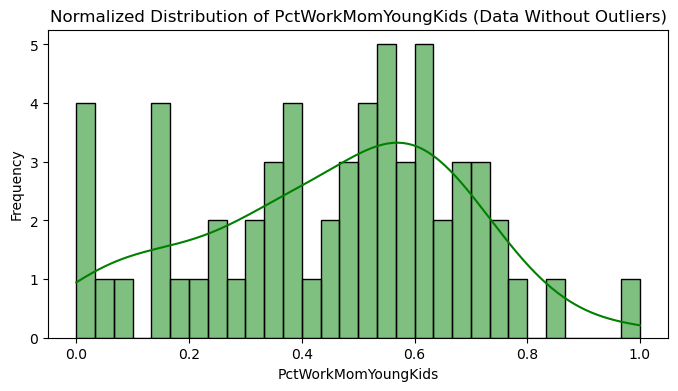


Feature: PctWorkMom
count    60.000000
mean      0.609064
std       0.246824
min       0.000000
25%       0.495614
50%       0.657895
75%       0.789474
max       1.000000
Name: PctWorkMom, dtype: float64


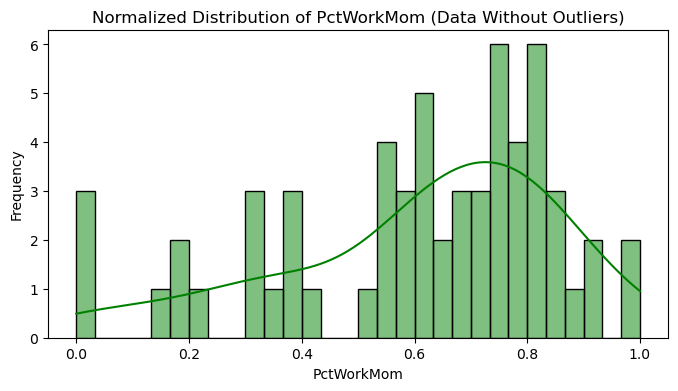


Feature: NumIlleg
count    60.000000
mean      0.316667
std       0.469102
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       1.000000
Name: NumIlleg, dtype: float64


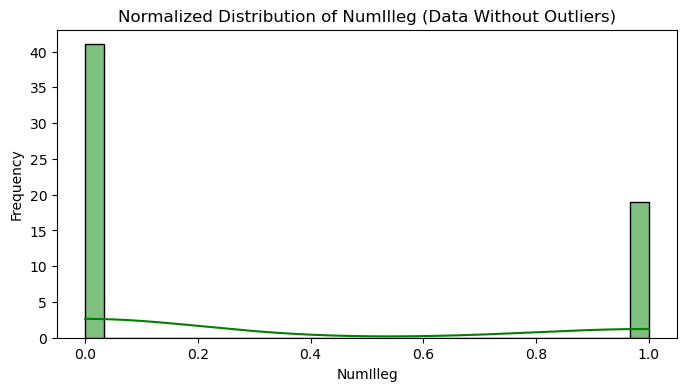


Feature: PctIlleg
count    60.000000
mean      0.289080
std       0.195692
min       0.000000
25%       0.137931
50%       0.275862
75%       0.413793
max       1.000000
Name: PctIlleg, dtype: float64


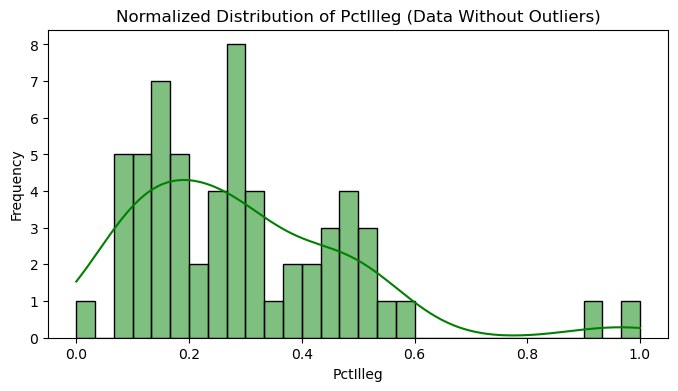


Feature: NumImmig
count    60.000000
mean      0.233333
std       0.426522
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: NumImmig, dtype: float64


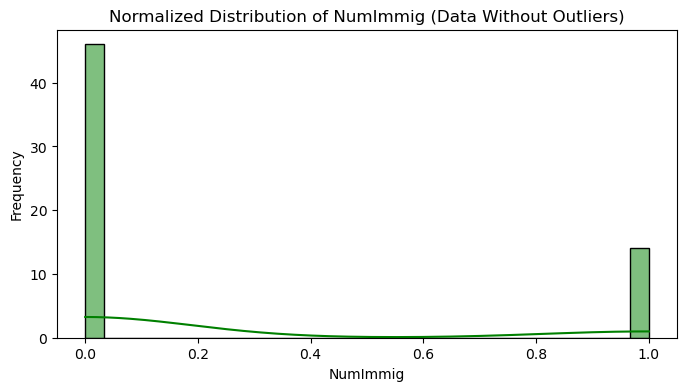


Feature: PctImmigRecent
count    60.000000
mean      0.291398
std       0.264525
min       0.000000
25%       0.048387
50%       0.241935
75%       0.471774
max       1.000000
Name: PctImmigRecent, dtype: float64


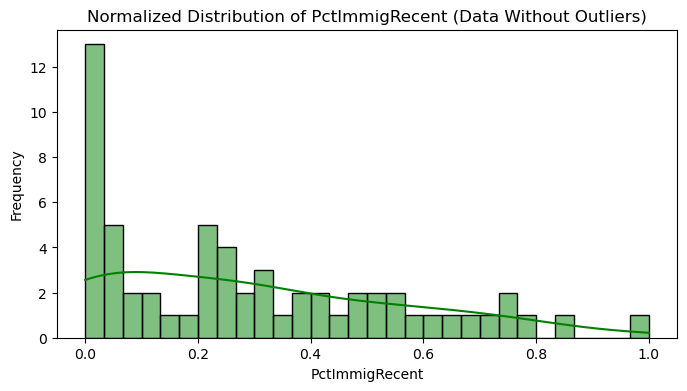


Feature: PctImmigRec5
count    60.000000
mean      0.360452
std       0.251258
min       0.000000
25%       0.177966
50%       0.347458
75%       0.563559
max       1.000000
Name: PctImmigRec5, dtype: float64


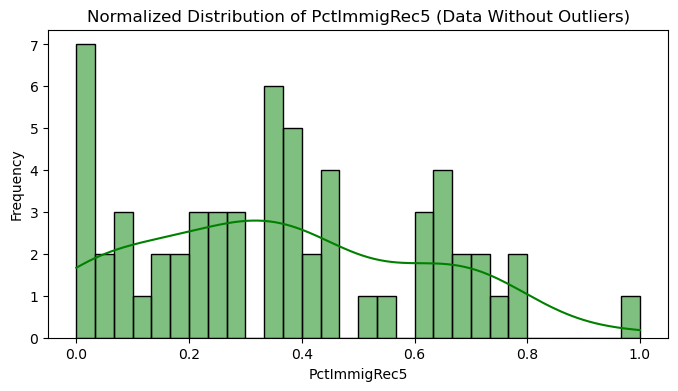


Feature: PctImmigRec8
count    60.000000
mean      0.448023
std       0.245723
min       0.000000
25%       0.317797
50%       0.432203
75%       0.627119
max       1.000000
Name: PctImmigRec8, dtype: float64


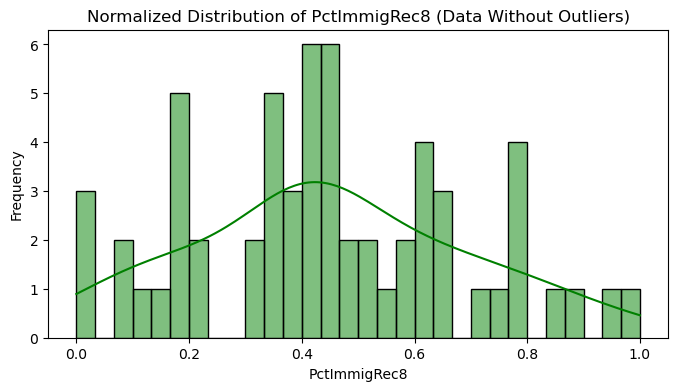


Feature: PctImmigRec10
count    60.000000
mean      0.421667
std       0.225379
min       0.000000
25%       0.267857
50%       0.400000
75%       0.592857
max       1.000000
Name: PctImmigRec10, dtype: float64


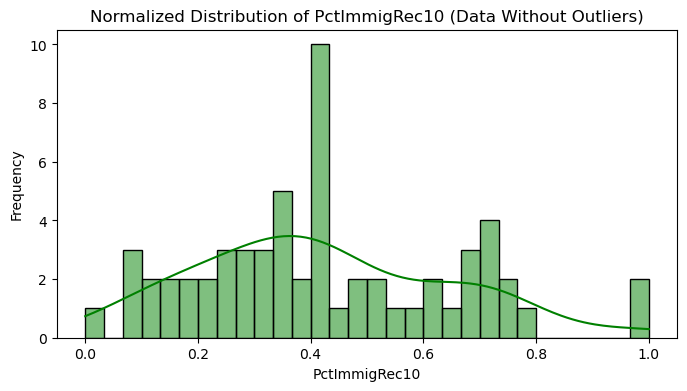


Feature: PctRecentImmig
count    60.000000
mean      0.233333
std       0.241583
min       0.000000
25%       0.076923
50%       0.153846
75%       0.384615
max       1.000000
Name: PctRecentImmig, dtype: float64


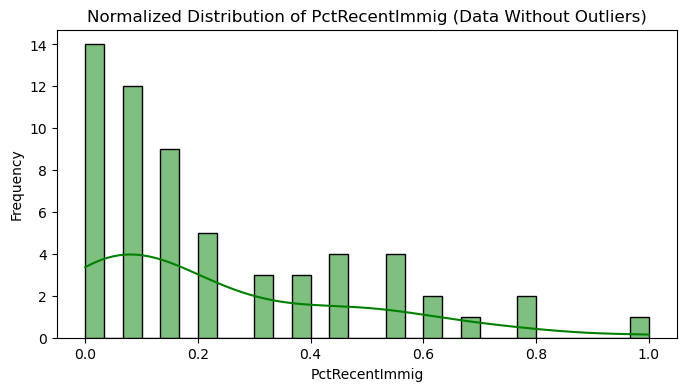


Feature: PctRecImmig5
count    60.000000
mean      0.308333
std       0.288944
min       0.000000
25%       0.100000
50%       0.200000
75%       0.425000
max       1.000000
Name: PctRecImmig5, dtype: float64


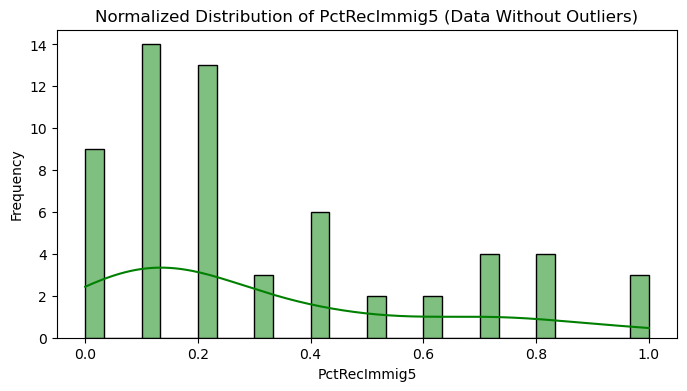


Feature: PctRecImmig8
count    60.000000
mean      0.294444
std       0.250924
min       0.000000
25%       0.083333
50%       0.166667
75%       0.416667
max       1.000000
Name: PctRecImmig8, dtype: float64


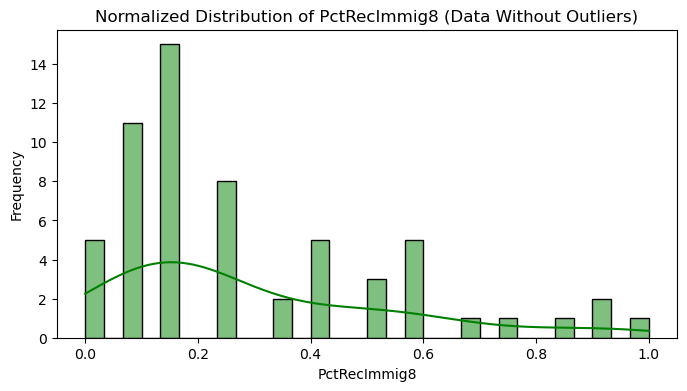


Feature: PctRecImmig10
count    60.000000
mean      0.311111
std       0.266572
min       0.000000
25%       0.145833
50%       0.250000
75%       0.500000
max       1.000000
Name: PctRecImmig10, dtype: float64


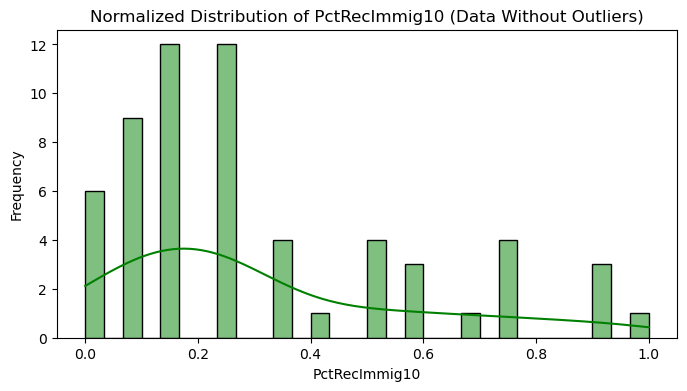


Feature: PctSpeakEnglOnly
count    60.000000
mean      0.722727
std       0.209339
min       0.000000
25%       0.579545
50%       0.772727
75%       0.863636
max       1.000000
Name: PctSpeakEnglOnly, dtype: float64


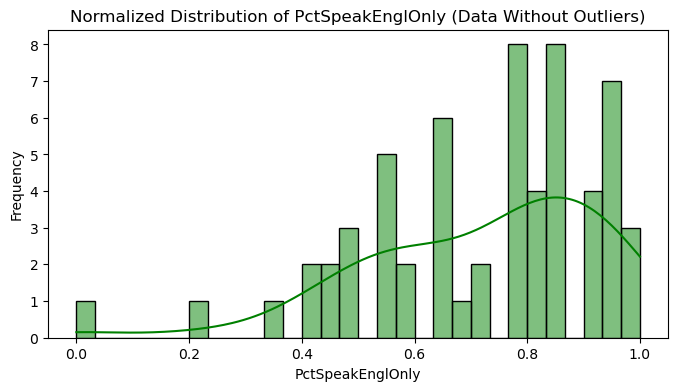


Feature: PctNotSpeakEnglWell
count    60.000000
mean      0.354545
std       0.228088
min       0.000000
25%       0.181818
50%       0.272727
75%       0.545455
max       1.000000
Name: PctNotSpeakEnglWell, dtype: float64


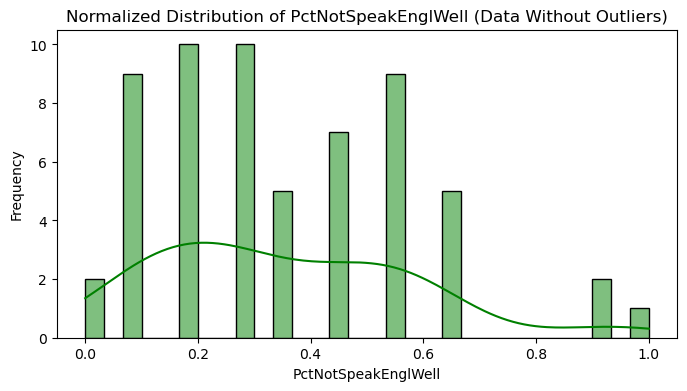


Feature: PctLargHouseFam
count    60.000000
mean      0.398611
std       0.239217
min       0.000000
25%       0.208333
50%       0.375000
75%       0.552083
max       1.000000
Name: PctLargHouseFam, dtype: float64


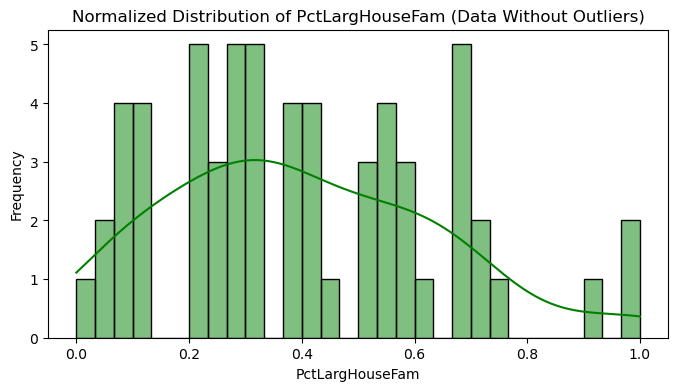


Feature: PctLargHouseOccup
count    60.000000
mean      0.386806
std       0.239921
min       0.000000
25%       0.208333
50%       0.375000
75%       0.583333
max       1.000000
Name: PctLargHouseOccup, dtype: float64


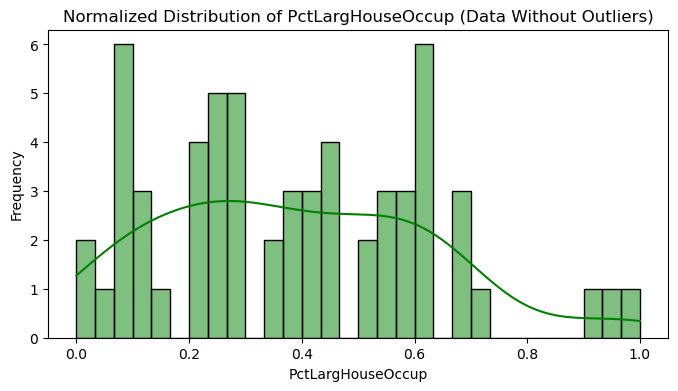


Feature: PersPerOccupHous
count    60.000000
mean      0.501587
std       0.227059
min       0.000000
25%       0.333333
50%       0.476190
75%       0.648810
max       1.000000
Name: PersPerOccupHous, dtype: float64


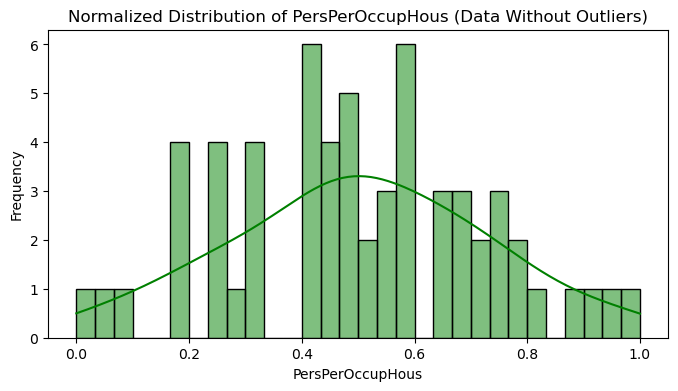


Feature: PersPerOwnOccHous
count    60.000000
mean      0.635294
std       0.196649
min       0.000000
25%       0.504902
50%       0.647059
75%       0.764706
max       1.000000
Name: PersPerOwnOccHous, dtype: float64


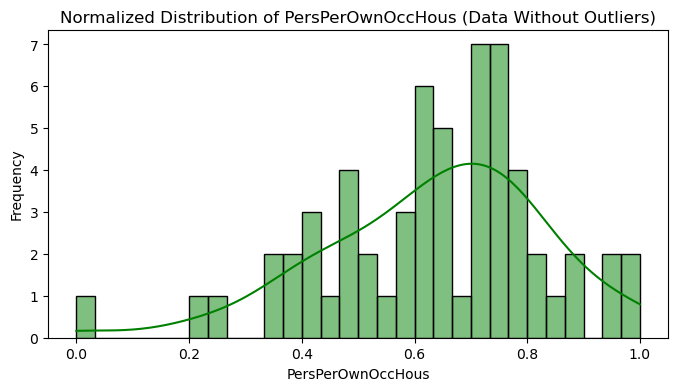


Feature: PersPerRentOccHous
count    60.000000
mean      0.417361
std       0.246293
min       0.000000
25%       0.208333
50%       0.416667
75%       0.567708
max       1.000000
Name: PersPerRentOccHous, dtype: float64


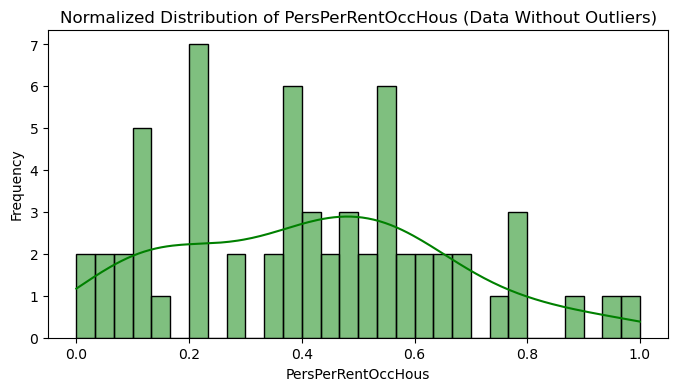


Feature: PctPersOwnOccup
count    60.000000
mean      0.471088
std       0.192266
min       0.000000
25%       0.341837
50%       0.469388
75%       0.612245
max       1.000000
Name: PctPersOwnOccup, dtype: float64


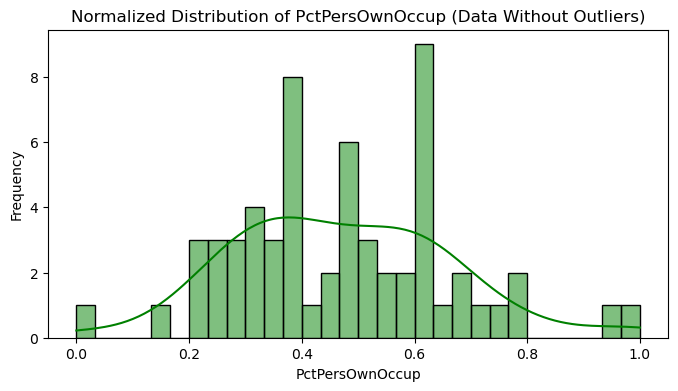


Feature: PctPersDenseHous
count    60.000000
mean      0.401042
std       0.242004
min       0.000000
25%       0.187500
50%       0.375000
75%       0.562500
max       1.000000
Name: PctPersDenseHous, dtype: float64


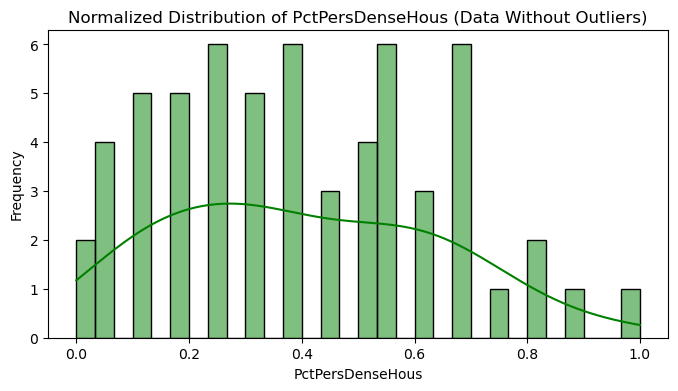


Feature: PctHousLess3BR
count    60.000000
mean      0.615315
std       0.245768
min       0.000000
25%       0.452703
50%       0.635135
75%       0.790541
max       1.000000
Name: PctHousLess3BR, dtype: float64


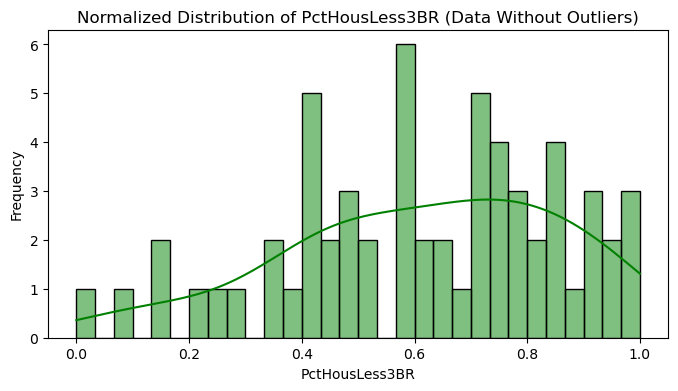


Feature: HousVacant
count    60.000000
mean      0.283333
std       0.222392
min       0.000000
25%       0.142857
50%       0.285714
75%       0.428571
max       1.000000
Name: HousVacant, dtype: float64


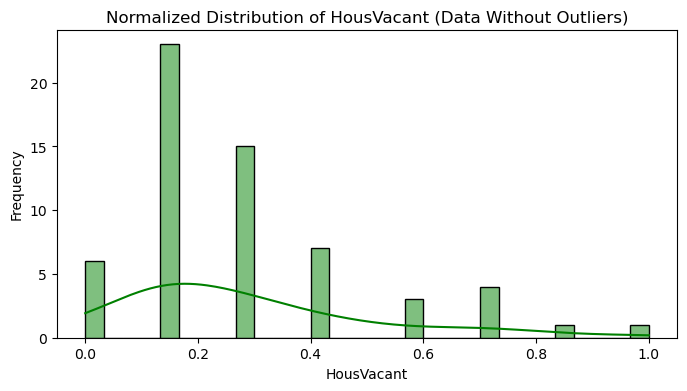


Feature: PctHousOccup
count    60.000000
mean      0.673171
std       0.228280
min       0.000000
25%       0.536585
50%       0.707317
75%       0.859756
max       1.000000
Name: PctHousOccup, dtype: float64


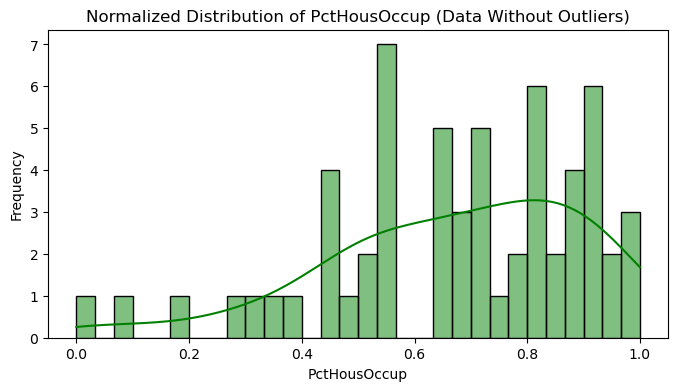


Feature: PctHousOwnOcc
count    60.000000
mean      0.424823
std       0.201504
min       0.000000
25%       0.276596
50%       0.414894
75%       0.553191
max       1.000000
Name: PctHousOwnOcc, dtype: float64


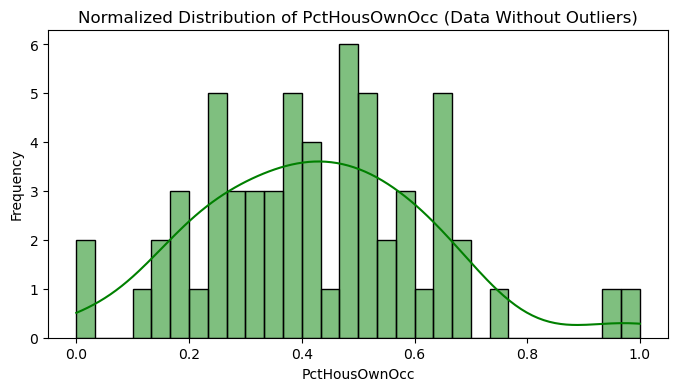


Feature: PctVacantBoarded
count    60.000000
mean      0.328095
std       0.293666
min       0.000000
25%       0.085714
50%       0.257143
75%       0.428571
max       1.000000
Name: PctVacantBoarded, dtype: float64


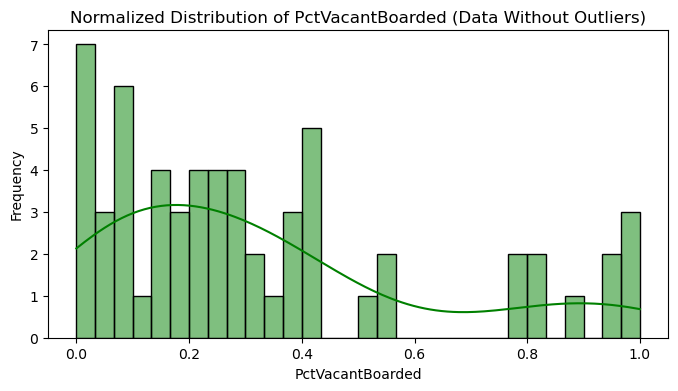


Feature: PctVacMore6Mos
count    60.000000
mean      0.422034
std       0.257457
min       0.000000
25%       0.233051
50%       0.372881
75%       0.584746
max       1.000000
Name: PctVacMore6Mos, dtype: float64


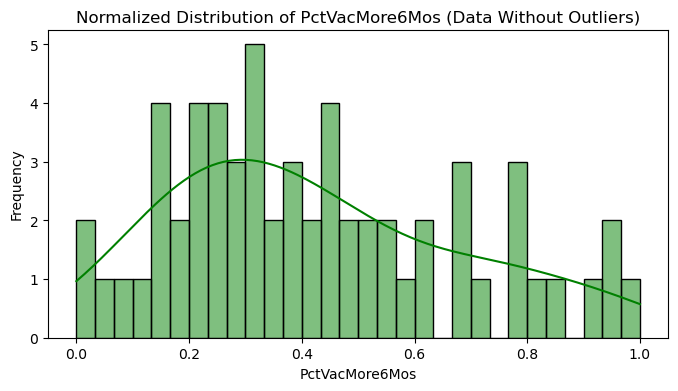


Feature: MedYrHousBuilt
count    60.000000
mean      0.550000
std       0.256052
min       0.000000
25%       0.345455
50%       0.618182
75%       0.763636
max       1.000000
Name: MedYrHousBuilt, dtype: float64


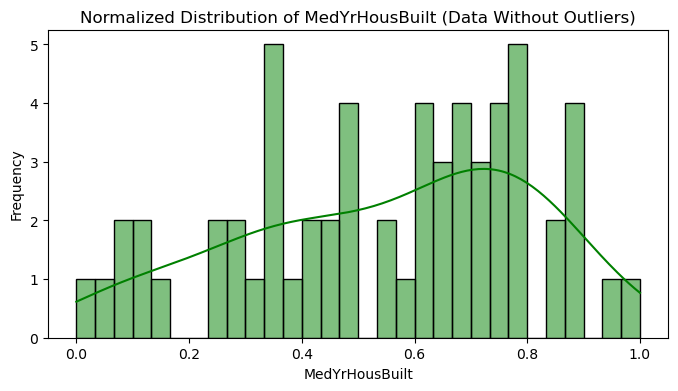


Feature: PctHousNoPhone
count    60.000000
mean      0.314667
std       0.234307
min       0.000000
25%       0.140000
50%       0.260000
75%       0.425000
max       1.000000
Name: PctHousNoPhone, dtype: float64


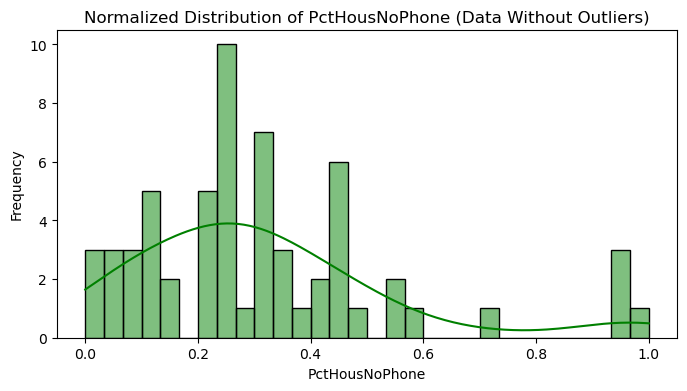


Feature: PctWOFullPlumb
count    60.000000
mean      0.350427
std       0.286410
min       0.000000
25%       0.173077
50%       0.269231
75%       0.512821
max       1.000000
Name: PctWOFullPlumb, dtype: float64


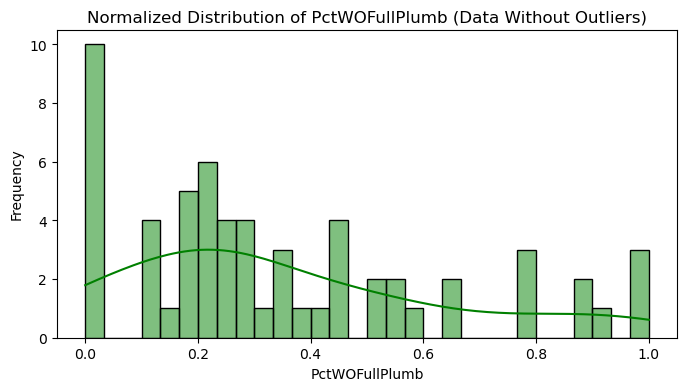


Feature: OwnOccLowQuart
count    60.000000
mean      0.541176
std       0.252789
min       0.000000
25%       0.352941
50%       0.588235
75%       0.705882
max       1.000000
Name: OwnOccLowQuart, dtype: float64


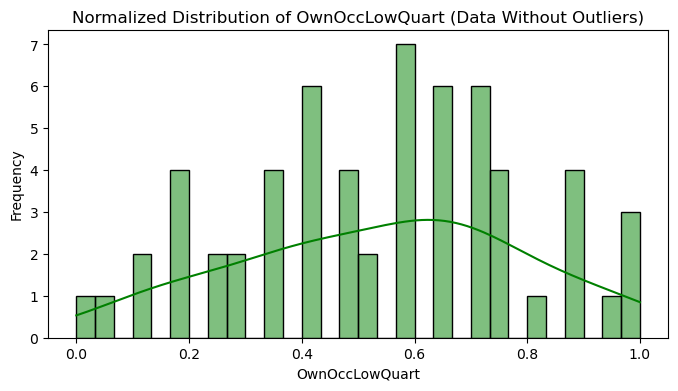


Feature: OwnOccMedVal
count    60.000000
mean      0.392029
std       0.194522
min       0.000000
25%       0.260870
50%       0.391304
75%       0.565217
max       1.000000
Name: OwnOccMedVal, dtype: float64


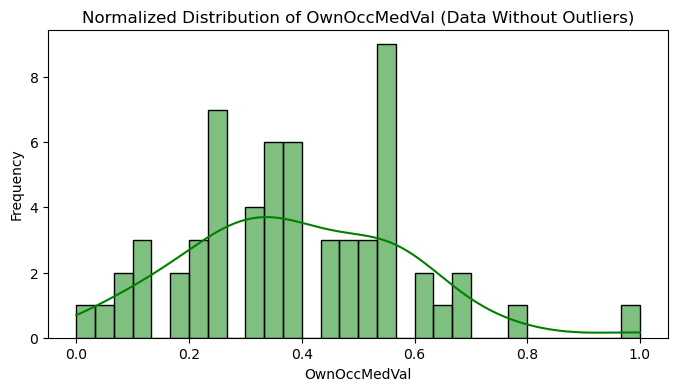


Feature: OwnOccHiQuart
count    60.000000
mean      0.358333
std       0.209979
min       0.000000
25%       0.166667
50%       0.333333
75%       0.468750
max       1.000000
Name: OwnOccHiQuart, dtype: float64


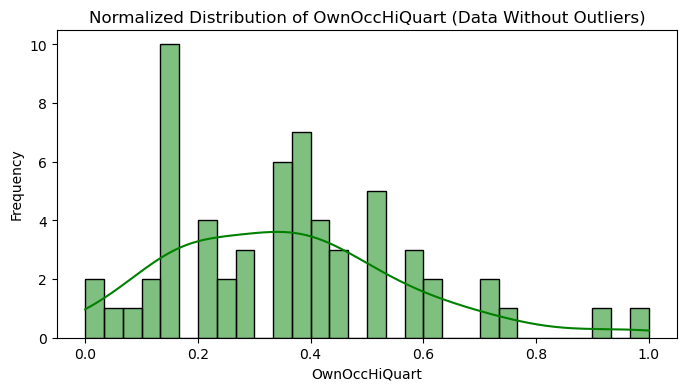


Feature: RentLowQ
count    60.000000
mean      0.554286
std       0.230632
min       0.000000
25%       0.421429
50%       0.571429
75%       0.714286
max       1.000000
Name: RentLowQ, dtype: float64


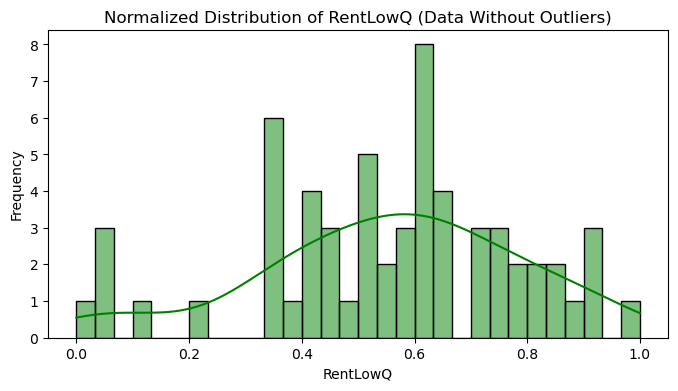


Feature: RentMedian
count    60.000000
mean      0.554023
std       0.225616
min       0.000000
25%       0.413793
50%       0.551724
75%       0.689655
max       1.000000
Name: RentMedian, dtype: float64


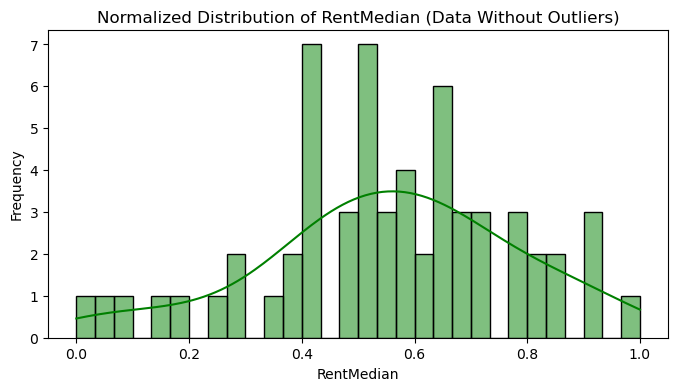


Feature: RentHighQ
count    60.000000
mean      0.512500
std       0.226040
min       0.000000
25%       0.388889
50%       0.472222
75%       0.666667
max       1.000000
Name: RentHighQ, dtype: float64


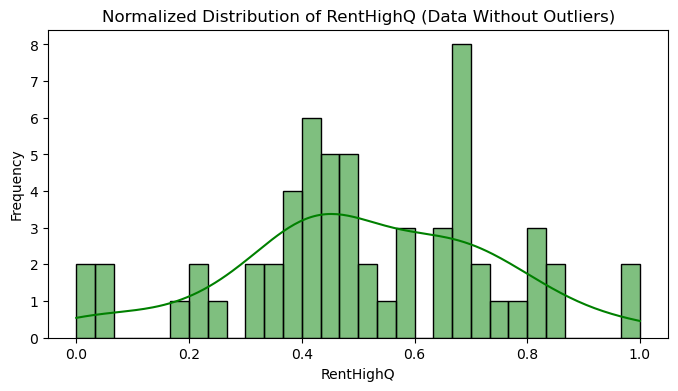


Feature: MedRent
count    60.000000
mean      0.491441
std       0.195370
min       0.000000
25%       0.398649
50%       0.486486
75%       0.628378
max       1.000000
Name: MedRent, dtype: float64


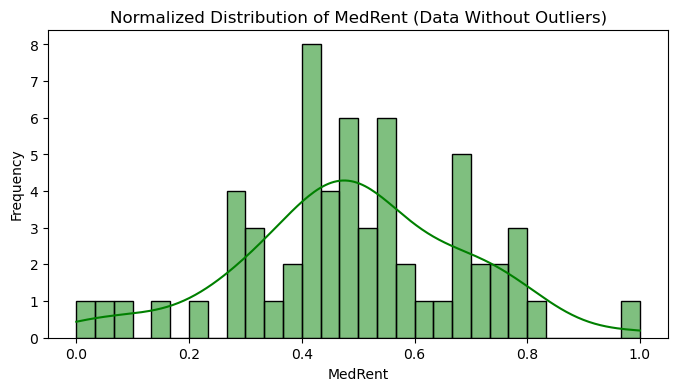


Feature: MedRentPctHousInc
count    60.000000
mean      0.475725
std       0.217247
min       0.000000
25%       0.342391
50%       0.500000
75%       0.608696
max       1.000000
Name: MedRentPctHousInc, dtype: float64


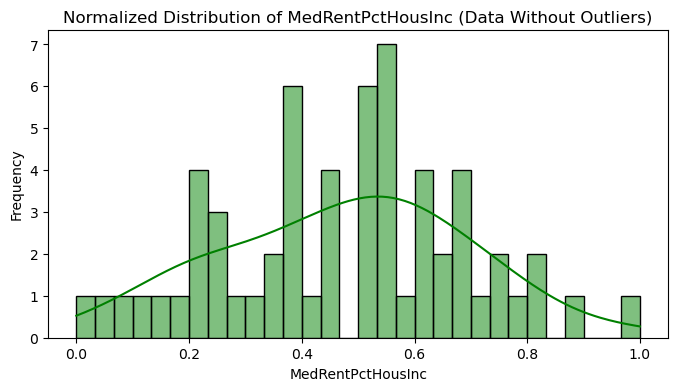


Feature: MedOwnCostPctInc
count    60.000000
mean      0.476190
std       0.260848
min       0.000000
25%       0.276786
50%       0.500000
75%       0.678571
max       1.000000
Name: MedOwnCostPctInc, dtype: float64


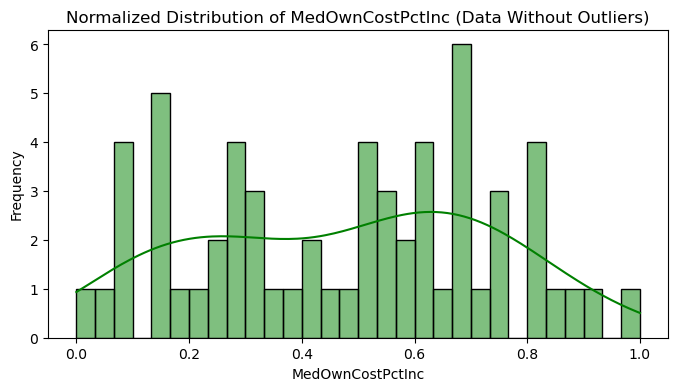


Feature: MedOwnCostPctIncNoMtg
count    60.000000
mean      0.398000
std       0.210365
min       0.000000
25%       0.260000
50%       0.340000
75%       0.465000
max       1.000000
Name: MedOwnCostPctIncNoMtg, dtype: float64


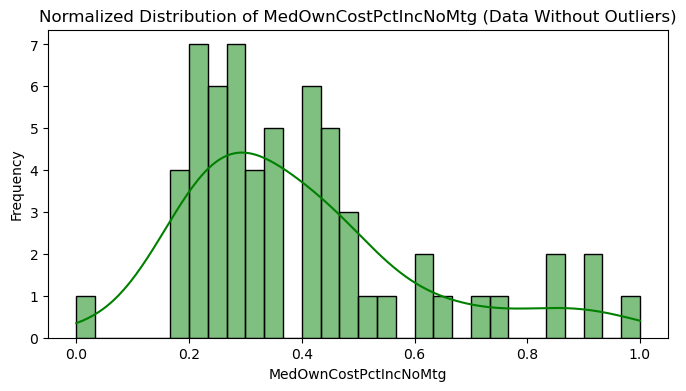


Feature: PctForeignBorn
count    60.000000
mean      0.286842
std       0.222122
min       0.000000
25%       0.105263
50%       0.210526
75%       0.473684
max       1.000000
Name: PctForeignBorn, dtype: float64


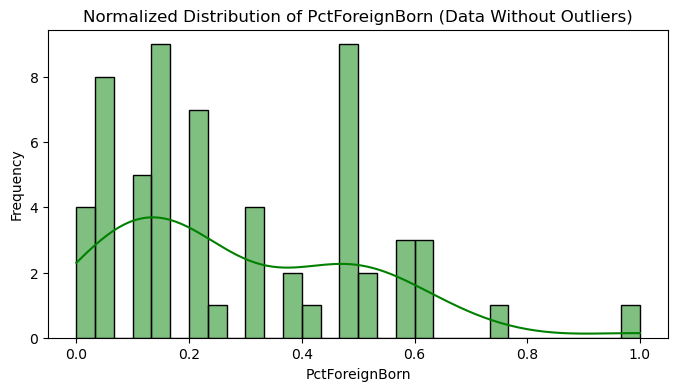


Feature: PctBornSameState
count    60.000000
mean      0.592995
std       0.222790
min       0.000000
25%       0.427536
50%       0.608696
75%       0.757246
max       1.000000
Name: PctBornSameState, dtype: float64


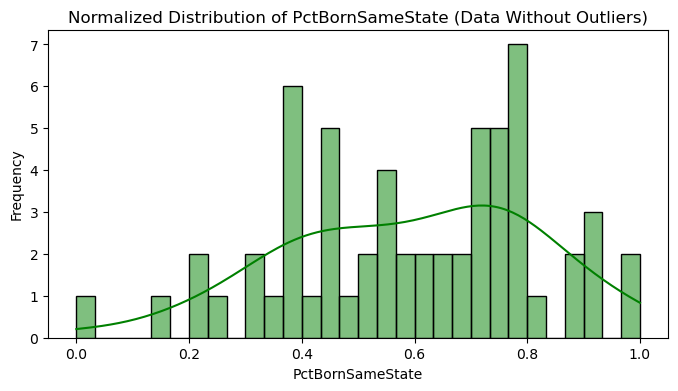


Feature: PctSameHouse85
count    60.000000
mean      0.437566
std       0.237464
min       0.000000
25%       0.238095
50%       0.404762
75%       0.571429
max       1.000000
Name: PctSameHouse85, dtype: float64


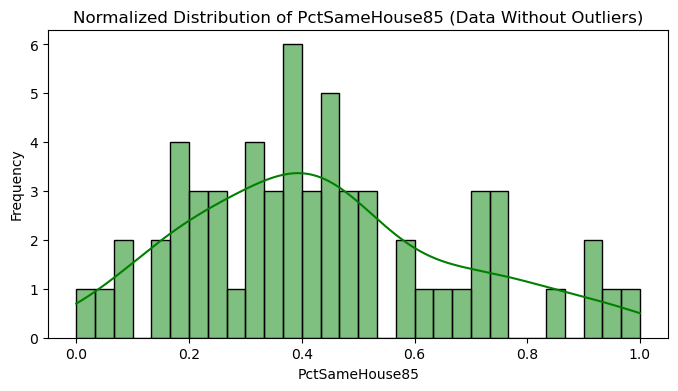


Feature: PctSameCity85
count    60.000000
mean      0.587281
std       0.215404
min       0.000000
25%       0.434211
50%       0.578947
75%       0.763158
max       1.000000
Name: PctSameCity85, dtype: float64


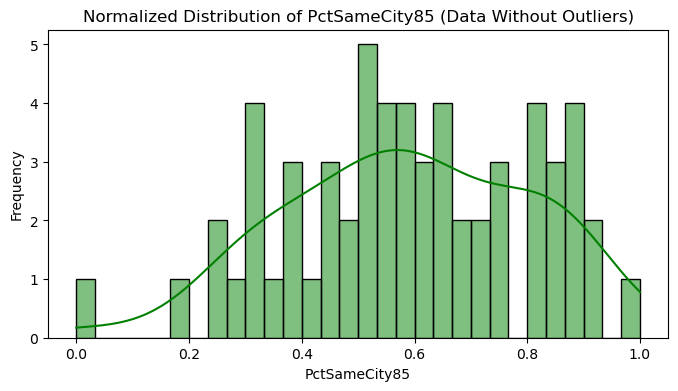


Feature: PctSameState85
count    60.000000
mean      0.599091
std       0.251388
min       0.000000
25%       0.436364
50%       0.690909
75%       0.800000
max       1.000000
Name: PctSameState85, dtype: float64


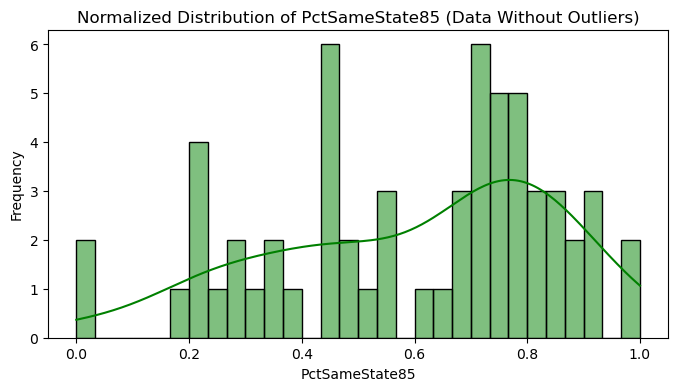


Feature: LandArea
count    60.000000
mean      0.368519
std       0.203023
min       0.000000
25%       0.222222
50%       0.333333
75%       0.472222
max       1.000000
Name: LandArea, dtype: float64


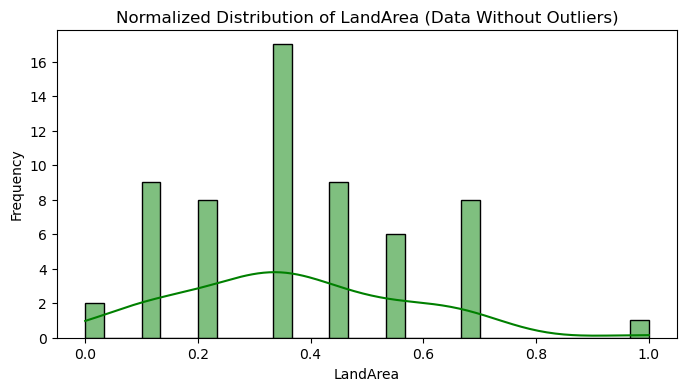


Feature: PopDens
count    60.000000
mean      0.347297
std       0.254405
min       0.000000
25%       0.155405
50%       0.243243
75%       0.567568
max       1.000000
Name: PopDens, dtype: float64


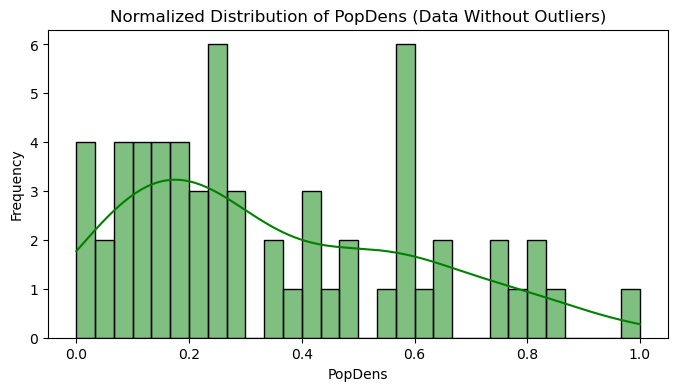


Feature: PctUsePubTrans
count    60.000000
mean      0.267361
std       0.266332
min       0.000000
25%       0.041667
50%       0.166667
75%       0.416667
max       1.000000
Name: PctUsePubTrans, dtype: float64


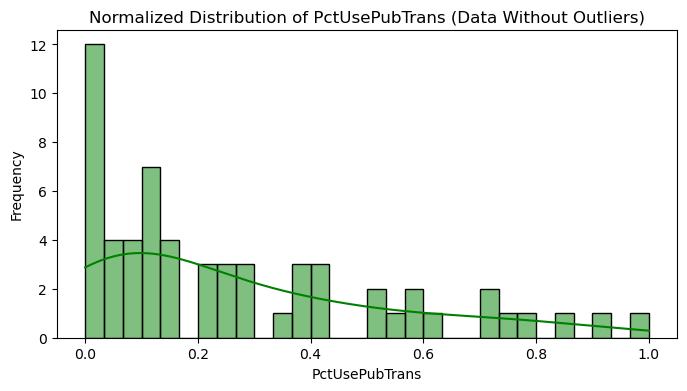


Feature: ViolentCrimesPerPop
count    60.000000
mean      0.382000
std       0.228709
min       0.000000
25%       0.200000
50%       0.320000
75%       0.490000
max       1.000000
Name: ViolentCrimesPerPop, dtype: float64


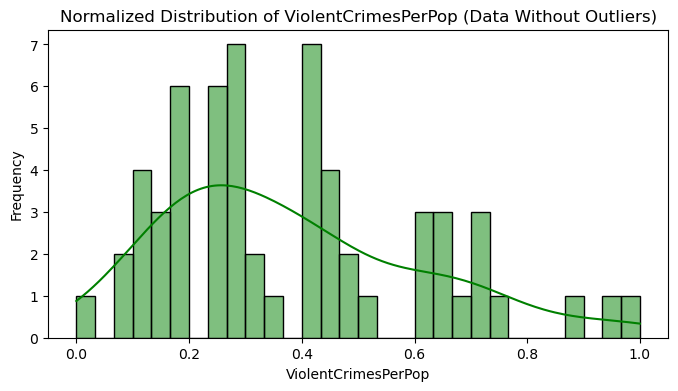


Feature: communityname
communityname
Gladstonecity             2
Longmontcity              1
Burlesoncity              1
Highlandtown              1
Broomfieldcity            1
Duncanvillecity           1
Puyallupcity              1
Fairfieldcity             1
Sherwoodcity              1
NorthRichlandHillscity    1
Nederlandcity             1
WestLinncity              1
Crestwoodcity             1
Bentoncity                1
Greenvillecity            1
Littletoncity             1
Northglenncity            1
Friendswoodcity           1
Christiansburgtown        1
Beltoncity                1
Centertownship            1
Deptfordtownship          1
Pearlandcity              1
OceanSpringscity          1
Rockwallcity              1
Bedfordcity               1
Grandviewcity             1
Hazelwoodcity             1
Smyrnatown                1
Ashwaubenonvillage        1
Rogerscity                1
Shivelycity               1
Independencecity          1
Mauldincity               1
TheVillage

C:\Users\mustapha\AppData\Local\Temp\ipykernel_20248\1628217508.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=dataset[feature], order=dataset[feature].value_counts().index, palette="viridis")


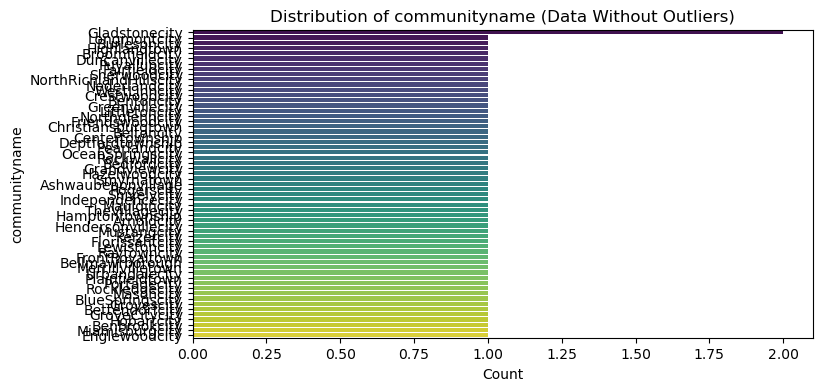


==== Data With Outliers ====
Numeric Features: ['state', 'county', 'community', 'fold', 'population', 'householdsize', 'racepctblack', 'racePctWhite', 'racePctAsian', 'racePctHisp', 'agePct12t21', 'agePct12t29', 'agePct16t24', 'agePct65up', 'numbUrban', 'pctUrban', 'medIncome', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'medFamInc', 'perCapInc', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'NumUnderPov', 'PctPopUnderPov', 'PctLess9thGrade', 'PctNotHSGrad', 'PctBSorMore', 'PctUnemployed', 'PctEmploy', 'PctEmplManu', 'PctEmplProfServ', 'PctOccupManu', 'PctOccupMgmtProf', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'TotalPctDiv', 'PersPerFam', 'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMomYoungKids', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRecent', 'PctImmigRec5', 'PctImmigRec8', 'PctImmigRec10', 'PctRecentImmig', 'PctRecImmig5', 'PctRecImmig8', '

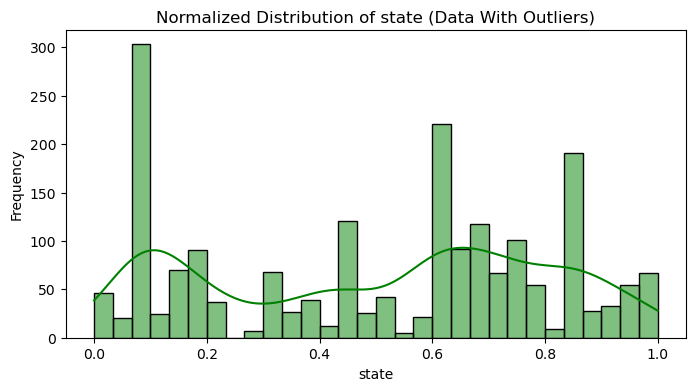


Feature: county
count    1994.000000
mean        0.029747
std         0.101993
min         0.000000
25%         0.002384
50%         0.002384
75%         0.019070
max         1.000000
Name: county, dtype: float64


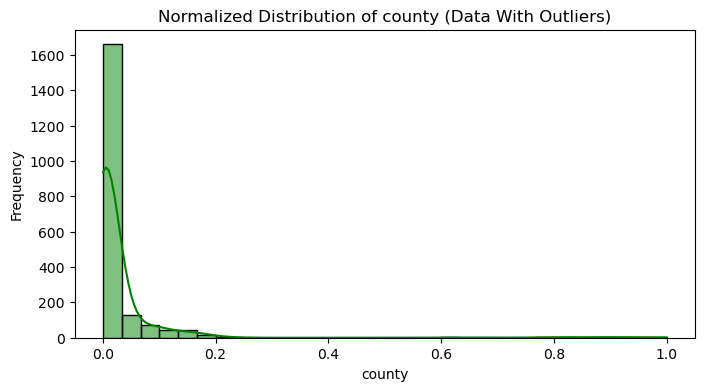


Feature: community
count    1994.000000
mean        0.205708
std         0.290907
min         0.000000
25%         0.009838
50%         0.009838
75%         0.418148
max         1.000000
Name: community, dtype: float64


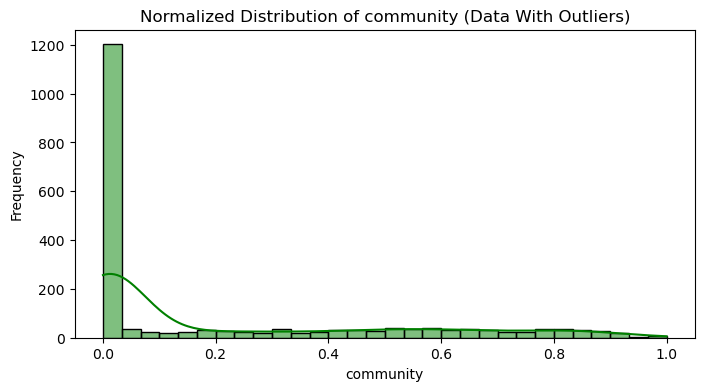


Feature: fold
count    1994.000000
mean        0.499331
std         0.319299
min         0.000000
25%         0.222222
50%         0.444444
75%         0.777778
max         1.000000
Name: fold, dtype: float64


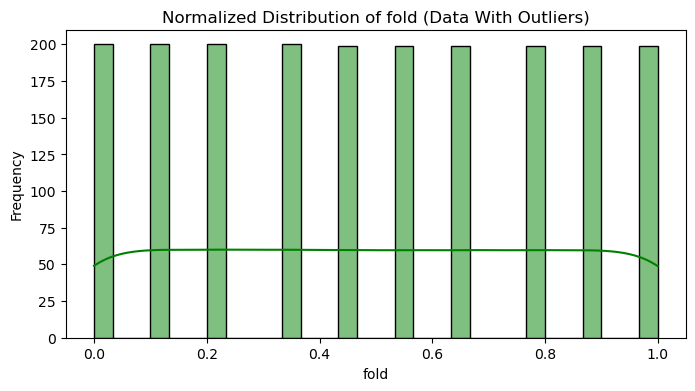


Feature: population
count    1994.000000
mean        0.057593
std         0.126906
min         0.000000
25%         0.010000
50%         0.020000
75%         0.050000
max         1.000000
Name: population, dtype: float64


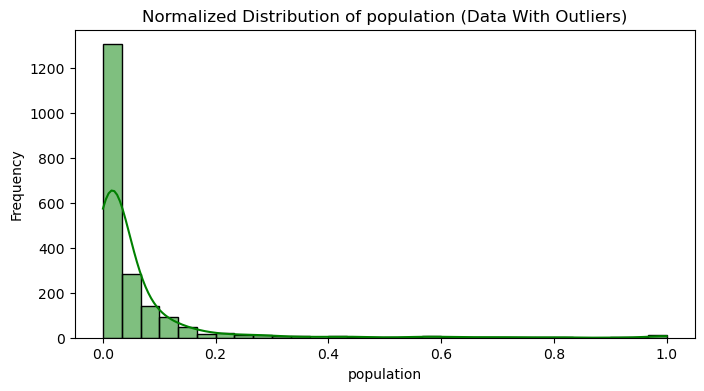


Feature: householdsize
count    1994.000000
mean        0.463395
std         0.163717
min         0.000000
25%         0.350000
50%         0.440000
75%         0.540000
max         1.000000
Name: householdsize, dtype: float64


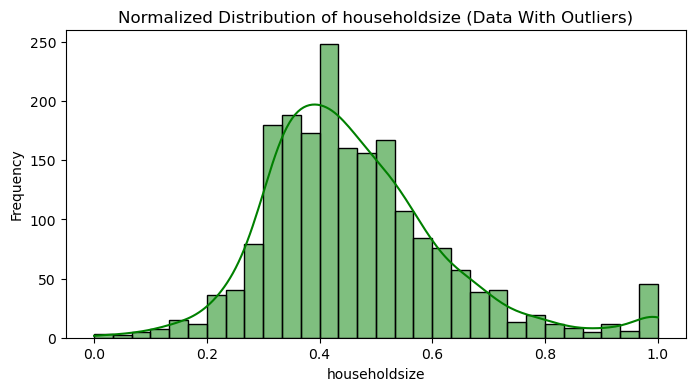


Feature: racepctblack
count    1994.000000
mean        0.179629
std         0.253442
min         0.000000
25%         0.020000
50%         0.060000
75%         0.230000
max         1.000000
Name: racepctblack, dtype: float64


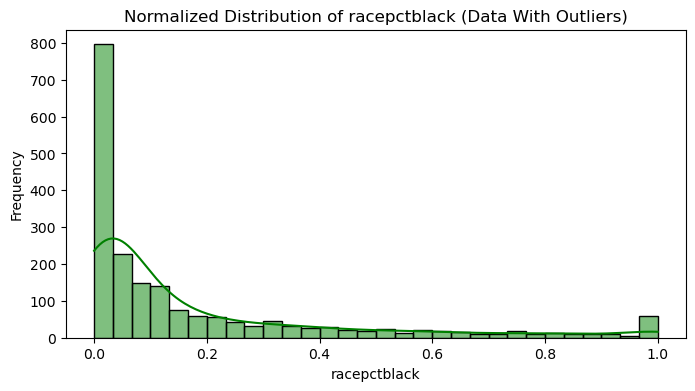


Feature: racePctWhite
count    1994.000000
mean        0.753716
std         0.244039
min         0.000000
25%         0.630000
50%         0.850000
75%         0.940000
max         1.000000
Name: racePctWhite, dtype: float64


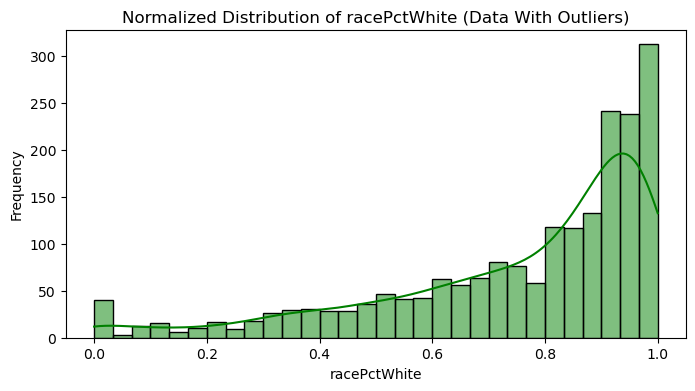


Feature: racePctAsian
count    1994.000000
mean        0.153681
std         0.208877
min         0.000000
25%         0.040000
50%         0.070000
75%         0.170000
max         1.000000
Name: racePctAsian, dtype: float64


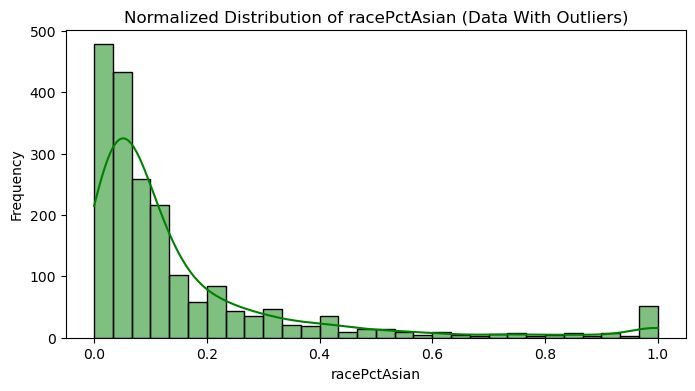


Feature: racePctHisp
count    1994.000000
mean        0.144022
std         0.232492
min         0.000000
25%         0.010000
50%         0.040000
75%         0.160000
max         1.000000
Name: racePctHisp, dtype: float64


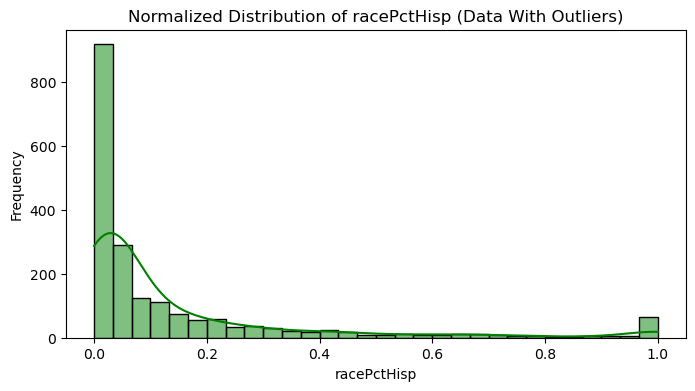


Feature: agePct12t21
count    1994.000000
mean        0.424218
std         0.155196
min         0.000000
25%         0.340000
50%         0.400000
75%         0.470000
max         1.000000
Name: agePct12t21, dtype: float64


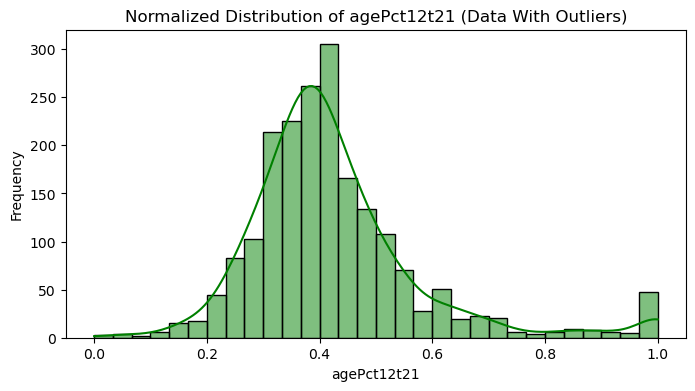


Feature: agePct12t29
count    1994.000000
mean        0.493867
std         0.143564
min         0.000000
25%         0.410000
50%         0.480000
75%         0.540000
max         1.000000
Name: agePct12t29, dtype: float64


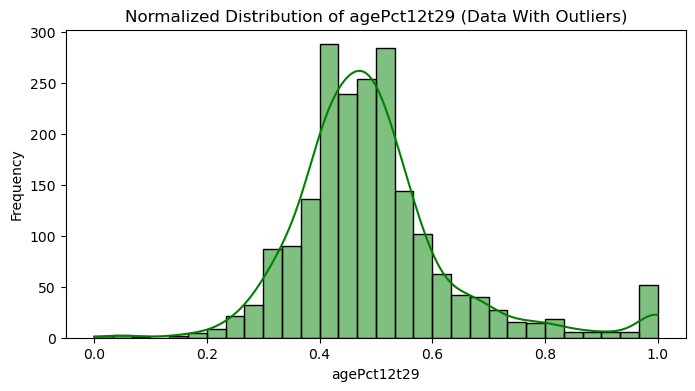


Feature: agePct16t24
count    1994.000000
mean        0.336264
std         0.166505
min         0.000000
25%         0.250000
50%         0.290000
75%         0.360000
max         1.000000
Name: agePct16t24, dtype: float64


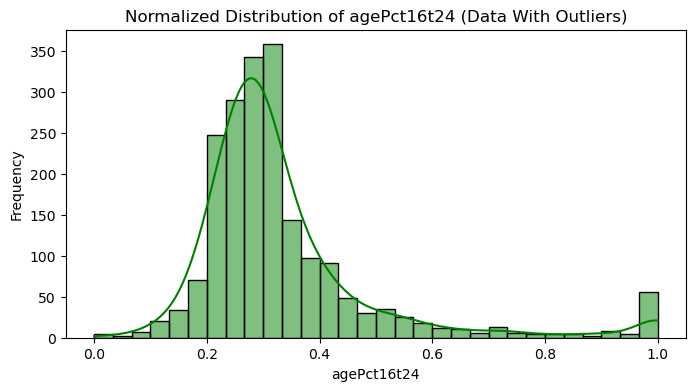


Feature: agePct65up
count    1994.000000
mean        0.423164
std         0.179185
min         0.000000
25%         0.300000
50%         0.420000
75%         0.530000
max         1.000000
Name: agePct65up, dtype: float64


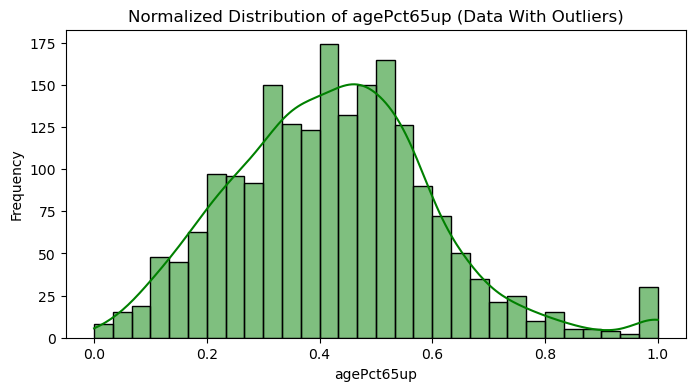


Feature: numbUrban
count    1994.000000
mean        0.064072
std         0.128256
min         0.000000
25%         0.000000
50%         0.030000
75%         0.070000
max         1.000000
Name: numbUrban, dtype: float64


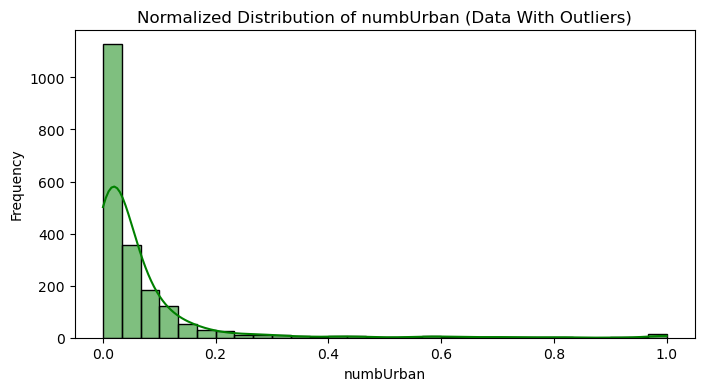


Feature: pctUrban
count    1994.000000
mean        0.696269
std         0.444811
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: pctUrban, dtype: float64


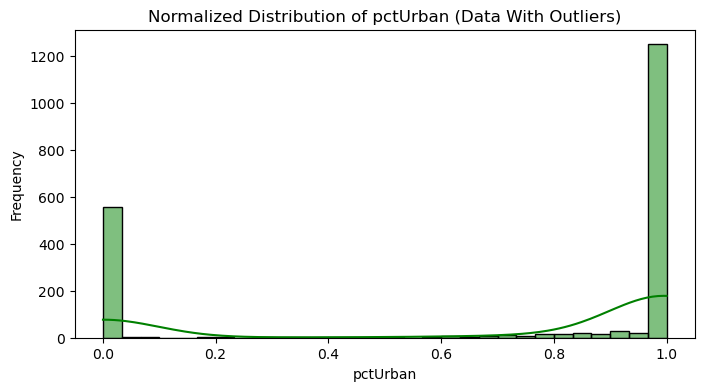


Feature: medIncome
count    1994.000000
mean        0.361123
std         0.209362
min         0.000000
25%         0.200000
50%         0.320000
75%         0.490000
max         1.000000
Name: medIncome, dtype: float64


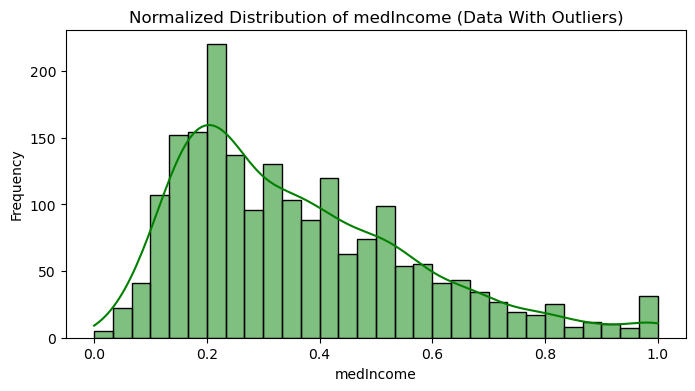


Feature: pctWWage
count    1994.000000
mean        0.558154
std         0.182913
min         0.000000
25%         0.440000
50%         0.560000
75%         0.690000
max         1.000000
Name: pctWWage, dtype: float64


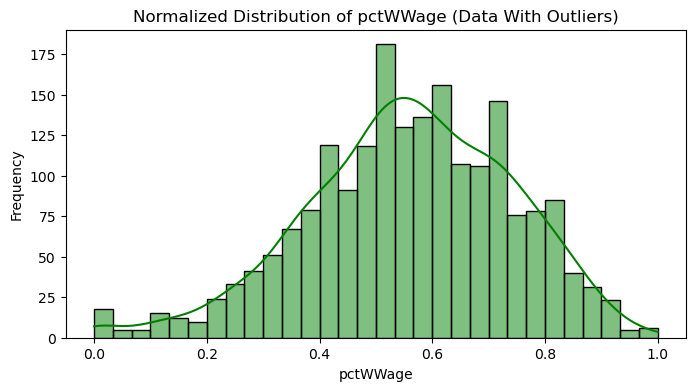


Feature: pctWFarmSelf
count    1994.000000
mean        0.291570
std         0.204108
min         0.000000
25%         0.160000
50%         0.230000
75%         0.370000
max         1.000000
Name: pctWFarmSelf, dtype: float64


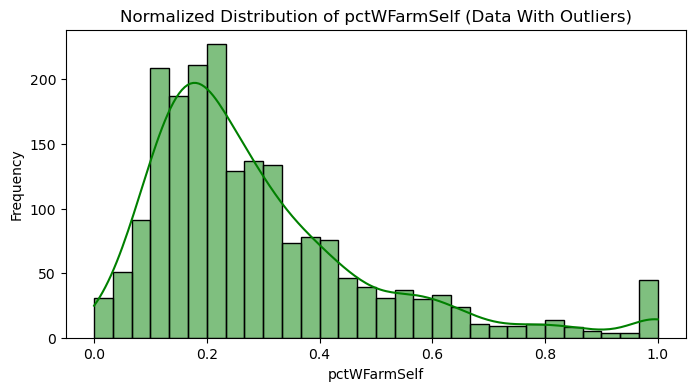


Feature: pctWInvInc
count    1994.000000
mean        0.495687
std         0.178071
min         0.000000
25%         0.370000
50%         0.480000
75%         0.620000
max         1.000000
Name: pctWInvInc, dtype: float64


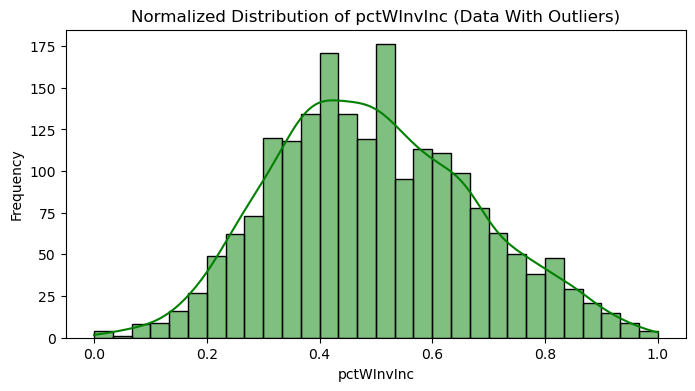


Feature: pctWSocSec
count    1994.000000
mean        0.471133
std         0.173619
min         0.000000
25%         0.350000
50%         0.475000
75%         0.580000
max         1.000000
Name: pctWSocSec, dtype: float64


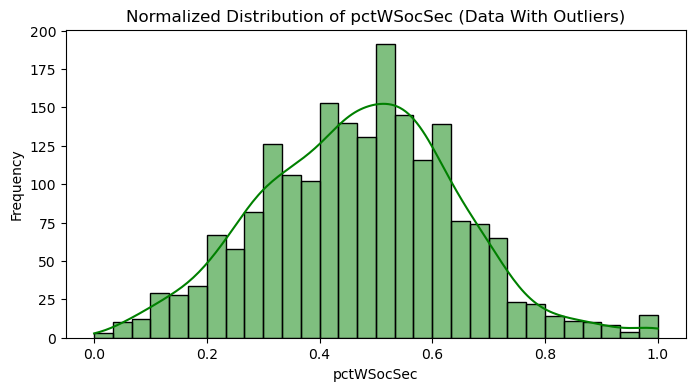


Feature: pctWPubAsst
count    1994.000000
mean        0.317778
std         0.222137
min         0.000000
25%         0.142500
50%         0.260000
75%         0.440000
max         1.000000
Name: pctWPubAsst, dtype: float64


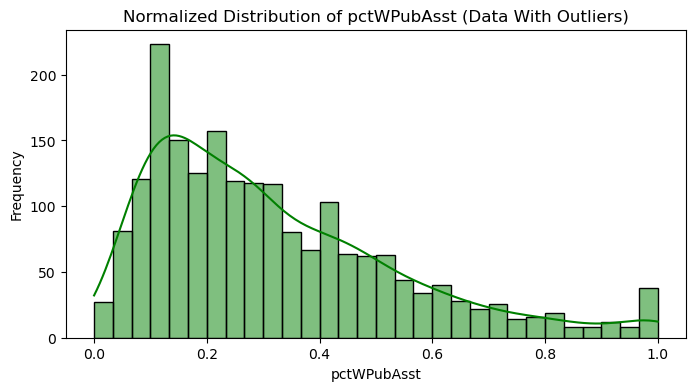


Feature: pctWRetire
count    1994.000000
mean        0.479248
std         0.167564
min         0.000000
25%         0.360000
50%         0.470000
75%         0.580000
max         1.000000
Name: pctWRetire, dtype: float64


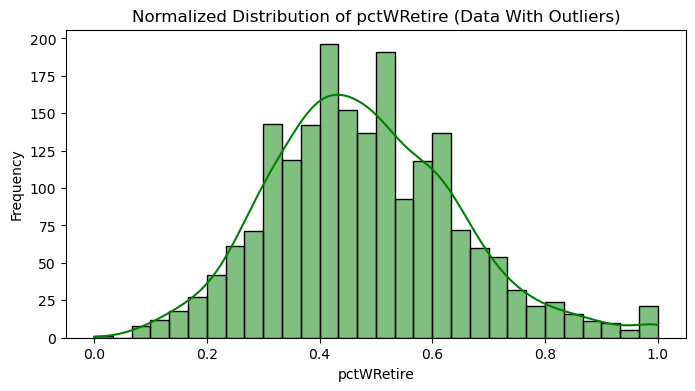


Feature: medFamInc
count    1994.000000
mean        0.375677
std         0.198257
min         0.000000
25%         0.230000
50%         0.330000
75%         0.480000
max         1.000000
Name: medFamInc, dtype: float64


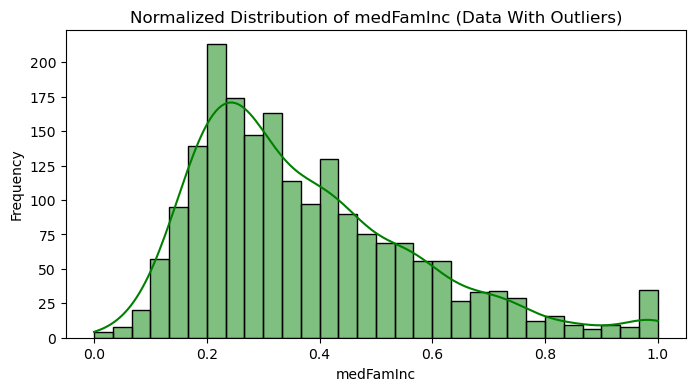


Feature: perCapInc
count    1994.000000
mean        0.350251
std         0.191109
min         0.000000
25%         0.220000
50%         0.300000
75%         0.430000
max         1.000000
Name: perCapInc, dtype: float64


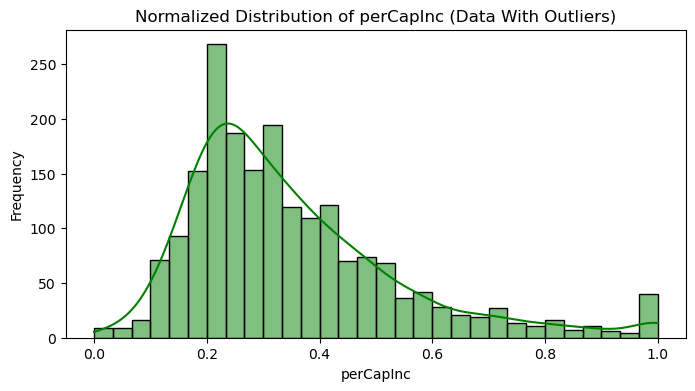


Feature: whitePerCap
count    1994.000000
mean        0.368049
std         0.186804
min         0.000000
25%         0.240000
50%         0.320000
75%         0.440000
max         1.000000
Name: whitePerCap, dtype: float64


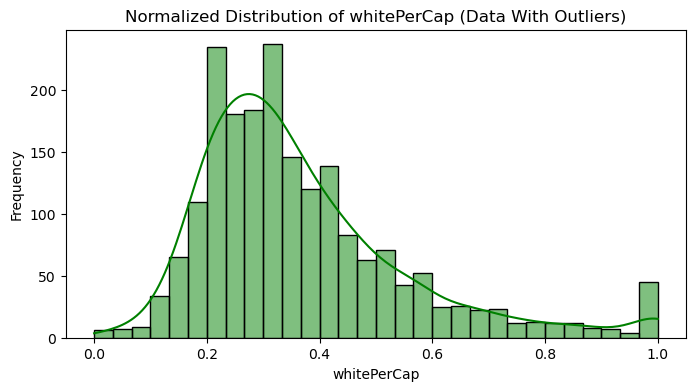


Feature: blackPerCap
count    1994.000000
mean        0.291098
std         0.171593
min         0.000000
25%         0.172500
50%         0.250000
75%         0.380000
max         1.000000
Name: blackPerCap, dtype: float64


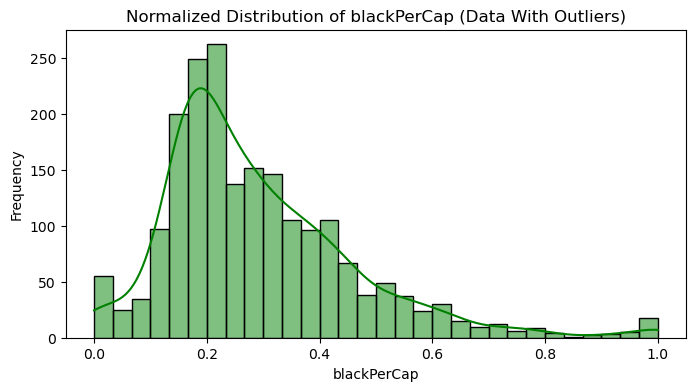


Feature: indianPerCap
count    1994.000000
mean        0.203506
std         0.164775
min         0.000000
25%         0.110000
50%         0.170000
75%         0.250000
max         1.000000
Name: indianPerCap, dtype: float64


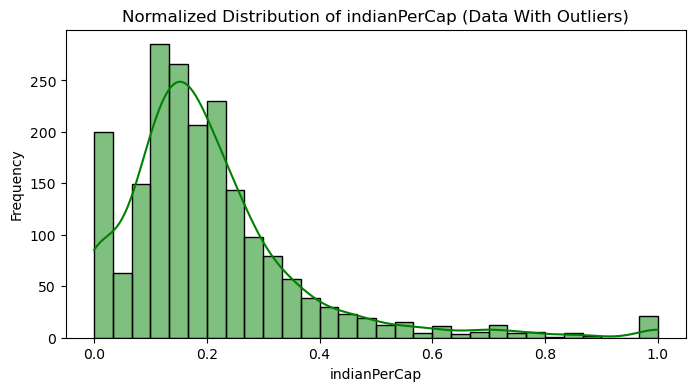


Feature: AsianPerCap
count    1994.000000
mean        0.322357
std         0.195411
min         0.000000
25%         0.190000
50%         0.280000
75%         0.400000
max         1.000000
Name: AsianPerCap, dtype: float64


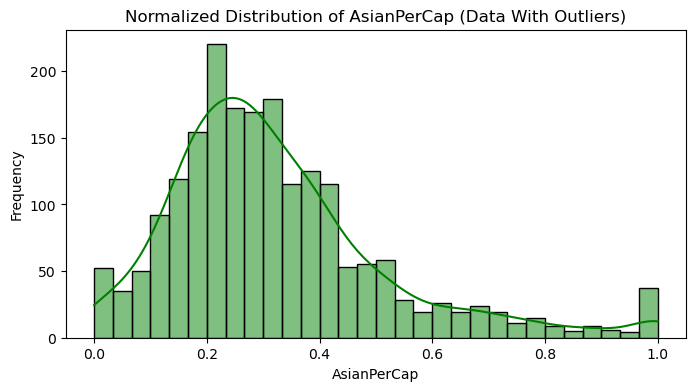


Feature: OtherPerCap
count    1994.000000
mean        0.284742
std         0.190960
min         0.000000
25%         0.170000
50%         0.250000
75%         0.360000
max         1.000000
Name: OtherPerCap, dtype: float64


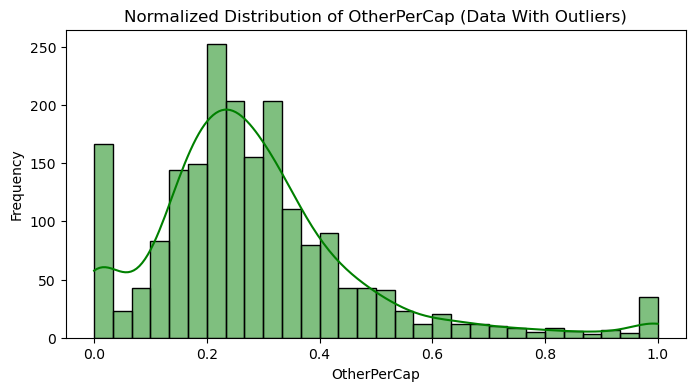


Feature: HispPerCap
count    1994.000000
mean        0.386279
std         0.183081
min         0.000000
25%         0.260000
50%         0.345000
75%         0.480000
max         1.000000
Name: HispPerCap, dtype: float64


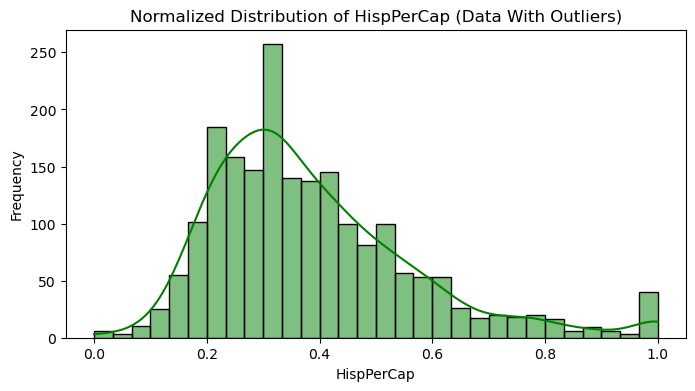


Feature: NumUnderPov
count    1994.000000
mean        0.055507
std         0.127941
min         0.000000
25%         0.010000
50%         0.020000
75%         0.050000
max         1.000000
Name: NumUnderPov, dtype: float64


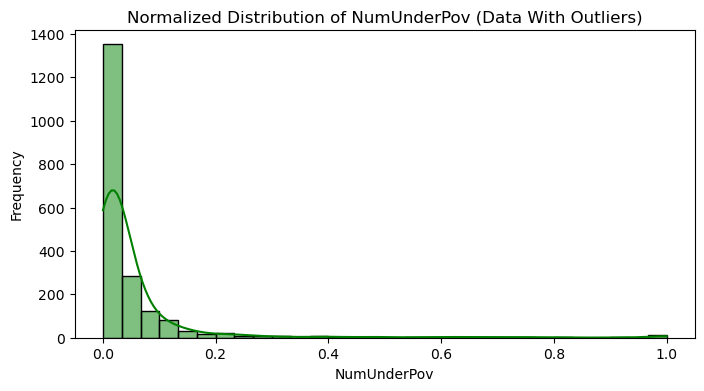


Feature: PctPopUnderPov
count    1994.000000
mean        0.303024
std         0.228474
min         0.000000
25%         0.110000
50%         0.250000
75%         0.450000
max         1.000000
Name: PctPopUnderPov, dtype: float64


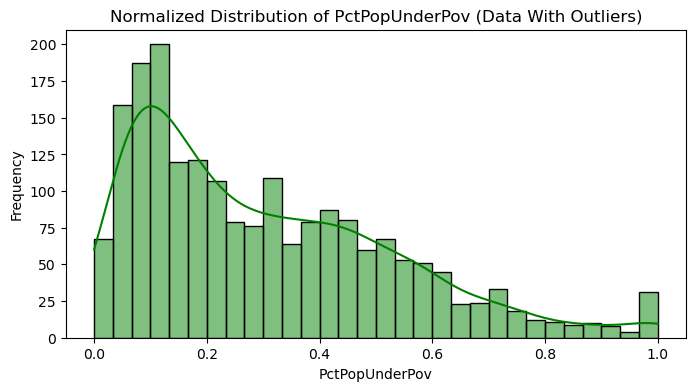


Feature: PctLess9thGrade
count    1994.000000
mean        0.315807
std         0.213360
min         0.000000
25%         0.160000
50%         0.270000
75%         0.420000
max         1.000000
Name: PctLess9thGrade, dtype: float64


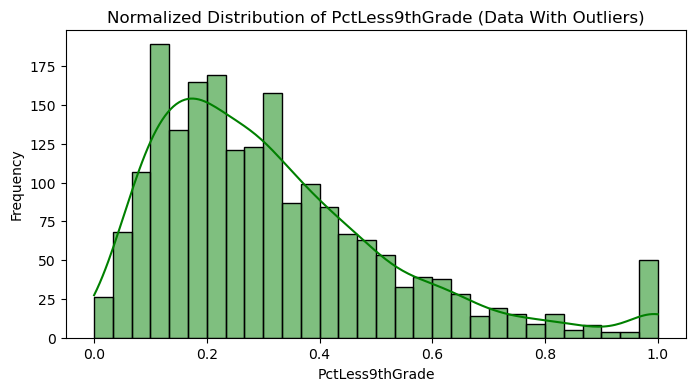


Feature: PctNotHSGrad
count    1994.000000
mean        0.383330
std         0.202508
min         0.000000
25%         0.230000
50%         0.360000
75%         0.510000
max         1.000000
Name: PctNotHSGrad, dtype: float64


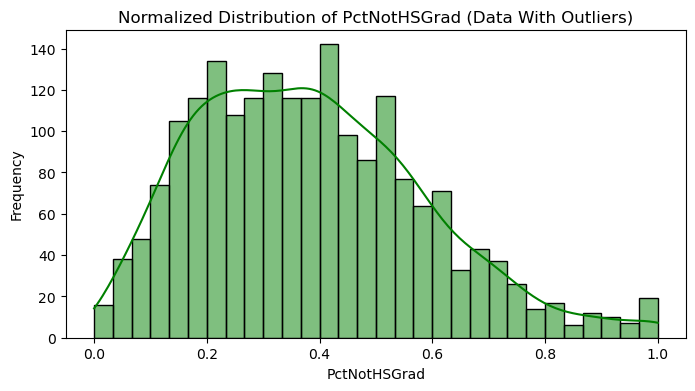


Feature: PctBSorMore
count    1994.000000
mean        0.361675
std         0.209193
min         0.000000
25%         0.210000
50%         0.310000
75%         0.460000
max         1.000000
Name: PctBSorMore, dtype: float64


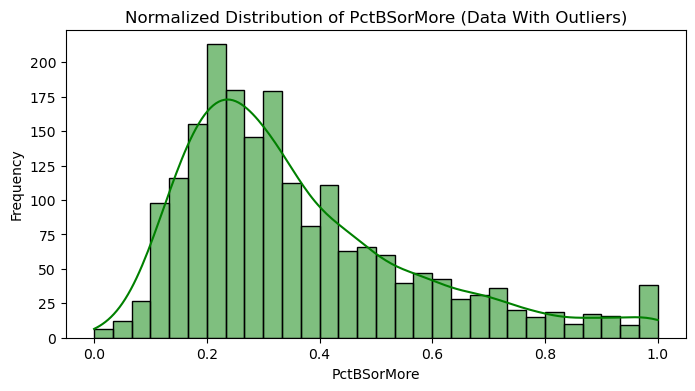


Feature: PctUnemployed
count    1994.000000
mean        0.363531
std         0.202171
min         0.000000
25%         0.220000
50%         0.320000
75%         0.480000
max         1.000000
Name: PctUnemployed, dtype: float64


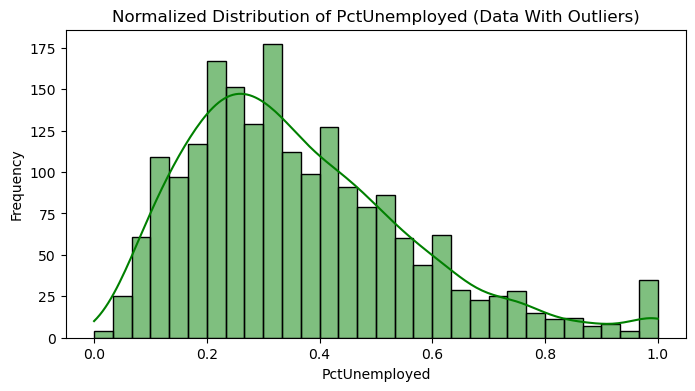


Feature: PctEmploy
count    1994.000000
mean        0.501073
std         0.174036
min         0.000000
25%         0.380000
50%         0.510000
75%         0.627500
max         1.000000
Name: PctEmploy, dtype: float64


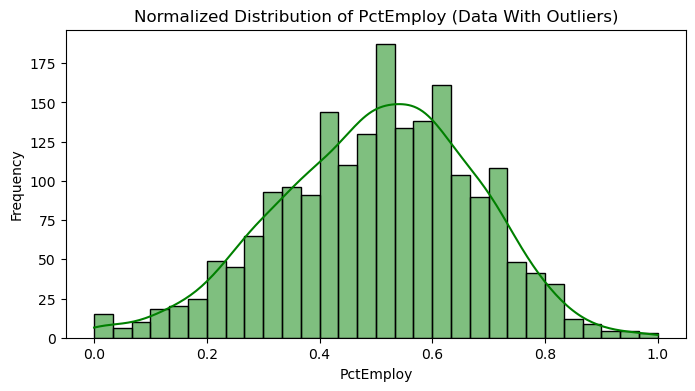


Feature: PctEmplManu
count    1994.000000
mean        0.396384
std         0.202386
min         0.000000
25%         0.250000
50%         0.370000
75%         0.520000
max         1.000000
Name: PctEmplManu, dtype: float64


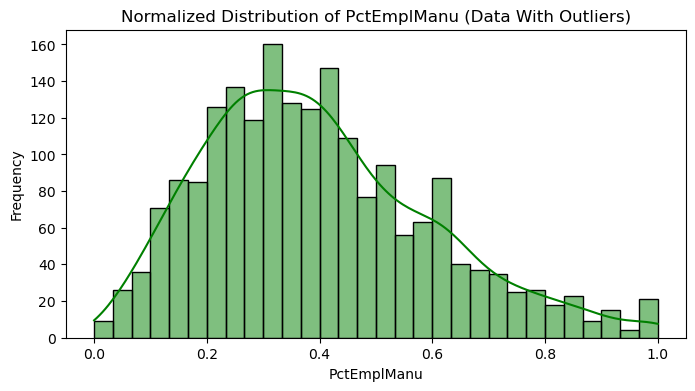


Feature: PctEmplProfServ
count    1994.000000
mean        0.440597
std         0.175457
min         0.000000
25%         0.320000
50%         0.410000
75%         0.530000
max         1.000000
Name: PctEmplProfServ, dtype: float64


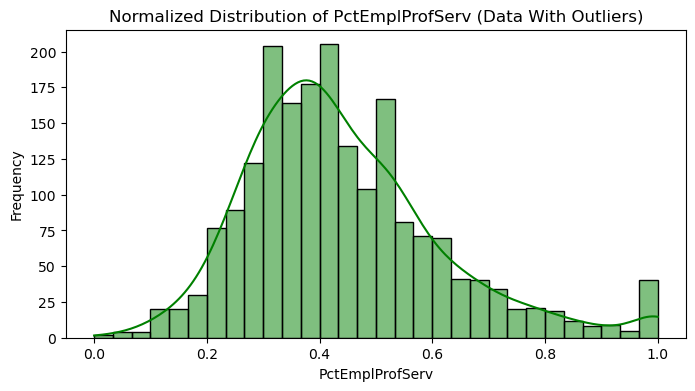


Feature: PctOccupManu
count    1994.000000
mean        0.391224
std         0.198922
min         0.000000
25%         0.240000
50%         0.370000
75%         0.510000
max         1.000000
Name: PctOccupManu, dtype: float64


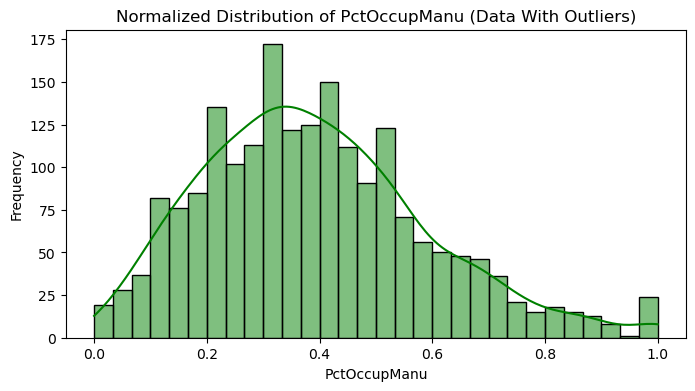


Feature: PctOccupMgmtProf
count    1994.000000
mean        0.441339
std         0.186292
min         0.000000
25%         0.310000
50%         0.400000
75%         0.540000
max         1.000000
Name: PctOccupMgmtProf, dtype: float64


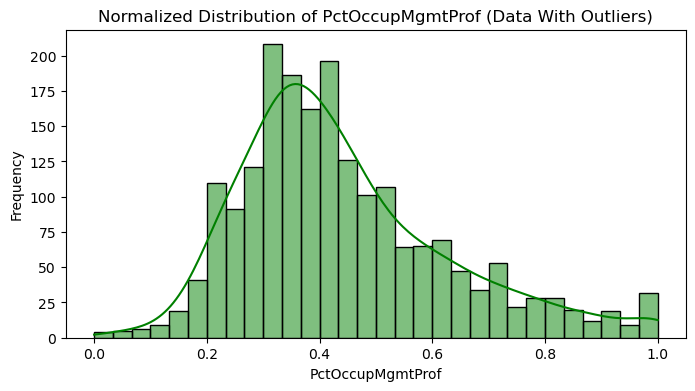


Feature: MalePctDivorce
count    1994.000000
mean        0.461244
std         0.182460
min         0.000000
25%         0.330000
50%         0.470000
75%         0.590000
max         1.000000
Name: MalePctDivorce, dtype: float64


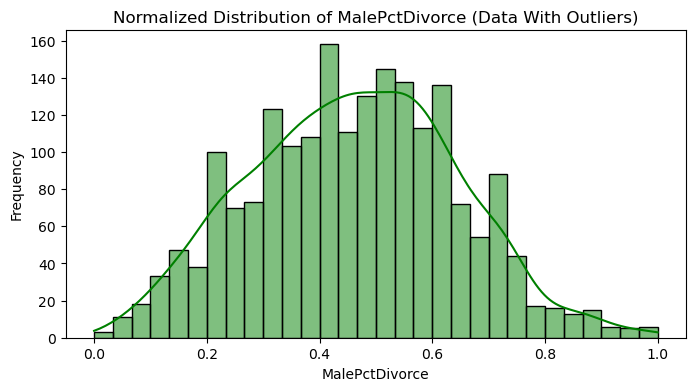


Feature: MalePctNevMarr
count    1994.000000
mean        0.434453
std         0.175437
min         0.000000
25%         0.310000
50%         0.400000
75%         0.500000
max         1.000000
Name: MalePctNevMarr, dtype: float64


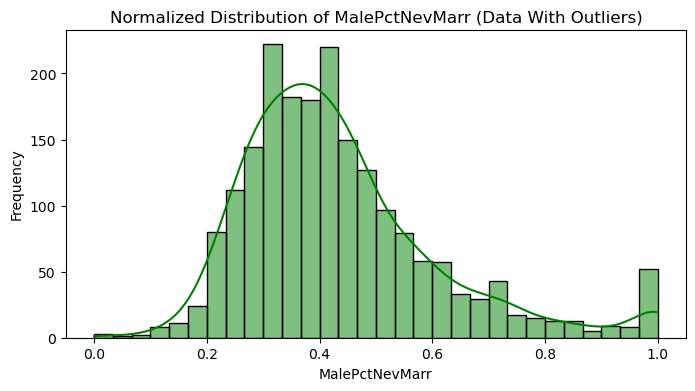


Feature: FemalePctDiv
count    1994.000000
mean        0.487568
std         0.175170
min         0.000000
25%         0.360000
50%         0.500000
75%         0.620000
max         1.000000
Name: FemalePctDiv, dtype: float64


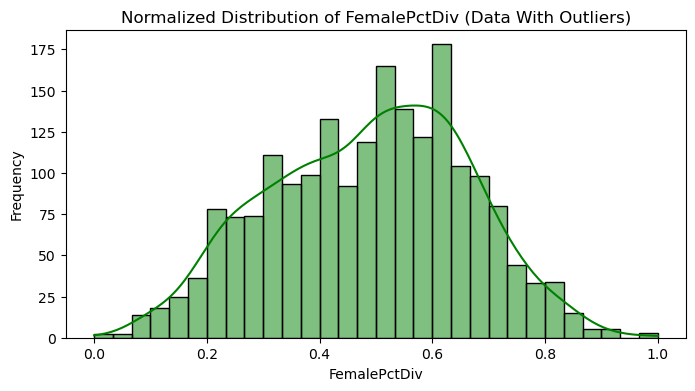


Feature: TotalPctDiv
count    1994.000000
mean        0.494273
std         0.183607
min         0.000000
25%         0.360000
50%         0.500000
75%         0.630000
max         1.000000
Name: TotalPctDiv, dtype: float64


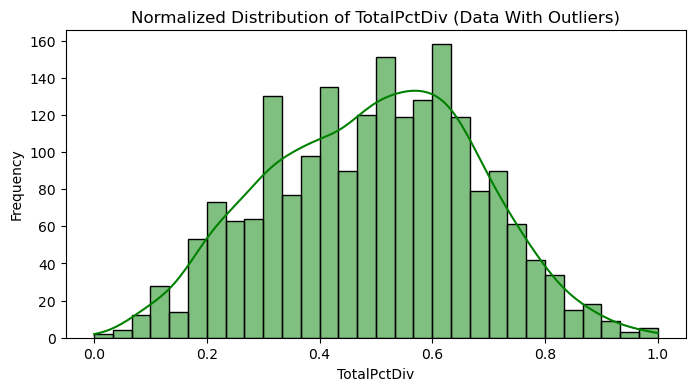


Feature: PersPerFam
count    1994.000000
mean        0.487748
std         0.154594
min         0.000000
25%         0.400000
50%         0.470000
75%         0.560000
max         1.000000
Name: PersPerFam, dtype: float64


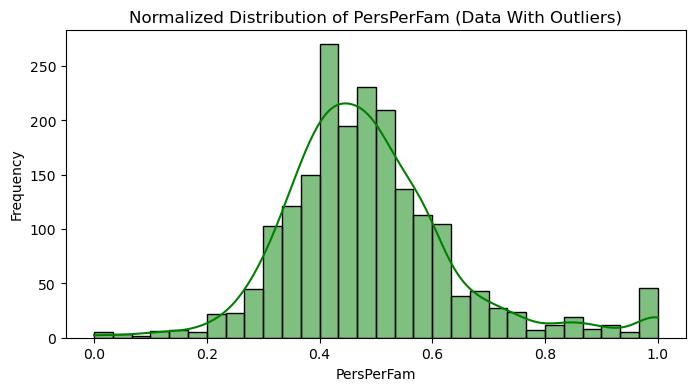


Feature: PctFam2Par
count    1994.000000
mean        0.610918
std         0.201976
min         0.000000
25%         0.490000
50%         0.630000
75%         0.760000
max         1.000000
Name: PctFam2Par, dtype: float64


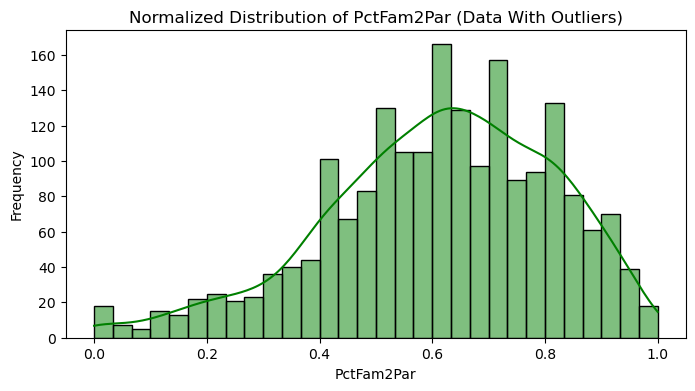


Feature: PctKids2Par
count    1994.000000
mean        0.620657
std         0.206353
min         0.000000
25%         0.490000
50%         0.640000
75%         0.780000
max         1.000000
Name: PctKids2Par, dtype: float64


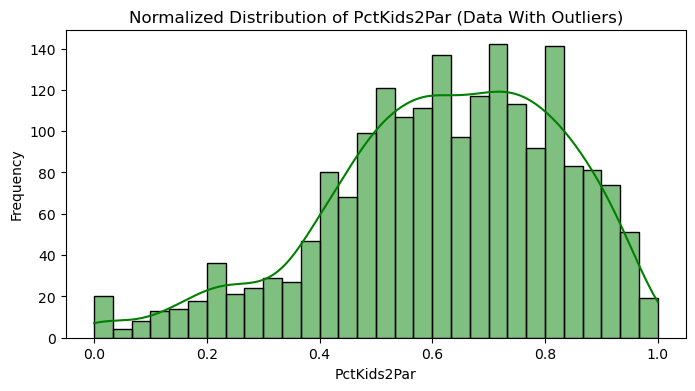


Feature: PctYoungKids2Par
count    1994.000000
mean        0.664032
std         0.218749
min         0.000000
25%         0.530000
50%         0.700000
75%         0.840000
max         1.000000
Name: PctYoungKids2Par, dtype: float64


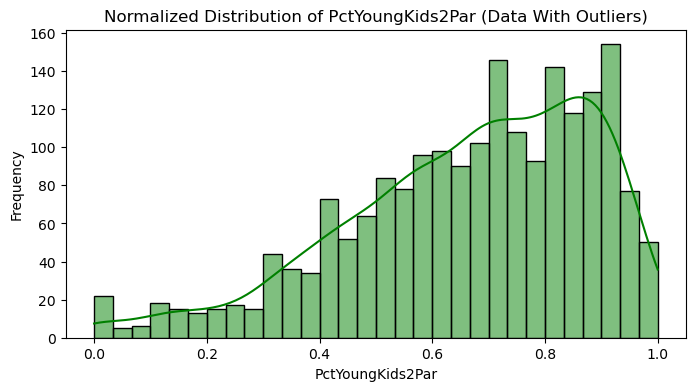


Feature: PctTeen2Par
count    1994.000000
mean        0.582884
std         0.191507
min         0.000000
25%         0.480000
50%         0.610000
75%         0.720000
max         1.000000
Name: PctTeen2Par, dtype: float64


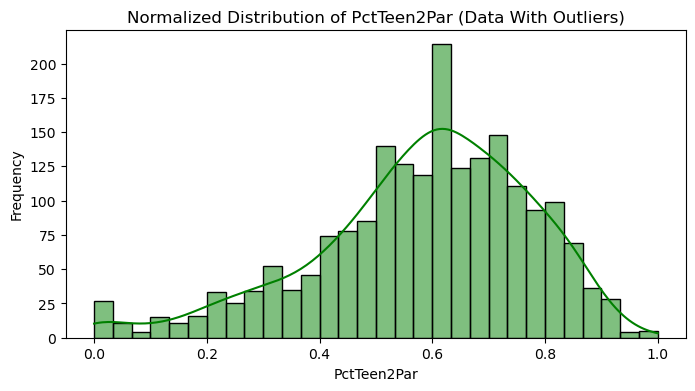


Feature: PctWorkMomYoungKids
count    1994.000000
mean        0.501449
std         0.168612
min         0.000000
25%         0.390000
50%         0.510000
75%         0.620000
max         1.000000
Name: PctWorkMomYoungKids, dtype: float64


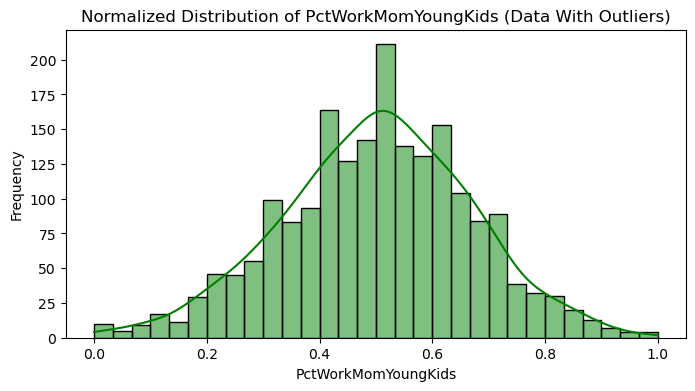


Feature: PctWorkMom
count    1994.000000
mean        0.526690
std         0.175241
min         0.000000
25%         0.420000
50%         0.540000
75%         0.650000
max         1.000000
Name: PctWorkMom, dtype: float64


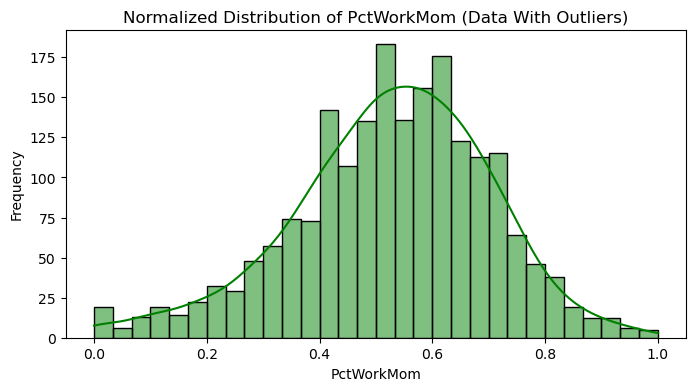


Feature: NumIlleg
count    1994.000000
mean        0.036294
std         0.108671
min         0.000000
25%         0.000000
50%         0.010000
75%         0.020000
max         1.000000
Name: NumIlleg, dtype: float64


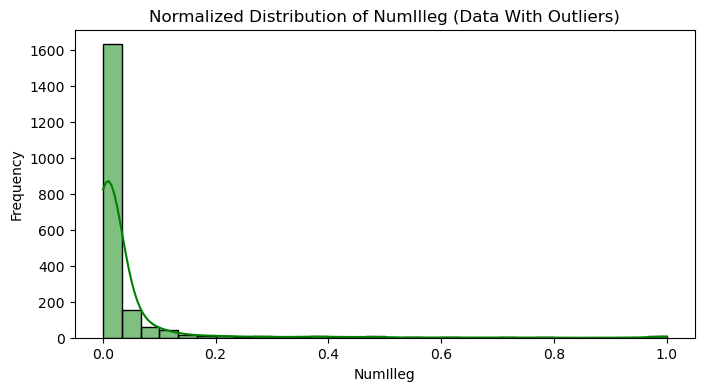


Feature: PctIlleg
count    1994.000000
mean        0.249995
std         0.229946
min         0.000000
25%         0.090000
50%         0.170000
75%         0.320000
max         1.000000
Name: PctIlleg, dtype: float64


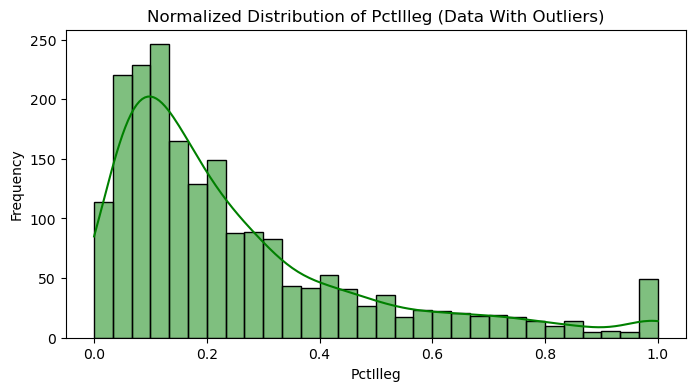


Feature: NumImmig
count    1994.000000
mean        0.030060
std         0.087189
min         0.000000
25%         0.000000
50%         0.010000
75%         0.020000
max         1.000000
Name: NumImmig, dtype: float64


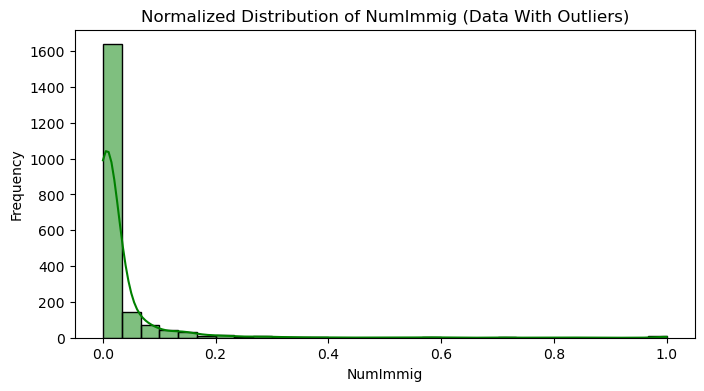


Feature: PctImmigRecent
count    1994.000000
mean        0.320211
std         0.219088
min         0.000000
25%         0.160000
50%         0.290000
75%         0.430000
max         1.000000
Name: PctImmigRecent, dtype: float64


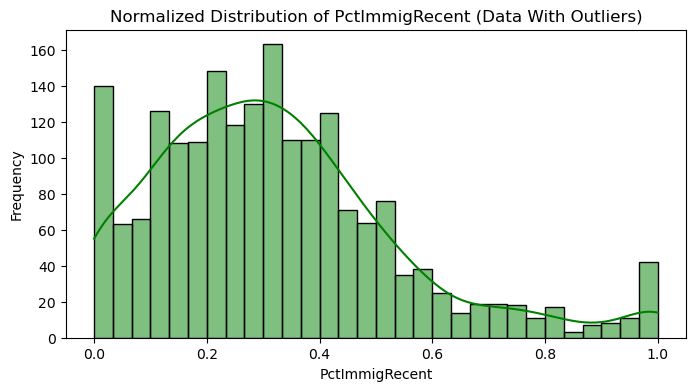


Feature: PctImmigRec5
count    1994.000000
mean        0.360622
std         0.210924
min         0.000000
25%         0.200000
50%         0.340000
75%         0.480000
max         1.000000
Name: PctImmigRec5, dtype: float64


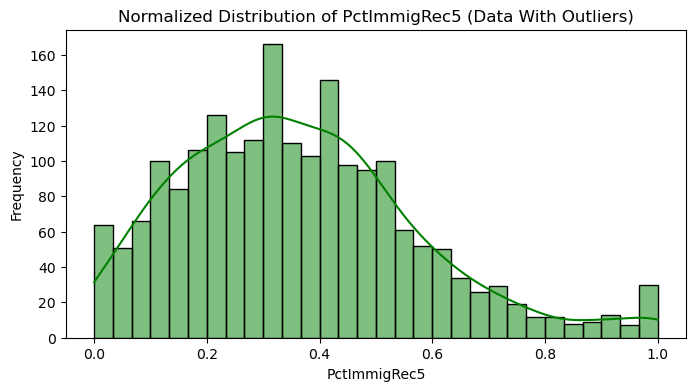


Feature: PctImmigRec8
count    1994.000000
mean        0.399077
std         0.201498
min         0.000000
25%         0.250000
50%         0.390000
75%         0.530000
max         1.000000
Name: PctImmigRec8, dtype: float64


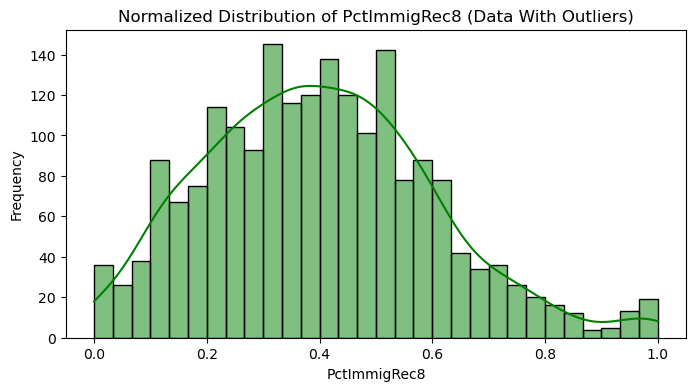


Feature: PctImmigRec10
count    1994.000000
mean        0.427879
std         0.194970
min         0.000000
25%         0.280000
50%         0.430000
75%         0.560000
max         1.000000
Name: PctImmigRec10, dtype: float64


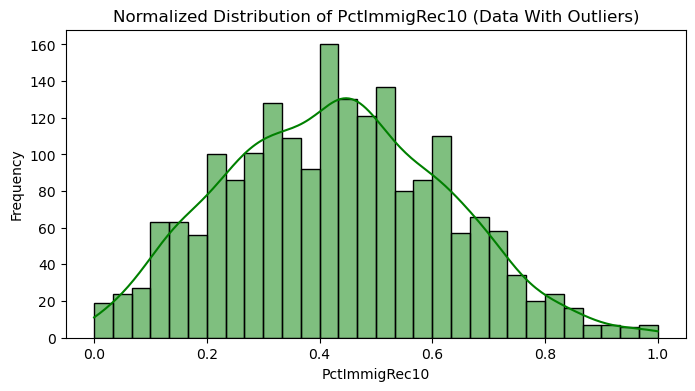


Feature: PctRecentImmig
count    1994.000000
mean        0.181364
std         0.235792
min         0.000000
25%         0.030000
50%         0.090000
75%         0.230000
max         1.000000
Name: PctRecentImmig, dtype: float64


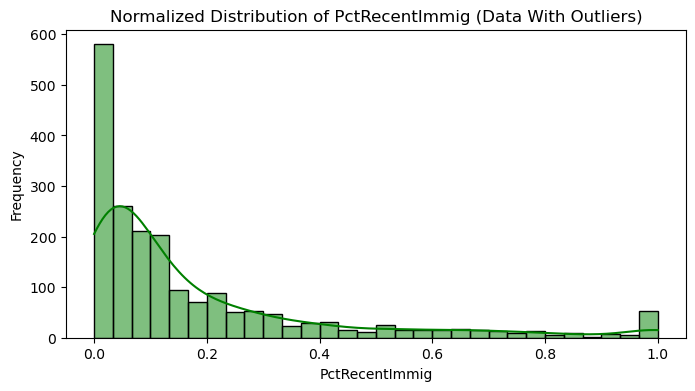


Feature: PctRecImmig5
count    1994.000000
mean        0.182126
std         0.236333
min         0.000000
25%         0.030000
50%         0.080000
75%         0.230000
max         1.000000
Name: PctRecImmig5, dtype: float64


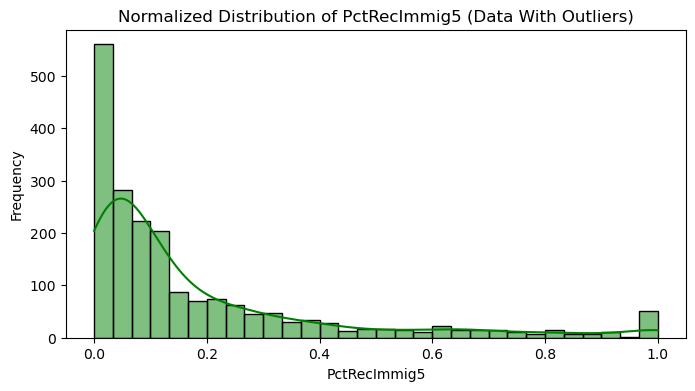


Feature: PctRecImmig8
count    1994.000000
mean        0.184774
std         0.236739
min         0.000000
25%         0.030000
50%         0.090000
75%         0.230000
max         1.000000
Name: PctRecImmig8, dtype: float64


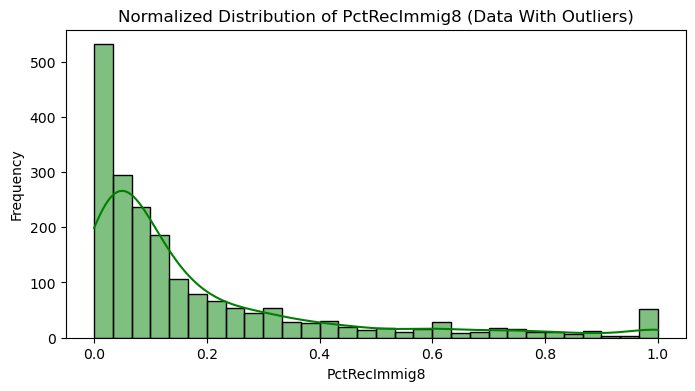


Feature: PctRecImmig10
count    1994.000000
mean        0.182879
std         0.234822
min         0.000000
25%         0.030000
50%         0.090000
75%         0.230000
max         1.000000
Name: PctRecImmig10, dtype: float64


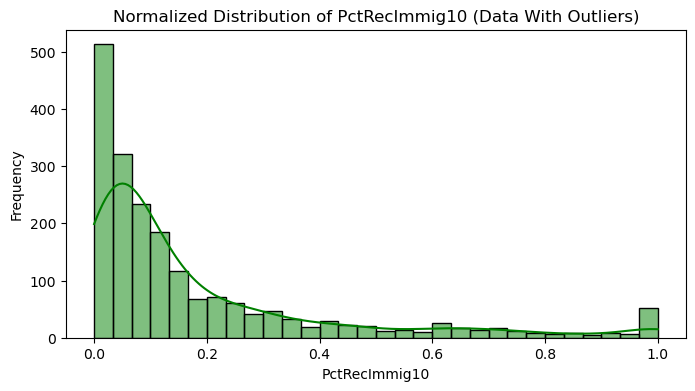


Feature: PctSpeakEnglOnly
count    1994.000000
mean        0.785903
std         0.226869
min         0.000000
25%         0.730000
50%         0.870000
75%         0.940000
max         1.000000
Name: PctSpeakEnglOnly, dtype: float64


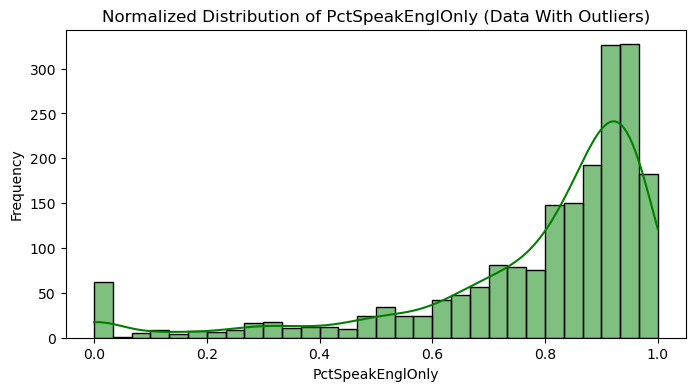


Feature: PctNotSpeakEnglWell
count    1994.000000
mean        0.150587
std         0.219716
min         0.000000
25%         0.030000
50%         0.060000
75%         0.160000
max         1.000000
Name: PctNotSpeakEnglWell, dtype: float64


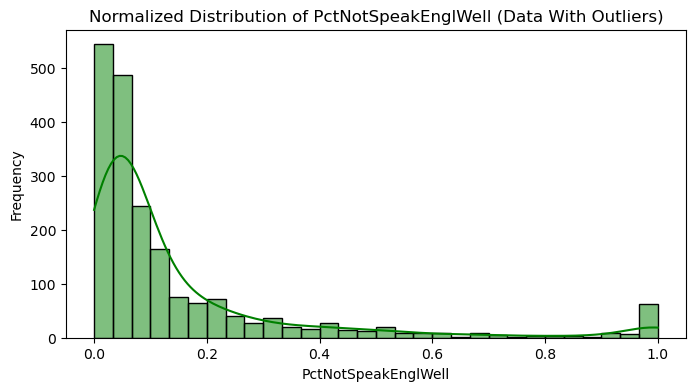


Feature: PctLargHouseFam
count    1994.000000
mean        0.267608
std         0.196567
min         0.000000
25%         0.150000
50%         0.200000
75%         0.310000
max         1.000000
Name: PctLargHouseFam, dtype: float64


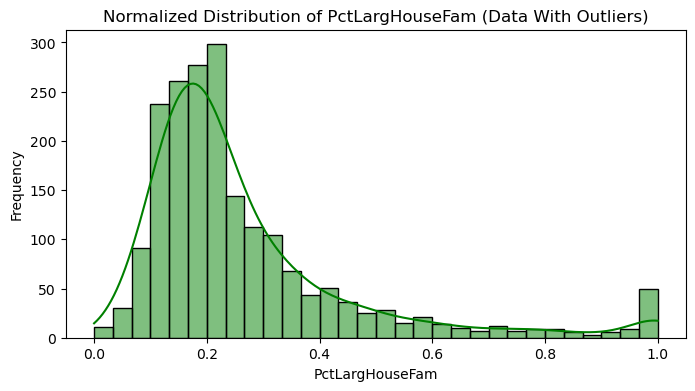


Feature: PctLargHouseOccup
count    1994.000000
mean        0.251891
std         0.190709
min         0.000000
25%         0.140000
50%         0.190000
75%         0.290000
max         1.000000
Name: PctLargHouseOccup, dtype: float64


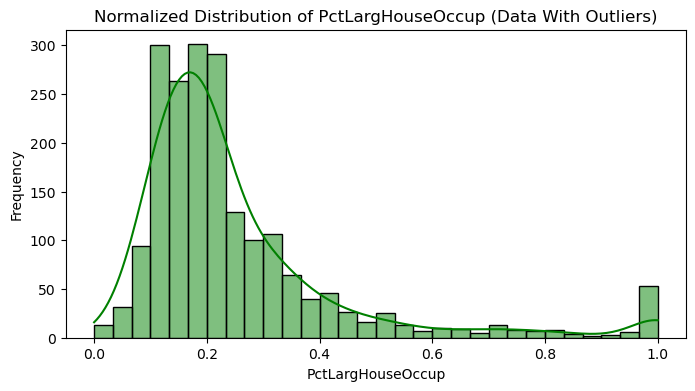


Feature: PersPerOccupHous
count    1994.000000
mean        0.462101
std         0.169551
min         0.000000
25%         0.340000
50%         0.440000
75%         0.550000
max         1.000000
Name: PersPerOccupHous, dtype: float64


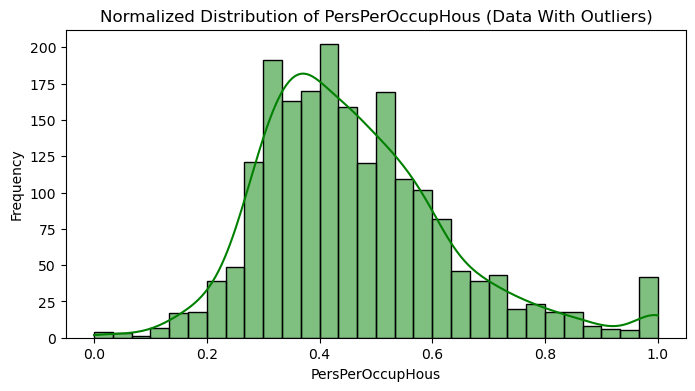


Feature: PersPerOwnOccHous
count    1994.000000
mean        0.494428
std         0.157924
min         0.000000
25%         0.390000
50%         0.480000
75%         0.580000
max         1.000000
Name: PersPerOwnOccHous, dtype: float64


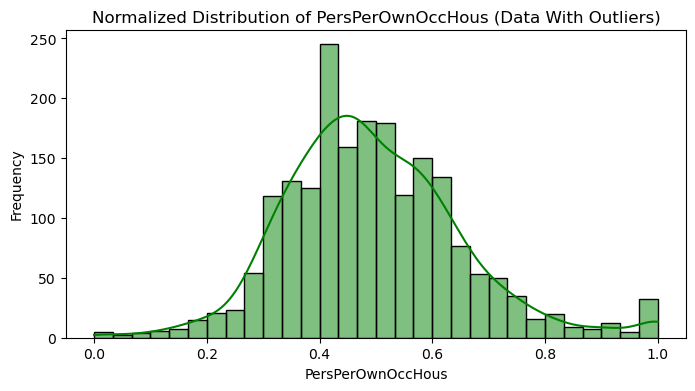


Feature: PersPerRentOccHous
count    1994.000000
mean        0.404097
std         0.189301
min         0.000000
25%         0.270000
50%         0.360000
75%         0.490000
max         1.000000
Name: PersPerRentOccHous, dtype: float64


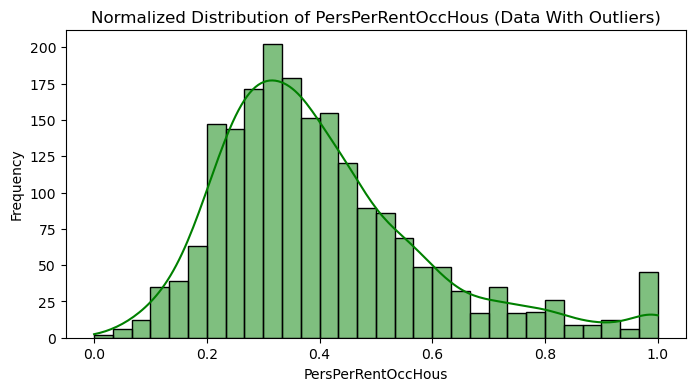


Feature: PctPersOwnOccup
count    1994.000000
mean        0.562598
std         0.197087
min         0.000000
25%         0.440000
50%         0.560000
75%         0.700000
max         1.000000
Name: PctPersOwnOccup, dtype: float64


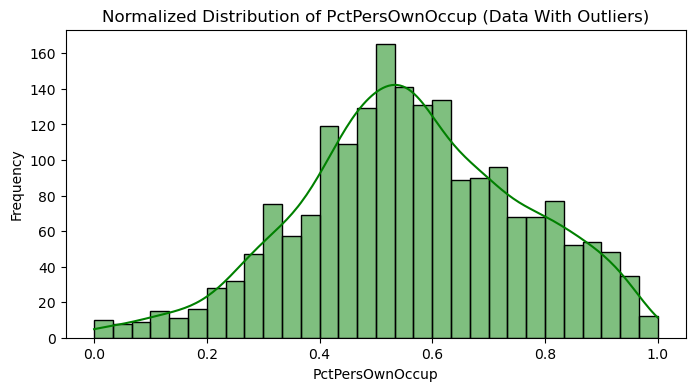


Feature: PctPersDenseHous
count    1994.000000
mean        0.186264
std         0.209956
min         0.000000
25%         0.060000
50%         0.110000
75%         0.220000
max         1.000000
Name: PctPersDenseHous, dtype: float64


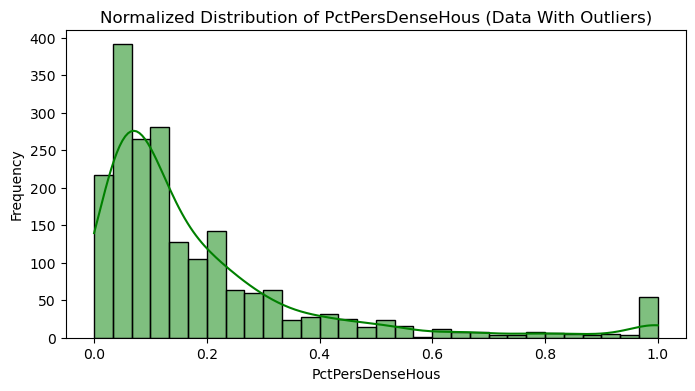


Feature: PctHousLess3BR
count    1994.000000
mean        0.495186
std         0.172508
min         0.000000
25%         0.400000
50%         0.510000
75%         0.600000
max         1.000000
Name: PctHousLess3BR, dtype: float64


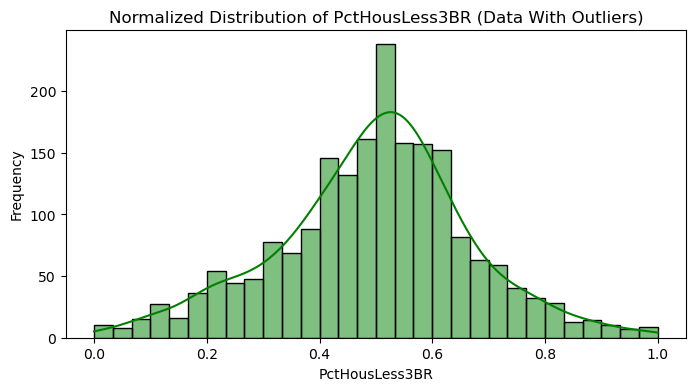


Feature: MedNumBR
count    1994.000000
mean        0.314694
std         0.255182
min         0.000000
25%         0.000000
50%         0.500000
75%         0.500000
max         1.000000
Name: MedNumBR, dtype: float64


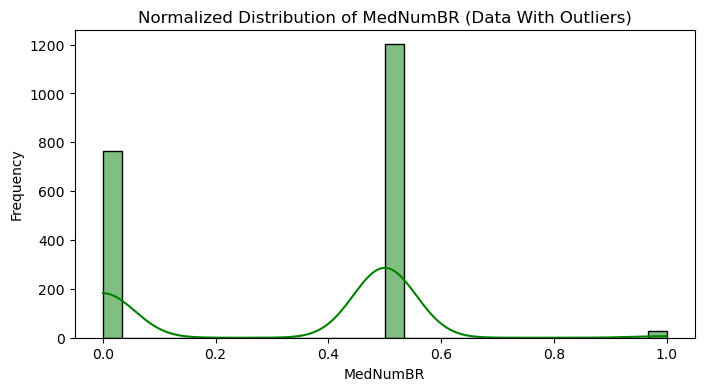


Feature: HousVacant
count    1994.000000
mean        0.076815
std         0.150465
min         0.000000
25%         0.010000
50%         0.030000
75%         0.070000
max         1.000000
Name: HousVacant, dtype: float64


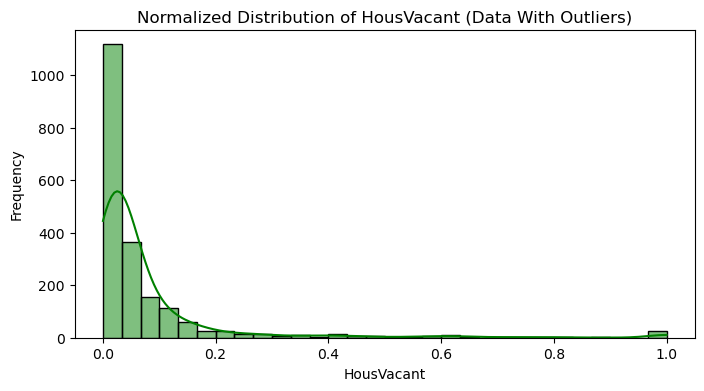


Feature: PctHousOccup
count    1994.000000
mean        0.719549
std         0.194024
min         0.000000
25%         0.630000
50%         0.770000
75%         0.860000
max         1.000000
Name: PctHousOccup, dtype: float64


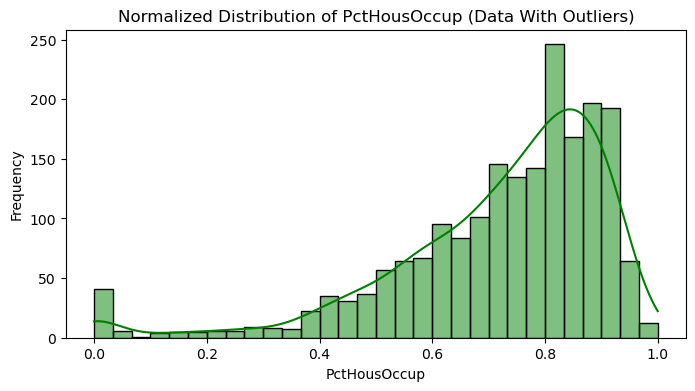


Feature: PctHousOwnOcc
count    1994.000000
mean        0.548686
std         0.185204
min         0.000000
25%         0.430000
50%         0.540000
75%         0.670000
max         1.000000
Name: PctHousOwnOcc, dtype: float64


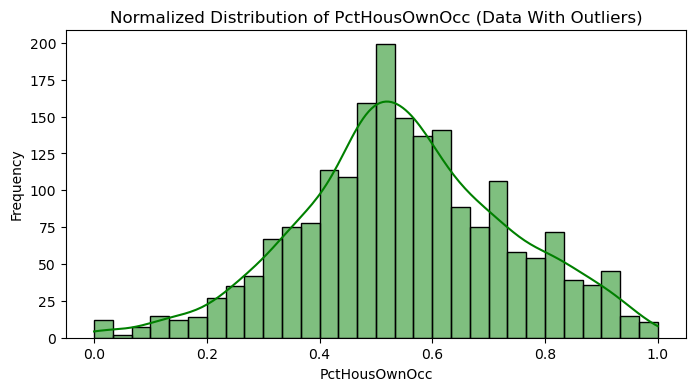


Feature: PctVacantBoarded
count    1994.000000
mean        0.204529
std         0.217770
min         0.000000
25%         0.060000
50%         0.130000
75%         0.270000
max         1.000000
Name: PctVacantBoarded, dtype: float64


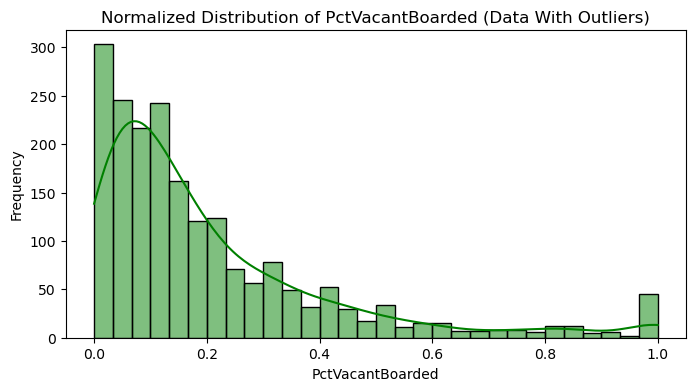


Feature: PctVacMore6Mos
count    1994.000000
mean        0.433335
std         0.188986
min         0.000000
25%         0.290000
50%         0.420000
75%         0.560000
max         1.000000
Name: PctVacMore6Mos, dtype: float64


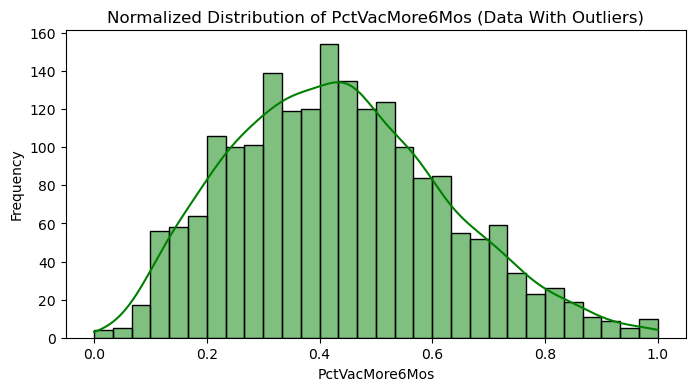


Feature: MedYrHousBuilt
count    1994.000000
mean        0.494178
std         0.232467
min         0.000000
25%         0.350000
50%         0.520000
75%         0.670000
max         1.000000
Name: MedYrHousBuilt, dtype: float64


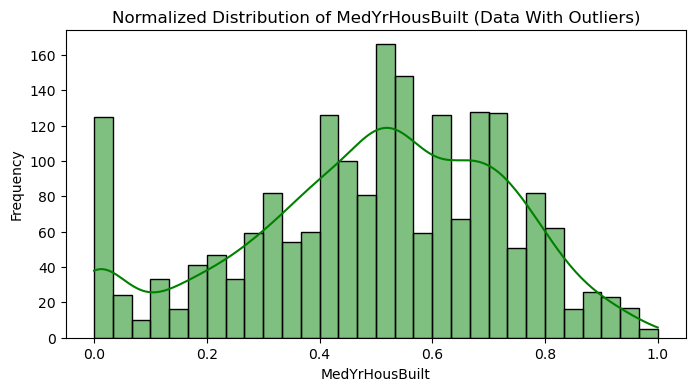


Feature: PctHousNoPhone
count    1994.000000
mean        0.264478
std         0.242847
min         0.000000
25%         0.060000
50%         0.185000
75%         0.420000
max         1.000000
Name: PctHousNoPhone, dtype: float64


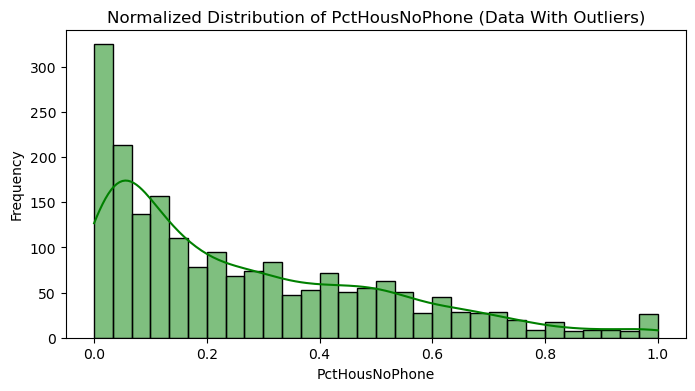


Feature: PctWOFullPlumb
count    1994.000000
mean        0.243059
std         0.206295
min         0.000000
25%         0.100000
50%         0.190000
75%         0.330000
max         1.000000
Name: PctWOFullPlumb, dtype: float64


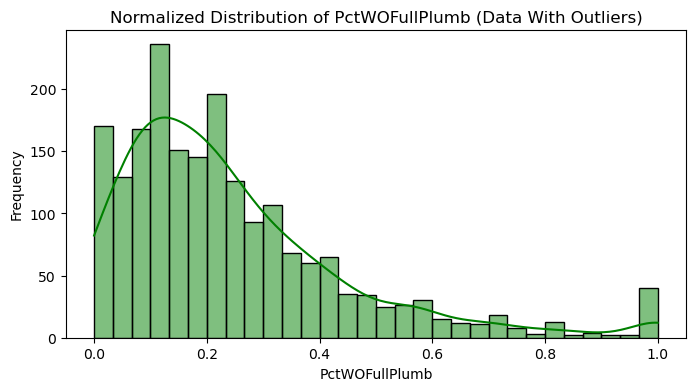


Feature: OwnOccLowQuart
count    1994.000000
mean        0.264689
std         0.224425
min         0.000000
25%         0.090000
50%         0.180000
75%         0.400000
max         1.000000
Name: OwnOccLowQuart, dtype: float64


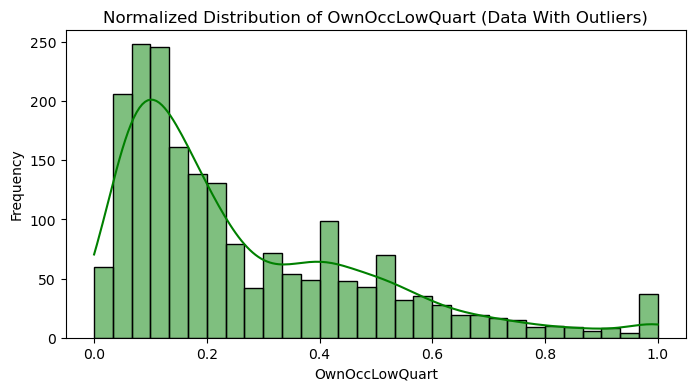


Feature: OwnOccMedVal
count    1994.000000
mean        0.263490
std         0.231542
min         0.000000
25%         0.090000
50%         0.170000
75%         0.390000
max         1.000000
Name: OwnOccMedVal, dtype: float64


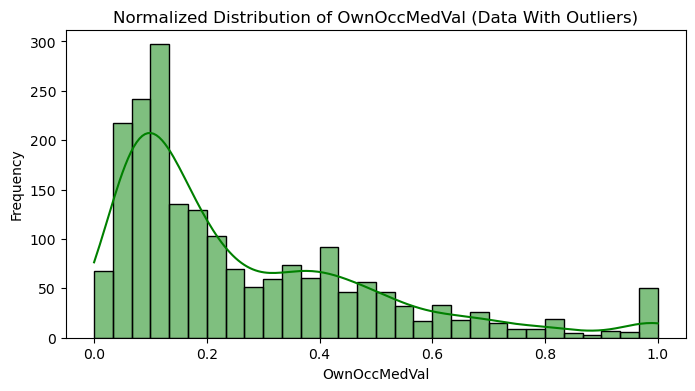


Feature: OwnOccHiQuart
count    1994.000000
mean        0.268942
std         0.235252
min         0.000000
25%         0.090000
50%         0.180000
75%         0.380000
max         1.000000
Name: OwnOccHiQuart, dtype: float64


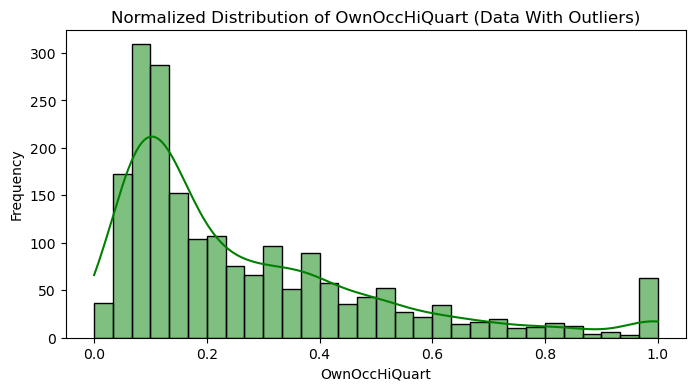


Feature: RentLowQ
count    1994.000000
mean        0.346379
std         0.219323
min         0.000000
25%         0.170000
50%         0.310000
75%         0.490000
max         1.000000
Name: RentLowQ, dtype: float64


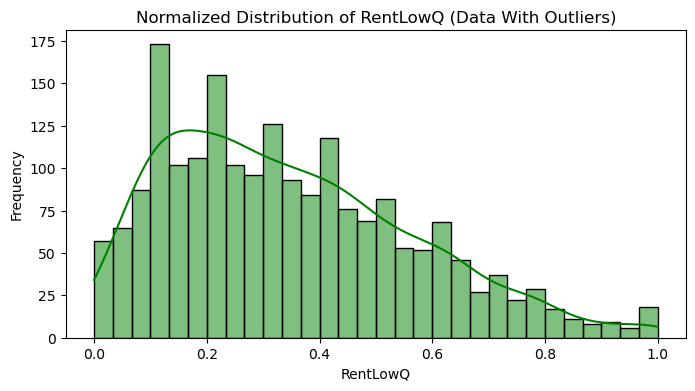


Feature: RentMedian
count    1994.000000
mean        0.372457
std         0.209278
min         0.000000
25%         0.200000
50%         0.330000
75%         0.520000
max         1.000000
Name: RentMedian, dtype: float64


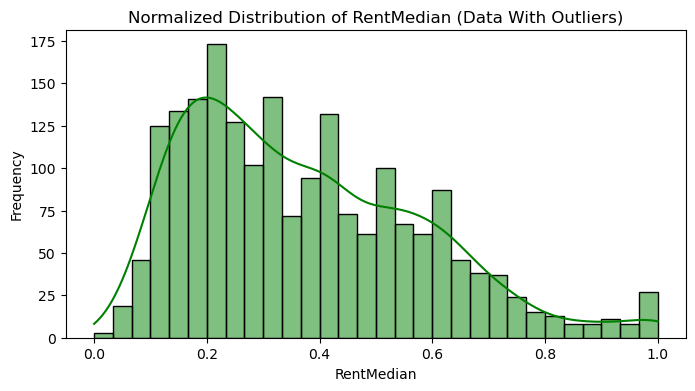


Feature: RentHighQ
count    1994.000000
mean        0.422964
std         0.248286
min         0.000000
25%         0.220000
50%         0.370000
75%         0.590000
max         1.000000
Name: RentHighQ, dtype: float64


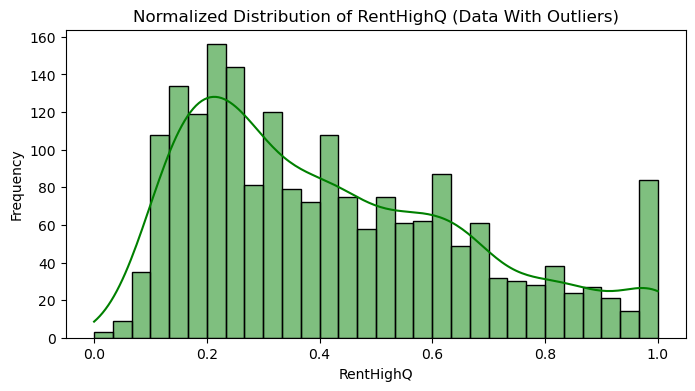


Feature: MedRent
count    1994.000000
mean        0.384102
std         0.213404
min         0.000000
25%         0.210000
50%         0.340000
75%         0.530000
max         1.000000
Name: MedRent, dtype: float64


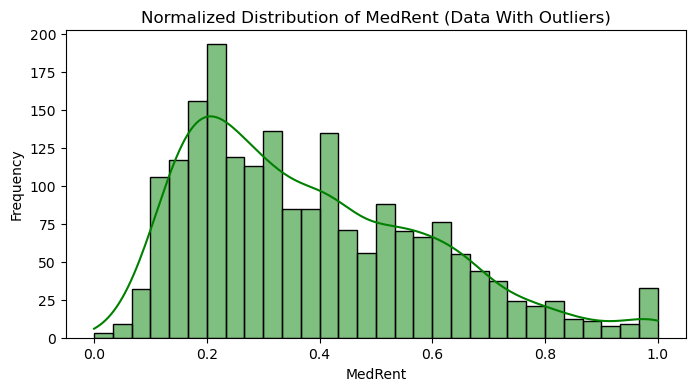


Feature: MedRentPctHousInc
count    1994.000000
mean        0.490125
std         0.169500
min         0.000000
25%         0.370000
50%         0.480000
75%         0.590000
max         1.000000
Name: MedRentPctHousInc, dtype: float64


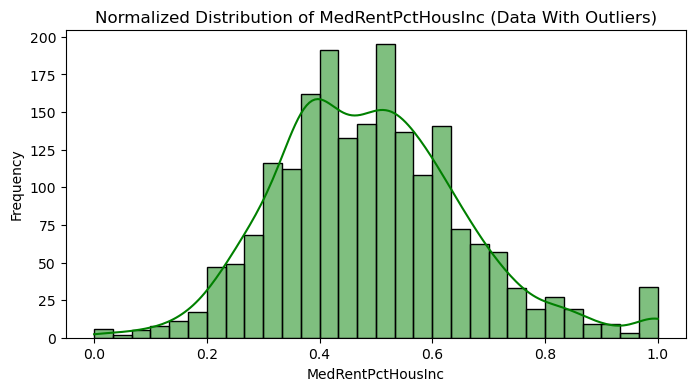


Feature: MedOwnCostPctInc
count    1994.000000
mean        0.449754
std         0.187274
min         0.000000
25%         0.320000
50%         0.450000
75%         0.580000
max         1.000000
Name: MedOwnCostPctInc, dtype: float64


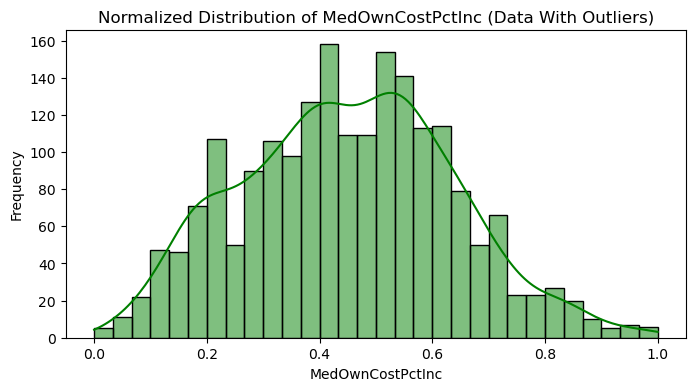


Feature: MedOwnCostPctIncNoMtg
count    1994.000000
mean        0.403816
std         0.192593
min         0.000000
25%         0.250000
50%         0.370000
75%         0.510000
max         1.000000
Name: MedOwnCostPctIncNoMtg, dtype: float64


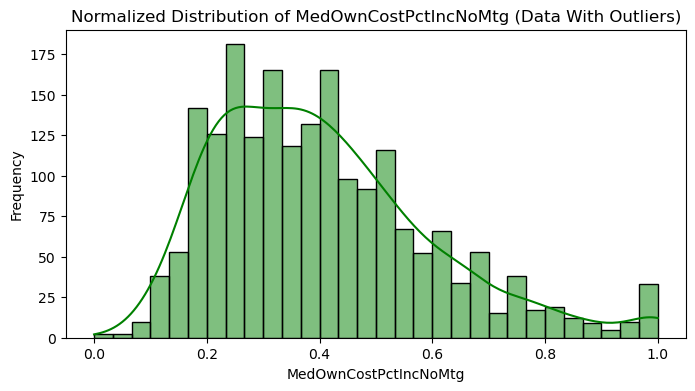


Feature: NumInShelters
count    1994.000000
mean        0.029438
std         0.102607
min         0.000000
25%         0.000000
50%         0.000000
75%         0.010000
max         1.000000
Name: NumInShelters, dtype: float64


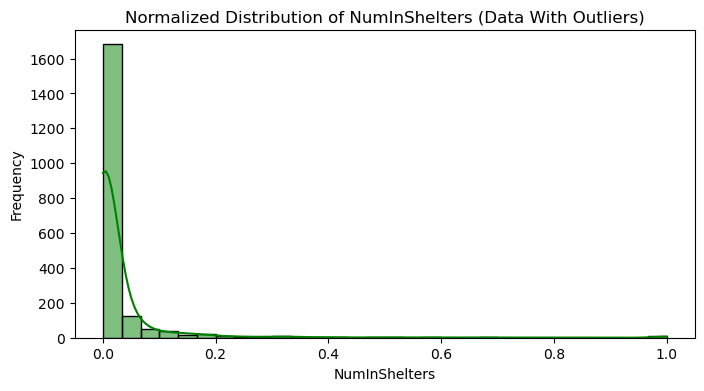


Feature: NumStreet
count    1994.000000
mean        0.022778
std         0.100400
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: NumStreet, dtype: float64


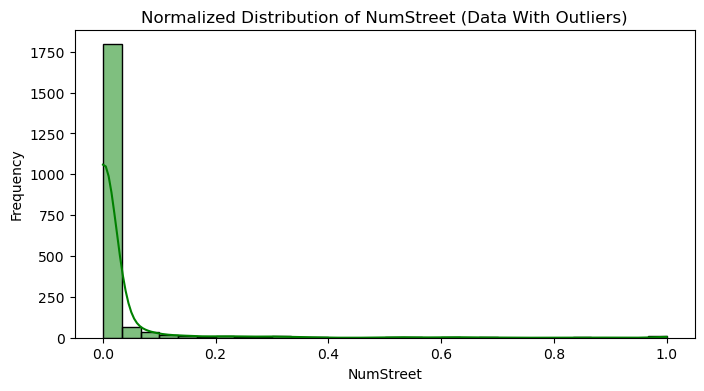


Feature: PctForeignBorn
count    1994.000000
mean        0.215552
std         0.231134
min         0.000000
25%         0.060000
50%         0.130000
75%         0.280000
max         1.000000
Name: PctForeignBorn, dtype: float64


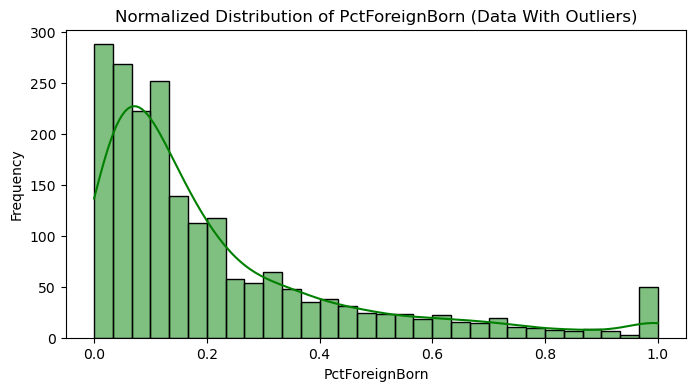


Feature: PctBornSameState
count    1994.000000
mean        0.608892
std         0.204329
min         0.000000
25%         0.470000
50%         0.630000
75%         0.777500
max         1.000000
Name: PctBornSameState, dtype: float64


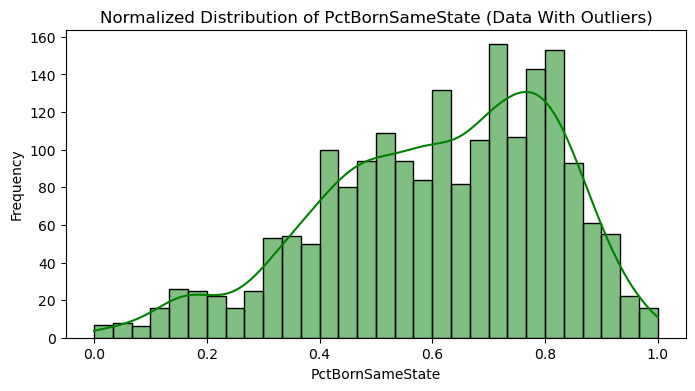


Feature: PctSameHouse85
count    1994.000000
mean        0.535050
std         0.181352
min         0.000000
25%         0.420000
50%         0.540000
75%         0.660000
max         1.000000
Name: PctSameHouse85, dtype: float64


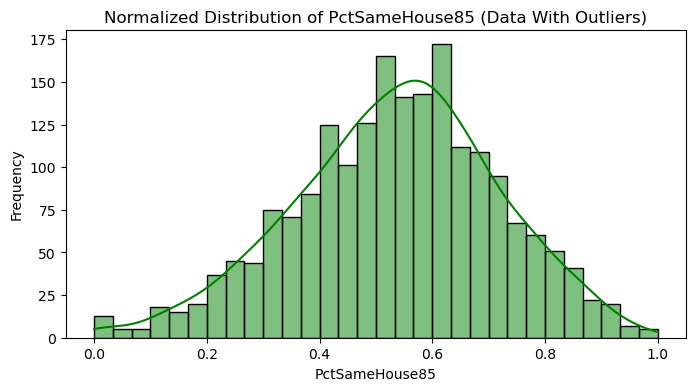


Feature: PctSameCity85
count    1994.000000
mean        0.626424
std         0.200521
min         0.000000
25%         0.520000
50%         0.670000
75%         0.770000
max         1.000000
Name: PctSameCity85, dtype: float64


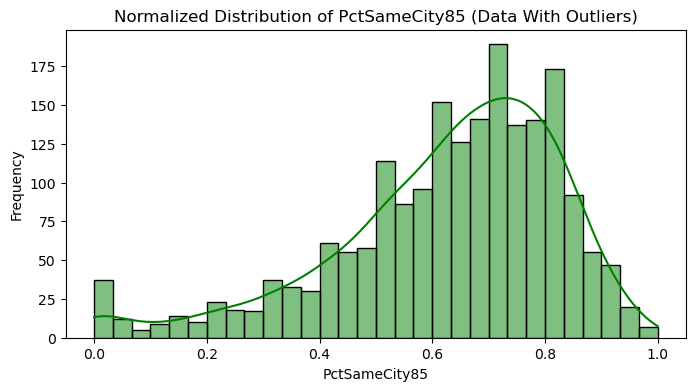


Feature: PctSameState85
count    1994.000000
mean        0.651530
std         0.198221
min         0.000000
25%         0.560000
50%         0.700000
75%         0.790000
max         1.000000
Name: PctSameState85, dtype: float64


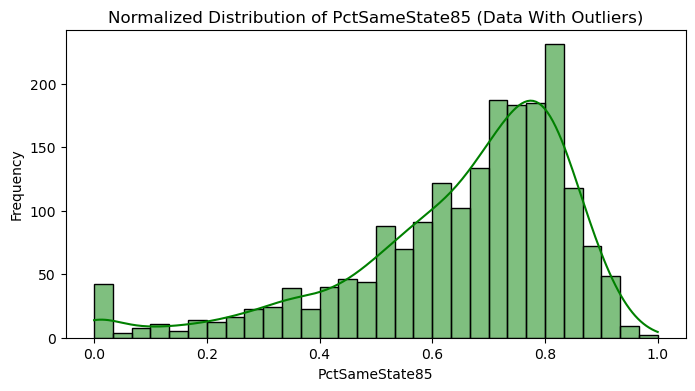


Feature: LandArea
count    1994.000000
mean        0.065231
std         0.109459
min         0.000000
25%         0.020000
50%         0.040000
75%         0.070000
max         1.000000
Name: LandArea, dtype: float64


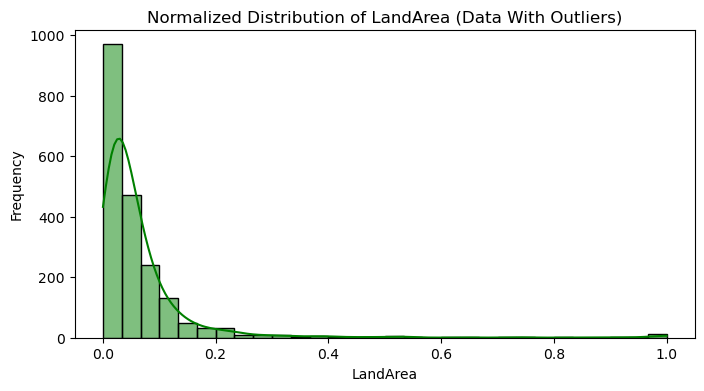


Feature: PopDens
count    1994.000000
mean        0.232854
std         0.203092
min         0.000000
25%         0.100000
50%         0.170000
75%         0.280000
max         1.000000
Name: PopDens, dtype: float64


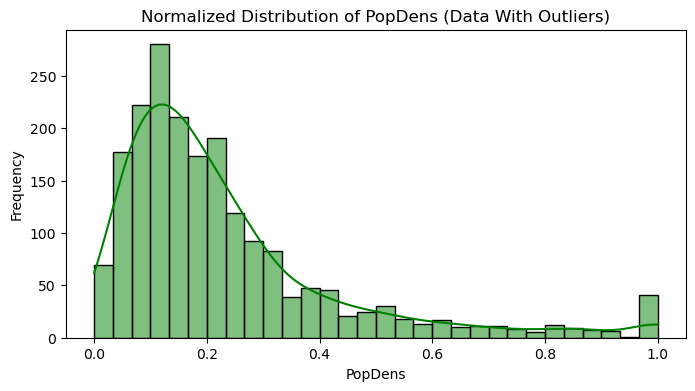


Feature: PctUsePubTrans
count    1994.000000
mean        0.161685
std         0.229055
min         0.000000
25%         0.020000
50%         0.070000
75%         0.190000
max         1.000000
Name: PctUsePubTrans, dtype: float64


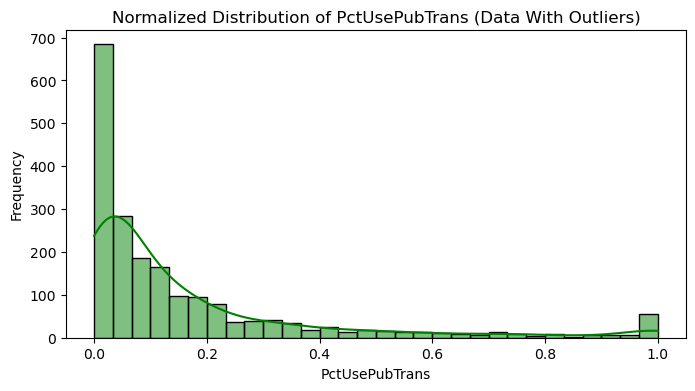


Feature: LemasPctOfficDrugUn
count    1994.000000
mean        0.094052
std         0.240328
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: LemasPctOfficDrugUn, dtype: float64


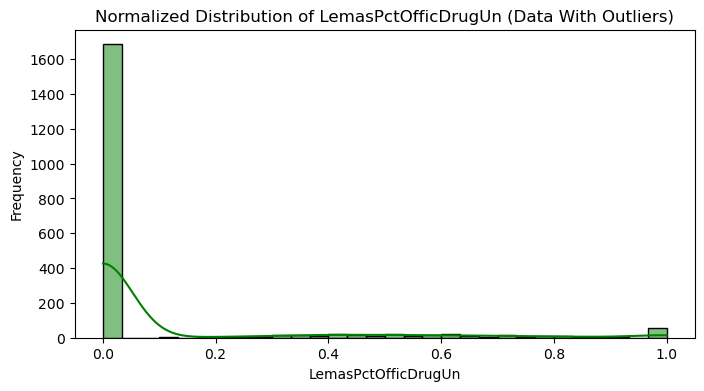


Feature: ViolentCrimesPerPop
count    1994.000000
mean        0.237979
std         0.232985
min         0.000000
25%         0.070000
50%         0.150000
75%         0.330000
max         1.000000
Name: ViolentCrimesPerPop, dtype: float64


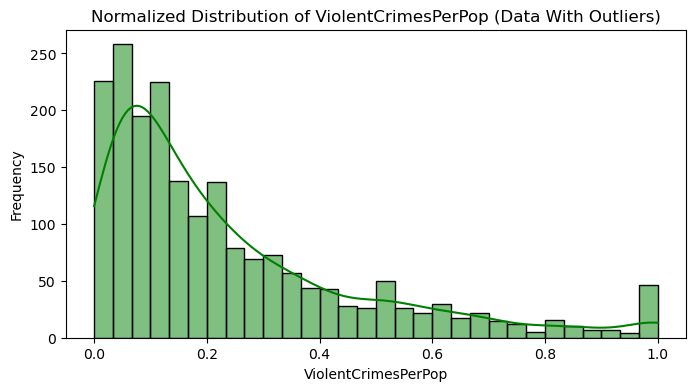


Feature: communityname
communityname
Greenvillecity      5
Jacksonvillecity    5
Auburncity          5
Athenscity          4
Springfieldcity     4
                   ..
RedondoBeachcity    1
GrantsPasscity      1
FortWorthcity       1
Raleighcity         1
Ontariocity         1
Name: count, Length: 1828, dtype: int64


C:\Users\mustapha\AppData\Local\Temp\ipykernel_20248\1628217508.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=dataset[feature], order=dataset[feature].value_counts().index, palette="viridis")


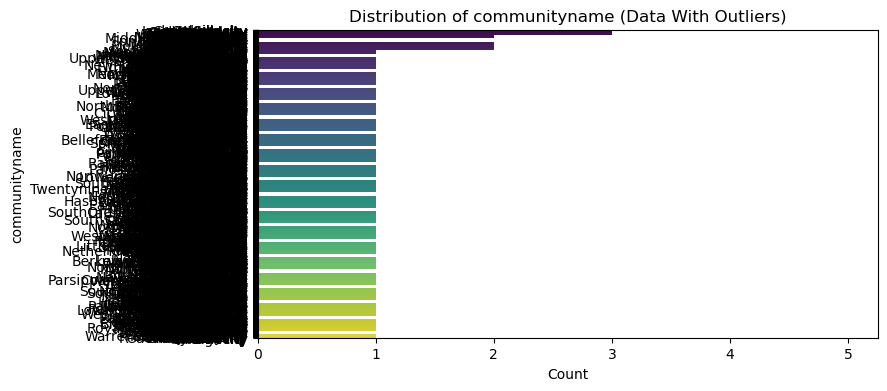

In [8]:
# Visualize the features for both datasets
datasets = {
    "Data Without Outliers": pd.read_csv("./final_data/communities+and+crime/data_final_no_outlier.csv"),
    "Data With Outliers": pd.read_csv("./final_data/communities+and+crime/data_final_with_outlier.csv")
}

for dataset_name, dataset in datasets.items():
    print(f"\n==== {dataset_name} ====")
    
    # Identify numeric and categorical features for the current dataset
    numeric_features = dataset.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_features = dataset.select_dtypes(include=['object', 'category']).columns.tolist()
    
    print(f"Numeric Features: {numeric_features}")
    print(f"Categorical Features: {categorical_features}")
    
    # Visualize numeric features
    for feature in numeric_features:
        print(f"\nFeature: {feature}")
        print(dataset[feature].describe())
        
        plt.figure(figsize=(8, 4))
        sns.histplot(dataset[feature], kde=True, bins=30, color='green')
        plt.title(f"Normalized Distribution of {feature} ({dataset_name})")
        plt.xlabel(feature)
        plt.ylabel("Frequency")
        plt.show()
    
    # Visualize categorical features
    for feature in categorical_features:
        print(f"\nFeature: {feature}")
        print(dataset[feature].value_counts())
        
        plt.figure(figsize=(8, 4))
        sns.countplot(y=dataset[feature], order=dataset[feature].value_counts().index, palette="viridis")
        plt.title(f"Distribution of {feature} ({dataset_name})")
        plt.ylabel(feature)
        plt.xlabel("Count")
        plt.show()